In [1]:

# cd /scratch/vito/
# chmod -R a+rwx scanpathes/

import glob
import os
import pickle
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import collections
import yaml
import matplotlib.image as mpimg
from matplotlib.lines import Line2D
from scipy import stats
import torch

from summary_plots import evaluate_all_obj, get_BDIR_per_frames, fovdur_vs_sacang, vonmises_kde, plot_fov_dur_sac_amp_hists #, plot_sac_ang_hists, plot_ior_stats, plot_object_eval

import visualization_eval_utils as veu
from visualization_eval_utils import fix_hist_step_vertical_line_at_end


In [2]:

def plot_emerging_stats(df_eval, ground_truth=None, ang_bins=30, sma_ws=5,
                        colors=["xkcd:blue", "xkcd:red"], summary_measure="mean", 
                        custom_name="Base model", obj_maxframes=90):
    
    fig, axs = plt.subplots(1, 2, dpi=150, figsize=(8, 3), sharey=False)
    kwargs = [{"alpha": 1, "lw": 3, "label": custom_name}]
    bdir_kwargs = [{"alpha": 1, "lw": 3}]

    if ground_truth is None:
        dfs = [df_eval]
    else:
        df_gt = ground_truth[ground_truth["video"].isin(df_eval["video"].unique())]
        dfs = [df_eval, df_gt]
        kwargs.append({"alpha": 1, "lw": 3, "label": "Humans"})
        bdir_kwargs.append({"alpha": 1, "lw": 2, "ls": "--"})

    for i, df in enumerate(dfs):
        x_vals, all = fovdur_vs_sacang(df, ang_bins, sma_ws, summary_measure)
        axs[1].plot(x_vals, all, color=colors[i], **kwargs[i])

    axs[1].set_xlabel('Change in saccade direction [°]', size=13)
    axs[1].set_xlim(-180, 180)
    # axs[0].set_yticks([200, 300, 400, 500, 600])
    axs[1].set_xticks([-180, -90, 0, 90, 180])
    axs[1].set_ylabel(f'Fov. dur. ({summary_measure}) [ms]', size=13)
    axs[1].tick_params(labelsize=12)
    axs[1].legend(labelspacing=0.3, prop={'size':9}, frameon=False)

    cols = ["xkcd:maroon", sns.color_palette("Dark2")[1], sns.color_palette("Dark2")[5], sns.color_palette("Dark2")[6]]
    labels = ["Background", "Detection", "Inspection", "Revisit"]
    for i, df in enumerate(dfs):
        ratios = get_BDIR_per_frames(df, obj_maxframes)
        for j in range(4):
            axs[0].plot(ratios[j], color=cols[j], **bdir_kwargs[i])
    axs[0].set_ylabel("Percentage", size=13)
    axs[0].set_xlabel("Time [frames]", size=13)
    axs[0].tick_params(labelsize=12)
    legend_elements = [Line2D([0], [0], color=cols[i], lw=2, label=labels[i]) for i in range(4)]
    # make legend smaller
    axs[0].legend(handles=legend_elements, loc="upper right", labelspacing=0.3, prop={'size':9}, frameon=False)  #, bbox_to_anchor=(1.2, 1.0))
    sns.despine(fig)
    fig.tight_layout()
    plt.show()
    

def merge_obj_dfs(df_eval, df_gt):
    df_gt_obj = evaluate_all_obj(df_gt, prefix="gt_")
    df_obj = evaluate_all_obj(df_eval, prefix="sim_")
    merged_df = pd.merge(df_gt_obj, df_obj, how="outer", on=['video', 'gt_object'])
    merged_df = merged_df[merged_df.gt_object != "nan"]
    merged_df = merged_df.fillna(0)
    return merged_df


def get_fovcat_ratio(eval_df):
    categories = ["B", "D", "I", "R"]
    eval_df = eval_df[eval_df["fov_category"].isin(categories)]
    ratios = {}
    full_dur = np.sum(eval_df.duration_ms)
    for cat in categories:
        ratio = (
            np.sum(eval_df[eval_df["fov_category"] == cat].duration_ms) / full_dur
        )
        ratios[cat] = ratio
    return ratios



def plot_object_comparison(df_eval, df_gt, df_other=None, other_name="", maxframes=90, savedir=None, name_flag="", title=""):
    df_gt = df_gt[df_gt["video"].isin(df_eval["video"].unique())]
    
    fig, axs = plt.subplots(1, 2, dpi=150, figsize=(8, 3), sharey=False)
    cols = ["xkcd:maroon", sns.color_palette("Dark2")[1], sns.color_palette("Dark2")[5], sns.color_palette("Dark2")[6]]
    datasource_cols = ["xkcd:red", "xkcd:blue", "xkcd:green"]
    labels = ["Background", "Detection", "Inspection", "Revisit"]
    # kwargs = [{"alpha": 1, "lw": 1}, {"alpha": 0.4, "lw": 3, "ls": "--"}]
    if df_other is not None: 
        dfs = [df_gt, df_eval, df_other]
        merged_df = merge_obj_dfs(df_other, df_gt)
        axs[1].scatter(merged_df['gt_tot_t'], merged_df['sim_tot_t'], marker='o', c=datasource_cols[2], alpha=0.25)
        slope, intercept, r_value, p_value, std_err = stats.linregress(merged_df['gt_tot_t'], merged_df['sim_tot_t'])
        print(f"{other_name}: slope: {slope}, intercept: {intercept}, r_value: {r_value}, p_value: {p_value}, std_err: {std_err}, r2 : {r_value ** 2}")
        axs[1].text(0.05, 0.85, other_name + r" $r^2$" + f"= {np.round(r_value ** 2, 2)}", transform=axs[1].transAxes, fontsize=10,
                    verticalalignment='top')
        axs[1].plot(merged_df['gt_tot_t'], intercept + slope * merged_df['gt_tot_t'], c=datasource_cols[2])

    else:
        dfs = [df_gt, df_eval]
    merged_df = merge_obj_dfs(df_eval, df_gt)
    axs[1].scatter(merged_df['gt_tot_t'], merged_df['sim_tot_t'], marker='x', c=datasource_cols[1], alpha=0.25)
    slope, intercept, r_value, p_value, std_err = stats.linregress(merged_df['gt_tot_t'], merged_df['sim_tot_t'])
    print(f"slope: {slope}, intercept: {intercept}, r_value: {r_value}, p_value: {p_value}, std_err: {std_err}, r2 : {r_value ** 2}")
    axs[1].text(0.05, 0.95, r"$r^2$" + f"= {np.round(r_value ** 2, 2)}", transform=axs[1].transAxes, fontsize=10,
                verticalalignment='top')
    axs[1].plot(merged_df['gt_tot_t'], intercept + slope * merged_df['gt_tot_t'], c=datasource_cols[1])

    axs[1].plot([0, merged_df['gt_tot_t'].max()], [0, merged_df['gt_tot_t'].max()], ls=":", color="k")

    for i, df in enumerate(dfs):
        ratios = get_BDIR_per_frames(df, maxframes)
        for j in range(4):
            axs[0].plot(ratios[j], color=datasource_cols[i], lw=3, alpha=0.5)
            axs[0].plot(ratios[j], color=cols[j], lw=2, ls="--")  #, **kwargs[i])
            

    axs[0].set_ylabel("Percentage")
    axs[0].set_xlabel("Time [frames]")
    legend_elements = [Line2D([0], [0], color=cols[i], lw=2, label=labels[i]) for i in range(4)]
    axs[0].legend(handles=legend_elements)

    axs[1].set_ylabel("Model total dwell time [s]")  # \n(mean for objects across runs)
    axs[1].set_xlabel("Human total dwell time [s]")  # (mean for each object across subjects)
    axs[1].set_xticks([0, 1000, 2000, 3000], [0,1,2,3])
    axs[1].set_yticks([0, 1000, 2000, 3000], [0,1,2,3])
    fig.suptitle(title)
    sns.despine(fig)
    fig.tight_layout()
    plt.show()
    
label_dict = {"dv": r"DDM threshold $\theta$",
              "sig" : r"DDM noise level $s$",
              "sens" : 'Size of Gaussian sensitivity [dva]',
              "task" : "Added number: Saliency",
              "entropy" : "Added number: Uncertainty"
             }


# Bug fixed, final eval

In [4]:
np_runs = veu.check_grid_result_completeness("_no_prompt_grid_5seeds", exclude_in_name=[])
df_train_gt = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_train.csv", index_col=0)
df_np = veu.eval_runs_to_dataframe_4d_grid_all(np_runs, df_train_gt)

In [4]:
df_np.sort_values("fit_fd_sa", ascending=True).head(50)

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
29,"(0.0, 0.5, 5.5, 0.4)",351.949958,320.644861,2.148501,1.587594,0.032371,0.101487,0.266219,0.161232,0.862445,0.635980,0.322068,0.213726,0.249840,0.263824
28,"(0.0, 0.5, 5.5, 0.35)",355.083845,324.298691,2.130789,1.521005,0.028244,0.122683,0.282701,0.151509,0.847652,0.630078,0.301958,0.217105,0.245389,0.268044
24,"(0.0, 0.5, 5.0, 0.4)",314.762875,286.987099,2.200412,1.574098,0.037588,0.119812,0.262884,0.185286,0.753460,0.582132,0.303486,0.224085,0.250552,0.288679
27,"(0.0, 0.5, 5.5, 0.3)",360.252334,326.887637,2.083609,1.470946,0.036705,0.111907,0.283061,0.172750,0.818046,0.621908,0.298895,0.227906,0.251569,0.277968
34,"(0.0, 0.5, 6.0, 0.4)",381.935090,346.765594,2.183945,1.596749,0.037072,0.101711,0.257652,0.200685,0.797426,0.573895,0.292936,0.229168,0.250424,0.294814
22,"(0.0, 0.5, 5.0, 0.3)",323.722417,297.935016,2.101093,1.456718,0.030571,0.122285,0.287339,0.174540,0.834461,0.634299,0.356526,0.230939,0.272802,0.275860
23,"(0.0, 0.5, 5.0, 0.35)",316.743529,289.511614,2.114113,1.491410,0.049606,0.114173,0.271777,0.190311,0.799094,0.617287,0.306020,0.231044,0.256036,0.281601
21,"(0.0, 0.5, 5.0, 0.25)",327.558949,300.633566,2.053250,1.445714,0.044752,0.102522,0.297819,0.172126,0.785995,0.591638,0.360097,0.234973,0.276681,0.292769
20,"(0.0, 0.5, 5.0, 0.2)",328.976721,303.438906,2.025163,1.444864,0.037582,0.116013,0.301996,0.169681,0.809232,0.611138,0.308375,0.235838,0.260017,0.286846
26,"(0.0, 0.5, 5.5, 0.25)",367.233242,340.297405,2.024554,1.448242,0.037409,0.110401,0.305956,0.177796,0.789488,0.625497,0.242609,0.241876,0.242120,0.286085


In [9]:
gt_runs = veu.check_grid_result_completeness("_gt_obj_grid_5seeds_", exclude_in_name=[])
df_train_gt = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_train.csv", index_col=0)
df_gt = veu.eval_runs_to_dataframe_4d_grid_all(gt_runs, df_train_gt)

In [10]:
df_gt.sort_values("fit_fd_sa", ascending=True).head(50)

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
14,"(0.0, 0.5, 4.0, 0.4)",361.511030,316.811211,3.541873,2.649496,0.024221,0.134948,0.051117,0.093333,0.793778,0.698495,0.340926,0.072225,0.161792,0.148652
13,"(0.0, 0.5, 4.0, 0.35)",365.795136,321.514017,3.461072,2.564174,0.042105,0.108772,0.067873,0.092427,0.839278,0.720279,0.343844,0.080150,0.168048,0.146673
19,"(0.0, 0.5, 4.5, 0.4)",408.709072,355.826023,3.758098,2.885583,0.024291,0.137652,0.049564,0.120385,0.810114,0.664910,0.320464,0.084975,0.163471,0.168346
12,"(0.0, 0.5, 4.0, 0.3)",369.586447,319.164036,3.177871,2.364158,0.035461,0.109929,0.106107,0.088901,0.833604,0.663866,0.361529,0.097504,0.185512,0.177047
18,"(0.0, 0.5, 4.5, 0.35)",408.026181,361.607565,3.504295,2.518177,0.028226,0.120968,0.071173,0.123930,0.845886,0.682155,0.347866,0.097551,0.180990,0.170983
10,"(0.0, 0.5, 4.0, 0.2)",376.709507,331.509425,3.334019,2.440053,0.043636,0.120000,0.104520,0.100289,0.862315,0.651115,0.405390,0.102404,0.203399,0.184564
11,"(0.0, 0.5, 4.0, 0.25)",371.882287,325.755105,3.099212,2.380478,0.057143,0.107143,0.120215,0.088416,0.874938,0.690776,0.384045,0.104315,0.197559,0.172618
15,"(0.0, 0.5, 4.5, 0.2)",423.612643,386.356234,3.567494,2.621816,0.016949,0.139831,0.069800,0.156522,0.834316,0.664695,0.348158,0.113161,0.191493,0.187209
16,"(0.0, 0.5, 4.5, 0.25)",415.372548,374.870531,3.669781,2.947601,0.033058,0.144628,0.064829,0.162328,0.862021,0.688755,0.332076,0.113578,0.186411,0.179467
8,"(0.0, 0.5, 3.5, 0.35)",324.733395,287.592794,3.207902,2.337188,0.015152,0.127273,0.100028,0.134317,0.812936,0.685417,0.370113,0.117173,0.201486,0.182976


In [4]:
base_runs = veu.check_grid_result_completeness("_base_4d_grid_5seeds", exclude_in_name=[])
print(len(base_runs))
df_train_gt = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_train.csv", index_col=0)
df_base = veu.eval_runs_to_dataframe_4d_grid_all(base_runs, df_train_gt)
df_plotruns = df_base[df_base["(task, entropy, dv, sig)"].apply(lambda x: x[3] < 0.45)]
df_plotruns.sort_values("fit_fd_sa", ascending=True).head(10)

497


,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
7,"(0.0, 0.0, 2.5, 0.25)",377.424395,304.691744,3.517063,2.655375,0.028436,0.163033,0.072157,0.054369,0.721030,0.569866,0.257745,0.063263,0.128090,0.185553
6,"(0.0, 0.0, 2.5, 0.2)",417.149727,318.007336,3.013483,2.238537,0.023013,0.147490,0.128414,0.029043,0.752208,0.622510,0.299777,0.078728,0.152411,0.178316
50,"(0.0, 0.11, 3.0, 0.3)",384.567300,315.884025,3.263932,2.526836,0.029894,0.139826,0.092190,0.068693,0.702686,0.609800,0.251117,0.080442,0.137333,0.183694
15,"(0.0, 0.0, 3.0, 0.35)",378.844176,319.286785,4.213946,3.282698,0.030593,0.151052,0.096625,0.065630,0.641353,0.598909,0.244103,0.081128,0.135453,0.187782
228,"(0.11, 0.11, 4.0, 0.4)",353.732835,313.499367,3.742300,2.995869,0.032028,0.129004,0.063580,0.103916,0.585689,0.512623,0.203035,0.083748,0.123511,0.218291
51,"(0.0, 0.11, 3.0, 0.35)",340.977629,295.571955,3.598307,2.713822,0.034276,0.144816,0.050905,0.117346,0.667626,0.658601,0.169560,0.084125,0.112603,0.169883
14,"(0.0, 0.0, 3.0, 0.3)",434.951292,349.090079,3.671605,2.818287,0.026316,0.146930,0.054882,0.114873,0.739638,0.612469,0.293071,0.084878,0.154275,0.185762
96,"(0.0, 0.25, 3.5, 0.4)",344.658528,297.509208,3.440889,2.554619,0.032007,0.141869,0.069106,0.107513,0.636025,0.603952,0.191698,0.088310,0.122773,0.190889
8,"(0.0, 0.0, 2.5, 0.3)",337.359506,281.012759,3.976981,2.951893,0.028912,0.164966,0.058108,0.121420,0.619019,0.592812,0.240587,0.089764,0.140038,0.195572
201,"(0.11, 0.0, 3.0, 0.1)",348.002025,284.548759,3.318100,2.602504,0.028796,0.163176,0.062242,0.117325,0.739753,0.646894,0.244531,0.089783,0.141366,0.177558


In [10]:
df_umin = df_plotruns[df_plotruns["(task, entropy, dv, sig)"].apply(lambda x: x[1] == 1.)]
df_umin.sort_values("fit_fd_sa", ascending=True).head(5)

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
183,"(0.0, 1.0, 5.0, 0.25)",347.640514,302.492253,2.638703,1.901165,0.029488,0.113617,0.178479,0.113794,0.846951,0.666438,0.342600,0.146136,0.211624,0.208612
184,"(0.0, 1.0, 5.0, 0.3)",349.272414,303.793869,2.593013,1.885677,0.028746,0.127178,0.196027,0.113428,0.838148,0.656313,0.314676,0.154727,0.208043,0.217714
190,"(0.0, 1.0, 5.5, 0.4)",373.272353,327.761206,2.689840,1.965157,0.038211,0.118360,0.186687,0.124589,0.825558,0.658548,0.268182,0.155638,0.193153,0.217576
182,"(0.0, 1.0, 5.0, 0.2)",356.231508,310.623709,2.655551,2.025355,0.031111,0.116444,0.204210,0.107492,0.871402,0.668805,0.349657,0.155851,0.220453,0.214299
181,"(0.0, 1.0, 5.0, 0.1)",353.106546,306.422223,2.534396,1.871210,0.030810,0.129401,0.211953,0.109599,0.843641,0.634769,0.364705,0.160776,0.228752,0.228927


In [5]:
base_runs = veu.check_grid_result_completeness("_final_base_4d_grid_5seeds", exclude_in_name=[])
len(base_runs)

422

In [6]:
df_train_gt = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_train.csv", index_col=0)
df_base = veu.eval_runs_to_dataframe_4d_grid_all(base_runs, df_train_gt)

In [7]:
df_umin = df_base[df_base["(task, entropy, dv, sig)"].apply(lambda x: x[1] == 1.0)]
df_umin.sort_values("fit_fd_sa", ascending=True).head(5)

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
183,"(0.0, 1.0, 5.0, 0.25)",347.640514,302.492253,2.638703,1.901165,0.029488,0.113617,0.178479,0.113794,0.846951,0.666438,0.342600,0.146136,0.211624,0.208612
184,"(0.0, 1.0, 5.0, 0.3)",349.272414,303.793869,2.593013,1.885677,0.028746,0.127178,0.196027,0.113428,0.838148,0.656313,0.314676,0.154727,0.208043,0.217714
190,"(0.0, 1.0, 5.5, 0.4)",373.272353,327.761206,2.689840,1.965157,0.038211,0.118360,0.186687,0.124589,0.825558,0.658548,0.268182,0.155638,0.193153,0.217576
182,"(0.0, 1.0, 5.0, 0.2)",356.231508,310.623709,2.655551,2.025355,0.031111,0.116444,0.204210,0.107492,0.871402,0.668805,0.349657,0.155851,0.220453,0.214299
181,"(0.0, 1.0, 5.0, 0.1)",353.106546,306.422223,2.534396,1.871210,0.030810,0.129401,0.211953,0.109599,0.843641,0.634769,0.364705,0.160776,0.228752,0.228927


In [8]:
df_plotruns = df_base[df_base["(task, entropy, dv, sig)"].apply(lambda x: x[3] < 0.45)]
df_plotruns.sort_values("fit_fd_sa", ascending=True).head(10)

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
7,"(0.0, 0.0, 2.5, 0.25)",377.424395,304.691744,3.517063,2.655375,0.028436,0.163033,0.072157,0.054369,0.721030,0.569866,0.257745,0.063263,0.128090,0.185553
6,"(0.0, 0.0, 2.5, 0.2)",417.149727,318.007336,3.013483,2.238537,0.023013,0.147490,0.128414,0.029043,0.752208,0.622510,0.299777,0.078728,0.152411,0.178316
50,"(0.0, 0.11, 3.0, 0.3)",384.567300,315.884025,3.263932,2.526836,0.029894,0.139826,0.092190,0.068693,0.702686,0.609800,0.251117,0.080442,0.137333,0.183694
15,"(0.0, 0.0, 3.0, 0.35)",378.844176,319.286785,4.213946,3.282698,0.030593,0.151052,0.096625,0.065630,0.641353,0.598909,0.244103,0.081128,0.135453,0.187782
51,"(0.0, 0.11, 3.0, 0.35)",340.977629,295.571955,3.598307,2.713822,0.034276,0.144816,0.050905,0.117346,0.667626,0.658601,0.169560,0.084125,0.112603,0.169883
14,"(0.0, 0.0, 3.0, 0.3)",434.951292,349.090079,3.671605,2.818287,0.026316,0.146930,0.054882,0.114873,0.739638,0.612469,0.293071,0.084878,0.154275,0.185762
96,"(0.0, 0.25, 3.5, 0.4)",344.658528,297.509208,3.440889,2.554619,0.032007,0.141869,0.069106,0.107513,0.636025,0.603952,0.191698,0.088310,0.122773,0.190889
8,"(0.0, 0.0, 2.5, 0.3)",337.359506,281.012759,3.976981,2.951893,0.028912,0.164966,0.058108,0.121420,0.619019,0.592812,0.240587,0.089764,0.140038,0.195572
200,"(0.11, 0.0, 3.0, 0.1)",348.002025,284.548759,3.318100,2.602504,0.028796,0.163176,0.062242,0.117325,0.739753,0.646894,0.244531,0.089783,0.141366,0.177558
103,"(0.0, 0.25, 4.0, 0.4)",404.225808,350.876871,3.379256,2.557461,0.034518,0.137056,0.048259,0.137942,0.714102,0.644070,0.214135,0.093100,0.133445,0.180710


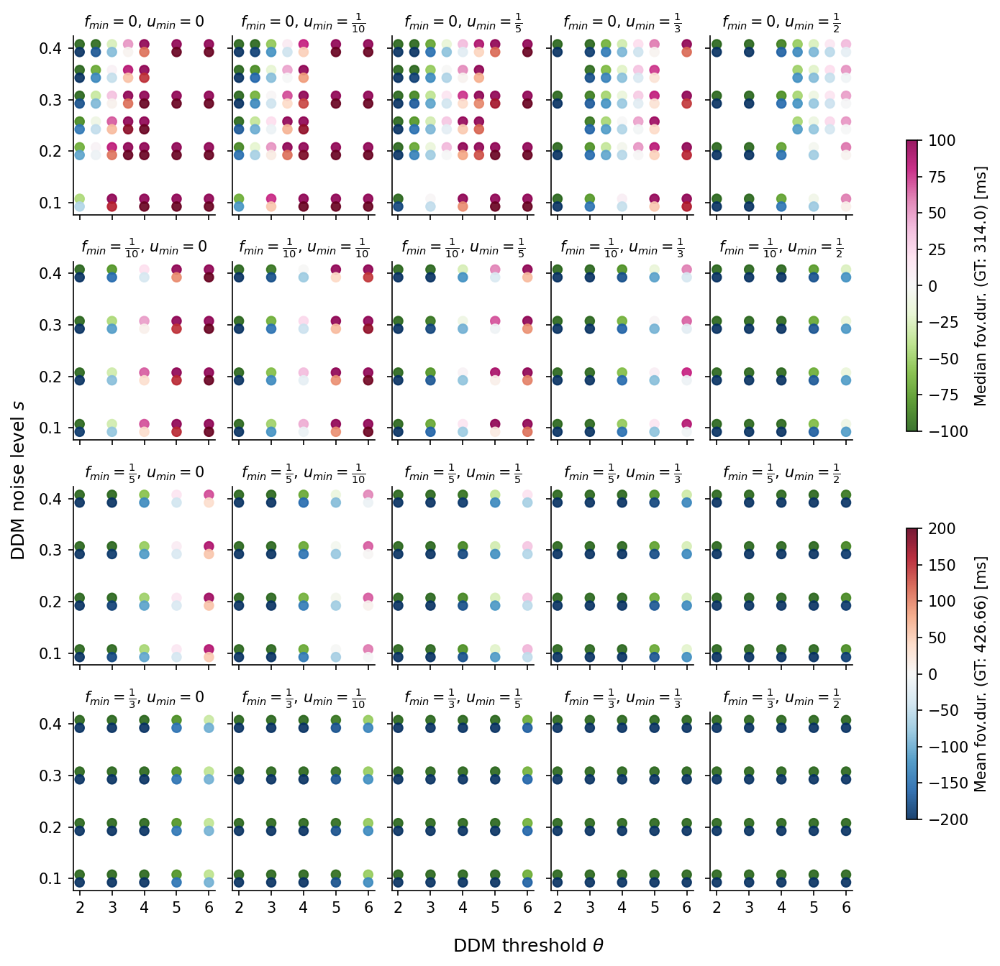

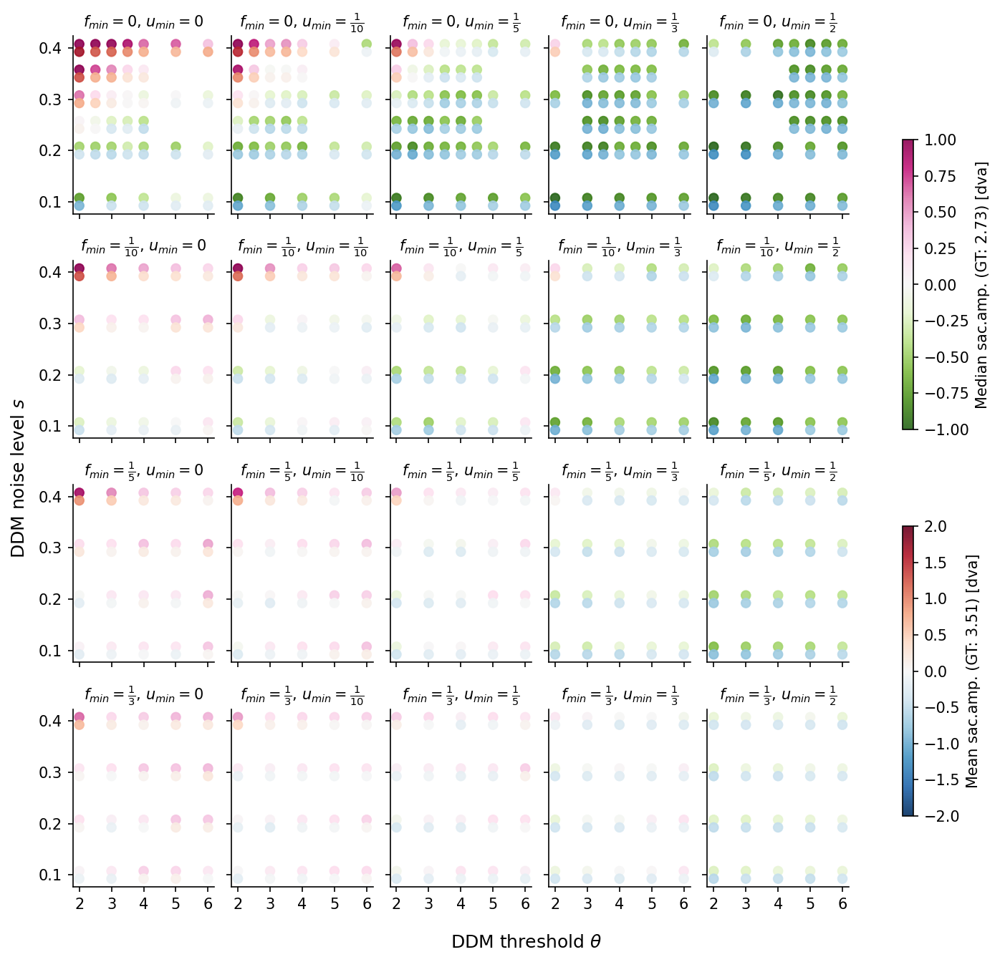

In [13]:
plot_4d_grid(df_plotruns, df_train_gt, metric="fov_dur")
plot_4d_grid(df_plotruns, df_train_gt, metric="sac_amp")

In [12]:
def plot_4d_grid(df_res, df_gt, metric="fov_dur", save_name=None):
    parcol = df_res.columns[0]
    p1 = parcol.split(",")[0][1:]
    p2 = parcol.split(",")[1][1:]
    p3 = parcol.split(",")[2][1:]
    p4 = parcol.split(",")[3][1:-1]

    p1_values, p2_values, p3_values, p4_values = zip(*df_res[parcol])
    # add arbitrary threshold here?!
    # p1_values = [x for x in p1_values if x < 0.9]
    p1_unival = np.array(np.unique(np.array(p1_values)))
    p2_unival = np.array(np.unique(np.array(p2_values)))
    p3_unival = np.array(np.unique(np.array(p3_values)))
    p4_unival = np.array(np.unique(np.array(p4_values)))
    
    frac_strs = [r"$0$", r"$\frac{1}{10}$", r"$\frac{1}{5}$", r"$\frac{1}{3}$", r"$\frac{1}{2}$"]

    fig, axs = plt.subplots(len(p1_unival), len(p2_unival), figsize=(10,9), sharex=True, sharey=True, dpi=150)
    cmap_q1, cmap_q2 = 'PiYG_r', 'RdBu_r'

    if metric == "fov_dur":
        # fig.suptitle('Foveation Duration', fontsize=16)
        mean_gt = np.nanmean(df_gt["duration_ms"])
        median_gt = np.nanmedian(df_gt["duration_ms"])
        c_label_q1 = f'Median fov.dur. (GT: {round(median_gt, 2)}) [ms]'
        c_label_q2 = f'Mean fov.dur. (GT: {round(mean_gt, 2)}) [ms]'
        vmin_q1, vmax_q1 = -100, 100
        vmin_q2, vmax_q2 = -200, 200
    elif metric == "sac_amp":
        # fig.suptitle('Saccade Amplitude', fontsize=16)
        mean_gt = np.nanmean(df_gt["sac_amp_dva"])
        median_gt = np.nanmedian(df_gt["sac_amp_dva"])
        c_label_q1 = f'Median sac.amp. (GT: {round(median_gt, 2)}) [dva]'
        c_label_q2 = f'Mean sac.amp. (GT: {round(mean_gt, 2)}) [dva]'
        vmin_q1, vmax_q1 = -1, 1
        vmin_q2, vmax_q2 = -2, 2
    else:
        raise ValueError("Invalid metric specified.")

    for row, p1_val in enumerate(p1_unival):
        for col, p2_val in enumerate(p2_unival):
            df_p12 = df_res[(df_res[parcol].str[0] == p1_val) & (df_res[parcol].str[1] == p2_val)]
            if not df_p12.empty:
                _, _, p3_12_values, p4_12_values = zip(*df_p12[parcol])
            else:
                p3_12_values = [np.nan]
                p4_12_values = [np.nan]
            p3_12_values = np.array(p3_12_values)
            p4_12_values = np.array(p4_12_values)
            
            if metric == "fov_dur":
                c_q1_values = df_p12["median_fd"] - median_gt
                c_q2_values = df_p12["mean_fd"] - mean_gt
            elif metric == "sac_amp":
                c_q1_values = df_p12["median_sa"] - median_gt
                c_q2_values = df_p12["mean_sa"] - mean_gt
            else:
                raise ValueError("Invalid metric specified.")

            scatter_q1 = axs[row, col].scatter(p3_12_values, p4_12_values + (p4_12_values.max() - p4_12_values.min()) / 40, c=c_q1_values, cmap=cmap_q1, marker='o', vmin=vmin_q1, vmax=vmax_q1, alpha=0.9)
            axs[row, col].spines[['right', 'top']].set_visible(False)
            axs[row, col].set_xticks([2,3,4,5,6])
            axs[row, col].set_yticks([0.1, 0.2, 0.3, 0.4])
            axs[row, col].set_title(r"$f_{min}=$" + frac_strs[row] + r", $u_{min}=$"+ frac_strs[col], fontsize=10)
            scatter_q2 = axs[row, col].scatter(p3_12_values, p4_12_values - (p4_12_values.max() - p4_12_values.min()) / 40, c=c_q2_values, cmap=cmap_q2, marker='o', vmin=vmin_q2, vmax=vmax_q2, alpha=0.9)
    
    fig.supxlabel(label_dict[p3])
    fig.supylabel(label_dict[p4])

    plt.tight_layout()
    fig.subplots_adjust(right=0.8)
    cbar_ax = fig.add_axes([0.85, 0.15, 0.01, 0.3])
    fig.colorbar(scatter_q2, cax=cbar_ax, label=c_label_q2)
    cbar_ax = fig.add_axes([0.85, 0.55, 0.01, 0.3])
    fig.colorbar(scatter_q1, cax=cbar_ax, label=c_label_q1)
    plt.show()


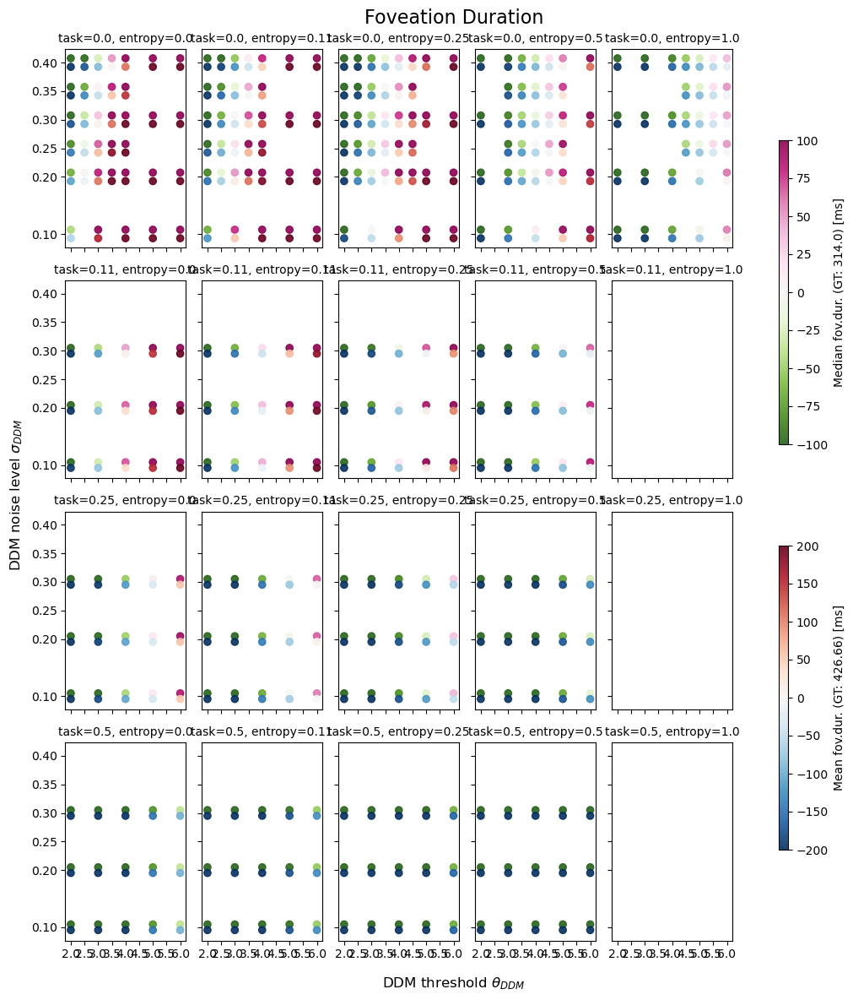

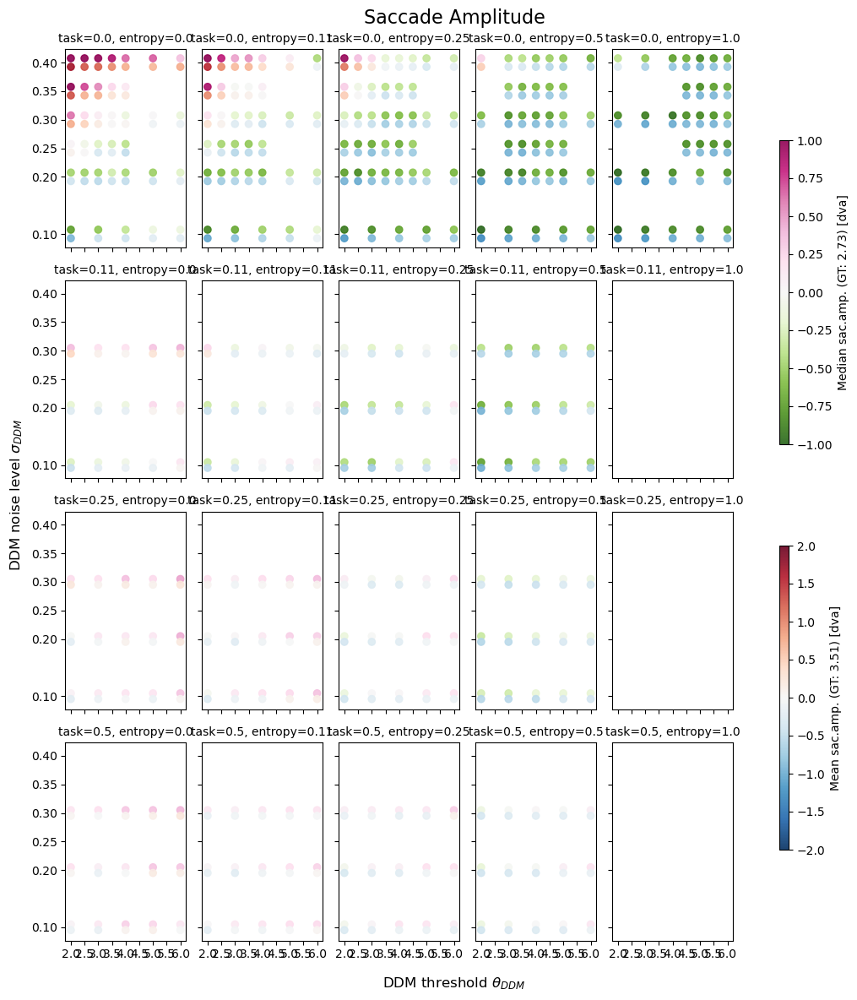

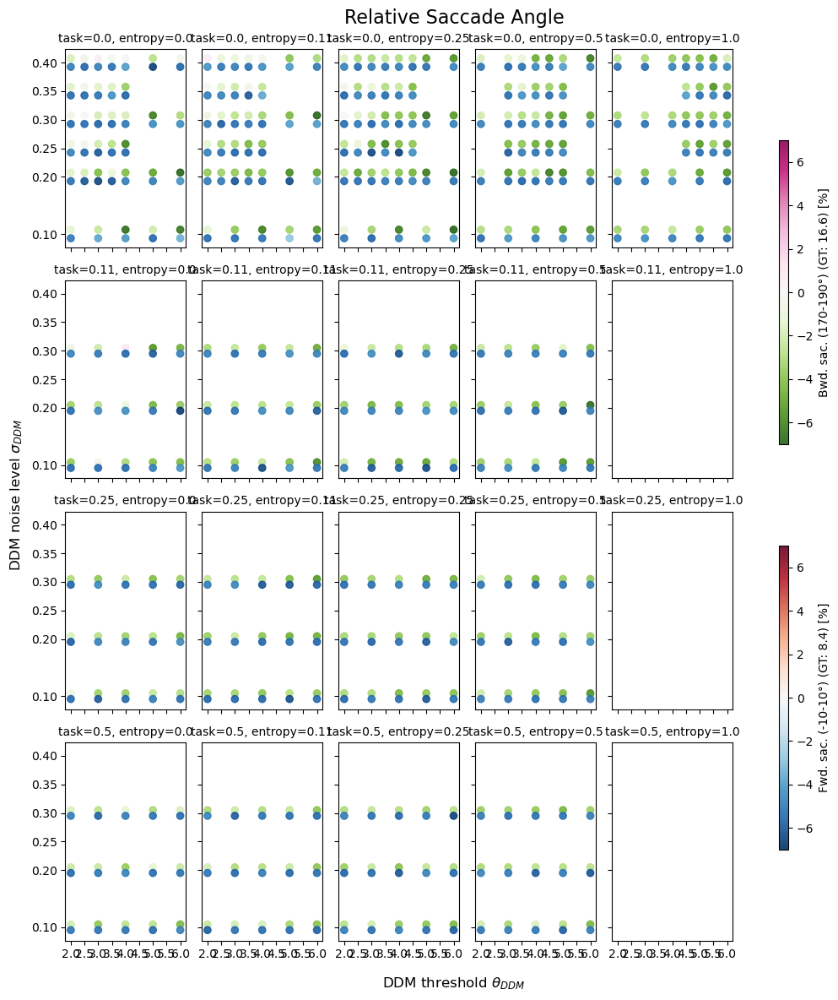

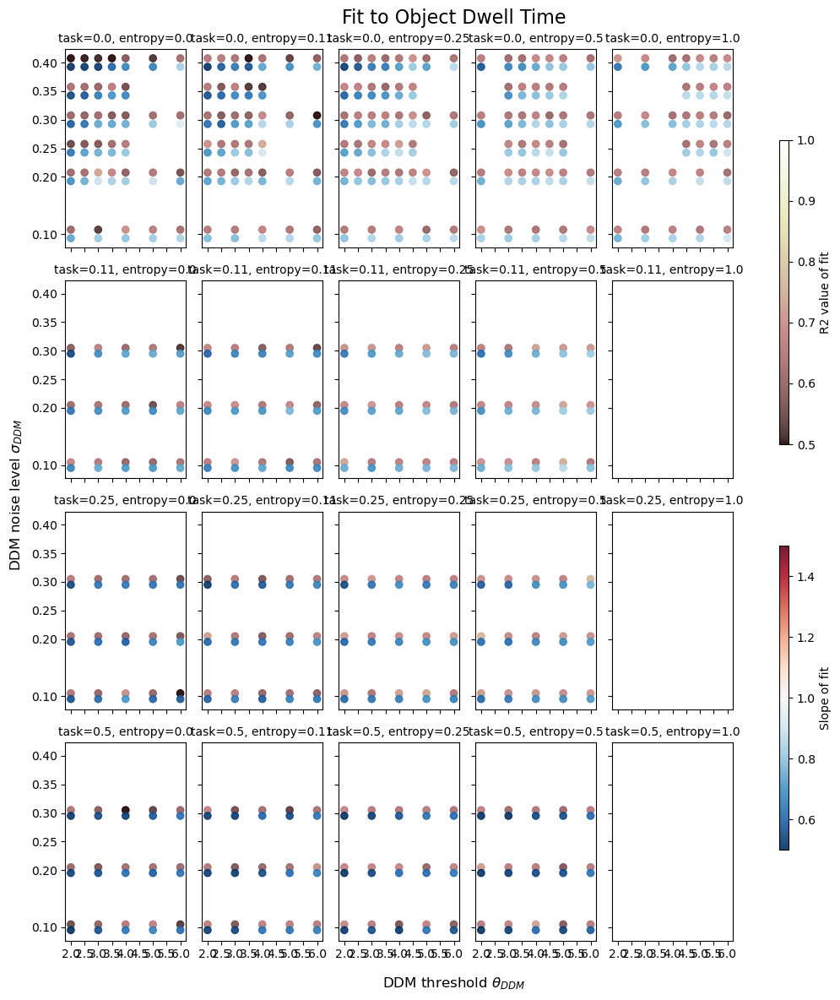

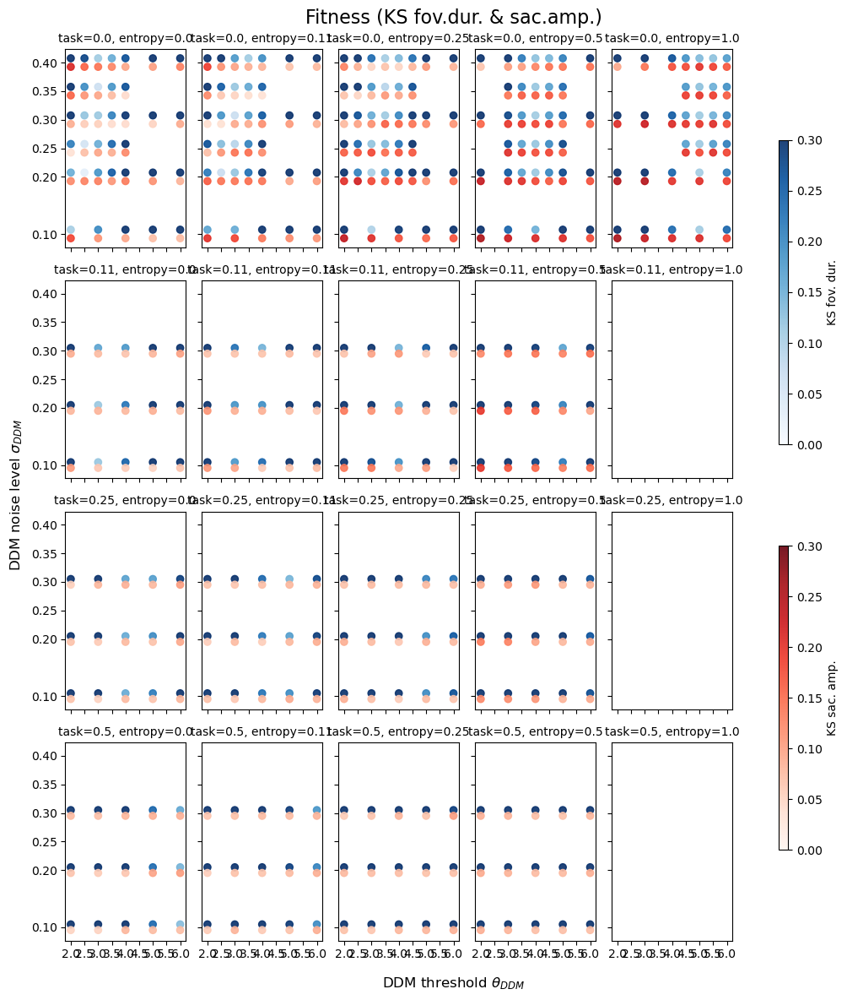

In [10]:
df_plotruns = df_base[df_base["(task, entropy, dv, sig)"].apply(lambda x: x[3] < 0.45)]
# df_plotruns = df_plotruns[df_plotruns["(task, entropy, dv, sig)"]#.apply(lambda x: x[1] < 1.0)]

veu.plot_all_4d_grid(df_plotruns, df_train_gt)

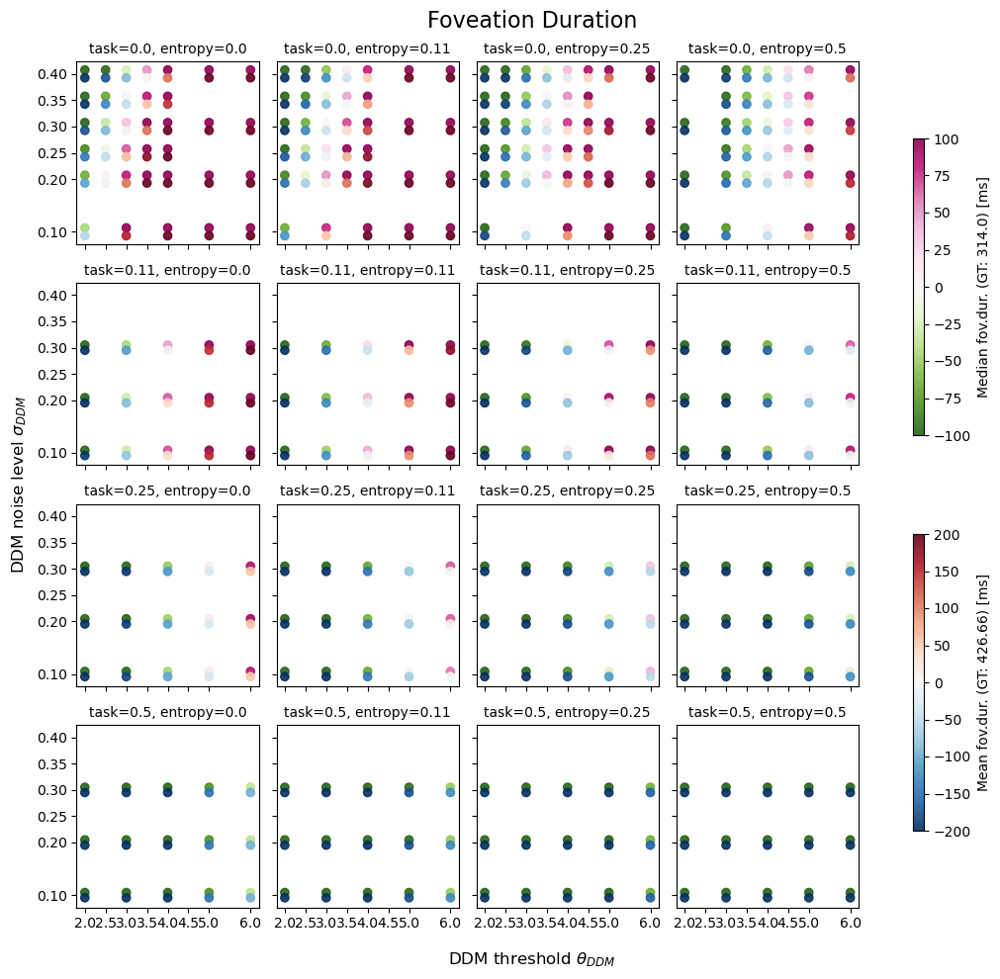

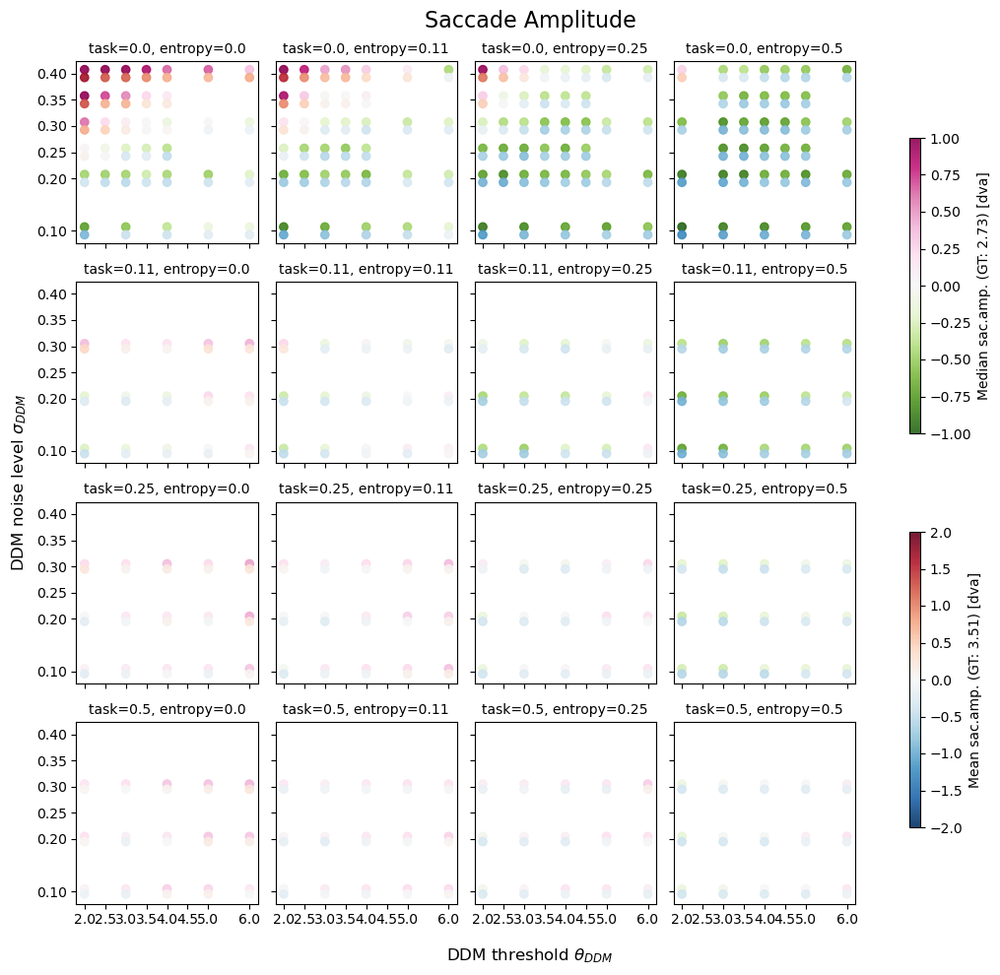

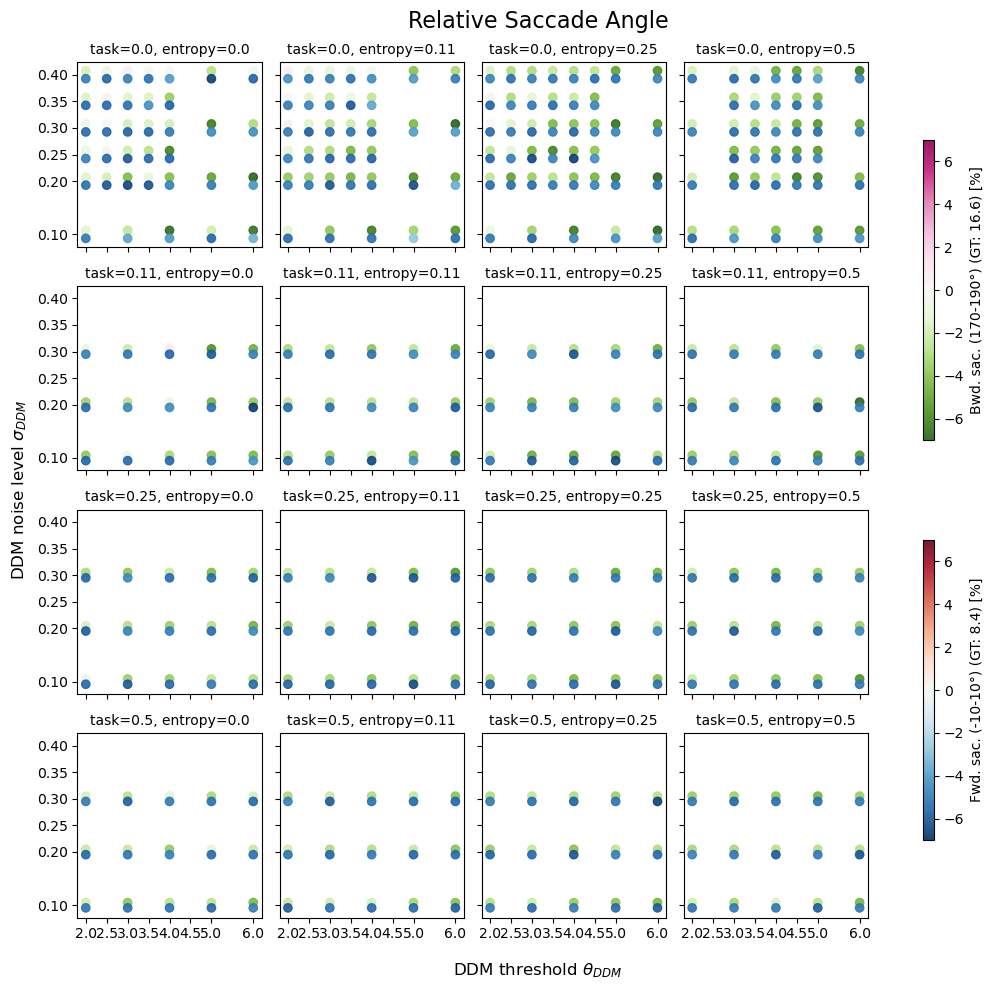

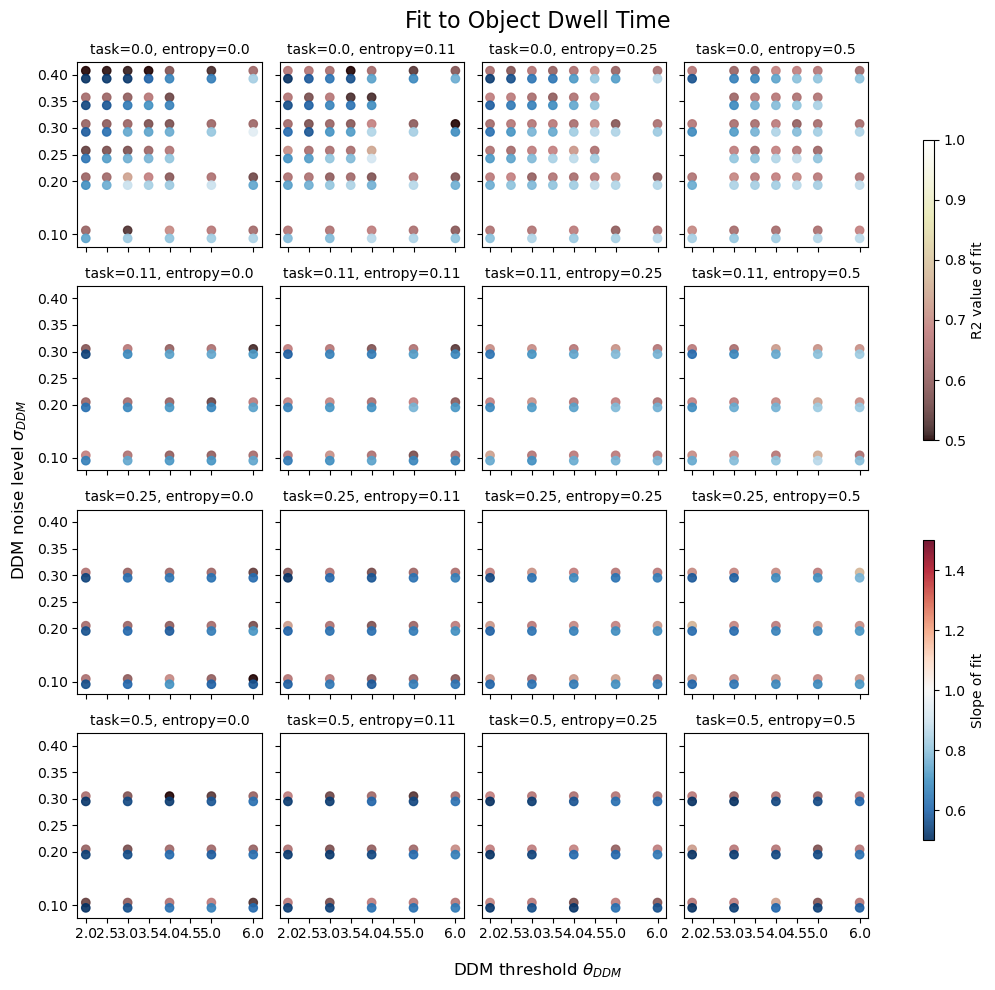

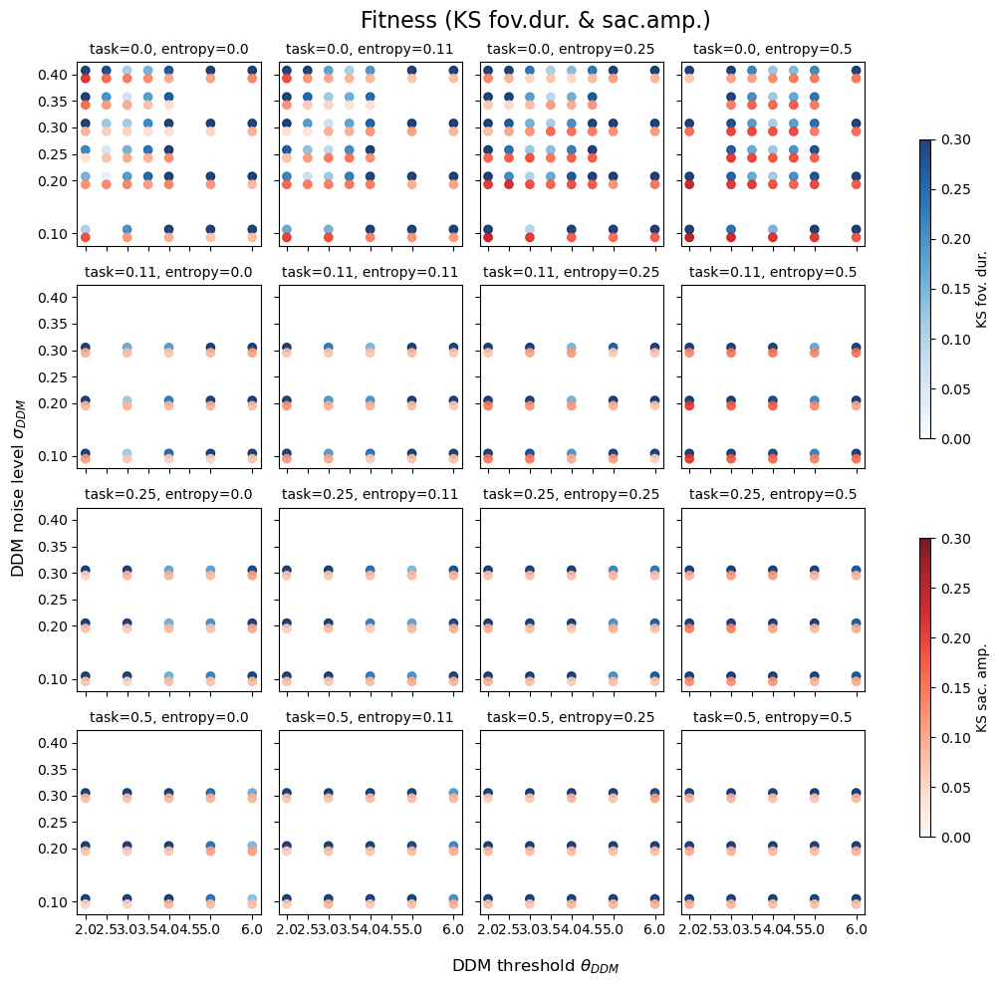

In [18]:
df_plotruns = df_base[df_base["(task, entropy, dv, sig)"].apply(lambda x: x[1] < 1.0)]
df_plotruns = df_plotruns[df_plotruns["(task, entropy, dv, sig)"].apply(lambda x: x[3] < 0.45)]

veu.plot_all_4d_grid(df_plotruns, df_train_gt)

In [4]:
df_train_gt = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_train.csv", index_col=0)
df_base = veu.eval_runs_to_dataframe_4d_grid_all(base_runs, df_train_gt)

In [5]:
df_base.sort_values("fit_fd_sa", ascending=True).head(50)


,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
7,"(0.0, 0.0, 2.5, 0.25)",377.424395,304.691744,3.517063,2.655375,0.028436,0.163033,0.072157,0.054369,0.721030,0.569866,0.257745,0.063263,0.128090,0.185553
104,"(0.0, 0.25, 4.0, 0.45)",378.981129,327.312773,3.743139,2.899588,0.033365,0.151573,0.047593,0.101103,0.590068,0.554502,0.167951,0.074348,0.105549,0.198065
6,"(0.0, 0.0, 2.5, 0.2)",417.149727,318.007336,3.013483,2.238537,0.023013,0.147490,0.128414,0.029043,0.752208,0.622510,0.299777,0.078728,0.152411,0.178316
50,"(0.0, 0.11, 3.0, 0.3)",384.567300,315.884025,3.263932,2.526836,0.029894,0.139826,0.092190,0.068693,0.702686,0.609800,0.251117,0.080442,0.137333,0.183694
15,"(0.0, 0.0, 3.0, 0.35)",378.844176,319.286785,4.213946,3.282698,0.030593,0.151052,0.096625,0.065630,0.641353,0.598909,0.244103,0.081128,0.135453,0.187782
51,"(0.0, 0.11, 3.0, 0.35)",340.977629,295.571955,3.598307,2.713822,0.034276,0.144816,0.050905,0.117346,0.667626,0.658601,0.169560,0.084125,0.112603,0.169883
14,"(0.0, 0.0, 3.0, 0.3)",434.951292,349.090079,3.671605,2.818287,0.026316,0.146930,0.054882,0.114873,0.739638,0.612469,0.293071,0.084878,0.154275,0.185762
96,"(0.0, 0.25, 3.5, 0.4)",344.658528,297.509208,3.440889,2.554619,0.032007,0.141869,0.069106,0.107513,0.636025,0.603952,0.191698,0.088310,0.122773,0.190889
8,"(0.0, 0.0, 2.5, 0.3)",337.359506,281.012759,3.976981,2.951893,0.028912,0.164966,0.058108,0.121420,0.619019,0.592812,0.240587,0.089764,0.140038,0.195572
200,"(0.11, 0.0, 3.0, 0.1)",348.002025,284.548759,3.318100,2.602504,0.028796,0.163176,0.062242,0.117325,0.739753,0.646894,0.244531,0.089783,0.141366,0.177558


In [14]:
df_base[df_base["(task, entropy, dv, sig)"].apply(lambda x: x[0:3] == (0.0,0.5,4.0))]#.sort_values("fit_fd_sa", ascending=True).head(50)

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
138,"(0.0, 0.5, 4.0, 0.1)",379.635195,322.512236,2.523959,1.876579,0.034091,0.125947,0.212120,0.150677,0.822565,0.630206,0.275649,0.181399,0.212815,0.244197
139,"(0.0, 0.5, 4.0, 0.2)",370.124390,308.878009,2.718984,2.045278,0.028651,0.140481,0.179419,0.115110,0.826479,0.680370,0.294065,0.147264,0.196198,0.204720
140,"(0.0, 0.5, 4.0, 0.25)",366.216760,314.246831,2.673699,1.995438,0.031079,0.119744,0.175553,0.119369,0.851124,0.685012,0.308356,0.147461,0.201093,0.203303
141,"(0.0, 0.5, 4.0, 0.3)",350.337493,299.417513,2.652613,1.975349,0.036713,0.142483,0.182305,0.109388,0.846852,0.666977,0.286031,0.145847,0.192575,0.208239
142,"(0.0, 0.5, 4.0, 0.35)",342.461497,291.402106,2.799105,2.113844,0.037639,0.130026,0.162087,0.118036,0.784899,0.658317,0.253648,0.140062,0.177924,0.207269
143,"(0.0, 0.5, 4.0, 0.4)",334.901057,284.786553,3.044387,2.198401,0.037720,0.119866,0.127347,0.124558,0.732999,0.685719,0.245921,0.125952,0.165942,0.188729
144,"(0.0, 0.5, 4.0, 0.45)",314.894192,274.375004,3.213967,2.317664,0.022907,0.126382,0.106161,0.152982,0.671884,0.633965,0.242714,0.129572,0.167286,0.208393
145,"(0.0, 0.5, 4.0, 0.5)",300.771078,255.740318,3.756753,2.858732,0.025797,0.147951,0.037207,0.188835,0.640593,0.615356,0.236820,0.113021,0.154287,0.203562


In [5]:
df_task0 = df_base[df_base["(task, entropy, dv, sig)"].apply(lambda x: x[0] == 0.0)]
df_task0

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
0,"(0.0, 0.0, 2.0, 0.1)",366.722567,269.801606,2.606627,1.992558,0.032937,0.151876,0.181734,0.104968,0.731472,0.609544,0.256062,0.143351,0.180921,0.225719
1,"(0.0, 0.0, 2.0, 0.2)",320.312132,246.881903,3.110769,2.261110,0.030498,0.151685,0.121245,0.151957,0.691383,0.613131,0.218270,0.136601,0.163824,0.220024
2,"(0.0, 0.0, 2.0, 0.25)",281.442440,229.955637,3.606745,2.765581,0.035537,0.158493,0.035388,0.213410,0.631048,0.543588,0.205284,0.124399,0.151361,0.235070
3,"(0.0, 0.0, 2.0, 0.3)",249.577464,210.400657,4.259534,3.344297,0.028717,0.160817,0.088301,0.301942,0.581648,0.606830,0.202663,0.195121,0.197635,0.261138
4,"(0.0, 0.0, 2.0, 0.35)",210.074889,179.467393,4.802799,3.966972,0.028493,0.150137,0.157456,0.396894,0.541031,0.628295,0.251692,0.277175,0.268681,0.308685
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
164,"(0.0, 1.0, 5.0, 0.4)",335.211829,288.730079,2.598182,1.880071,0.035117,0.124582,0.201080,0.134156,0.849744,0.684135,0.282534,0.167618,0.205923,0.217034
165,"(0.0, 1.0, 6.0, 0.1)",438.968809,372.195845,2.648131,1.968043,0.029703,0.127613,0.186002,0.240205,0.909556,0.659119,0.315108,0.213103,0.247105,0.255696
166,"(0.0, 1.0, 6.0, 0.2)",431.699073,374.913187,2.627458,1.934092,0.027027,0.110270,0.187949,0.214004,0.865131,0.620454,0.340826,0.200977,0.247593,0.260500
167,"(0.0, 1.0, 6.0, 0.3)",424.007861,361.676856,2.688599,2.080126,0.040340,0.118896,0.180948,0.202604,0.850290,0.598515,0.282474,0.191776,0.222009,0.261679


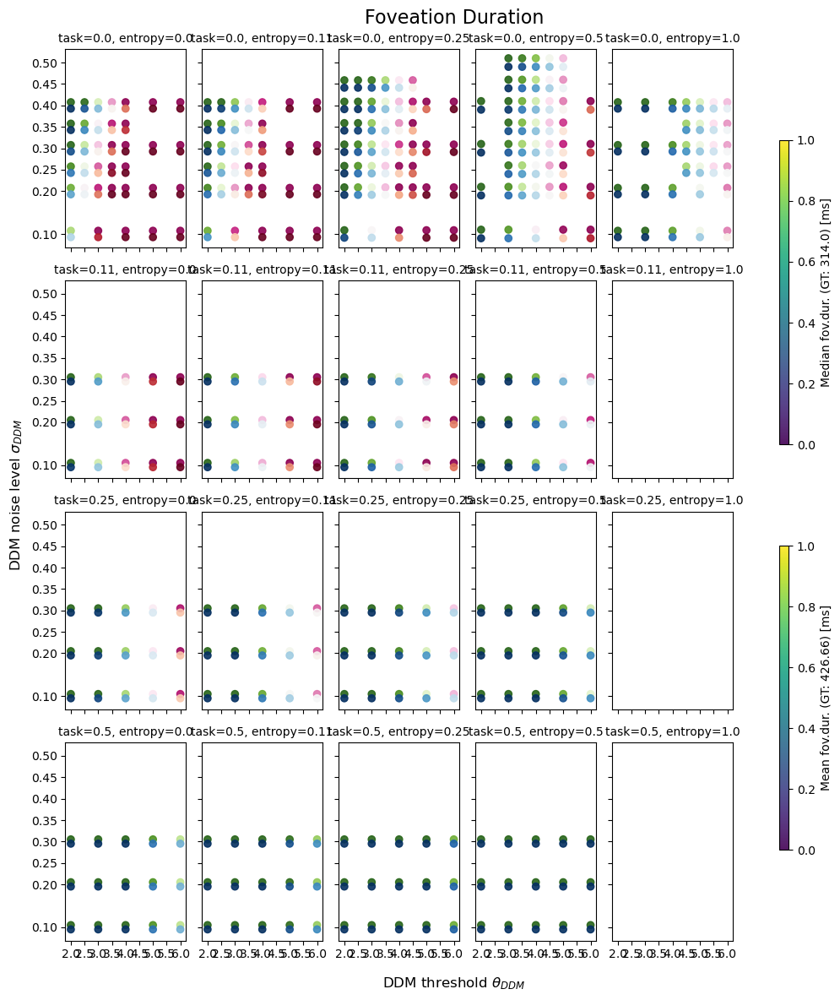

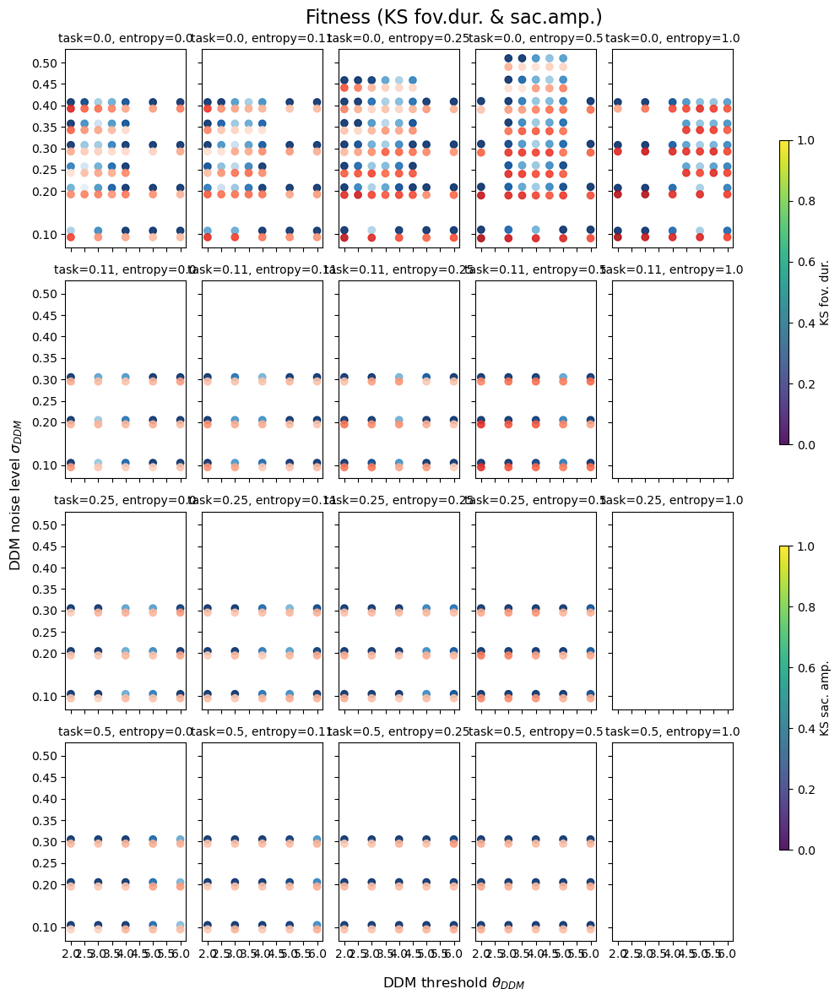

In [20]:
veu.plot_4d_grid(df_base, df_train_gt, "fov_dur")
veu.plot_4d_grid(df_base, df_train_gt, "fitness")

In [15]:
df_base[df_base["(task, entropy, dv, sig)"].apply(lambda x: x[1] == 1.0)].sort_values("fit_fd_sa", ascending=True).head(50)

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
179,"(0.0, 1.0, 5.0, 0.3)",349.272414,303.793869,2.593013,1.885677,0.028746,0.127178,0.196027,0.113428,0.838148,0.656313,0.314676,0.154727,0.208043,0.217714
178,"(0.0, 1.0, 5.0, 0.2)",356.231508,310.623709,2.655551,2.025355,0.031111,0.116444,0.204210,0.107492,0.871402,0.668805,0.349657,0.155851,0.220453,0.214299
177,"(0.0, 1.0, 5.0, 0.1)",353.106546,306.422223,2.534396,1.871210,0.030810,0.129401,0.211953,0.109599,0.843641,0.634769,0.364705,0.160776,0.228752,0.228927
180,"(0.0, 1.0, 5.0, 0.4)",335.211829,288.730079,2.598182,1.880071,0.035117,0.124582,0.201080,0.134156,0.849744,0.684135,0.282534,0.167618,0.205923,0.217034
184,"(0.0, 1.0, 6.0, 0.4)",408.982361,352.121641,2.790700,2.045911,0.036847,0.147390,0.168724,0.174649,0.859173,0.688216,0.249851,0.171686,0.197741,0.218385
183,"(0.0, 1.0, 6.0, 0.3)",424.007861,361.676856,2.688599,2.080126,0.040340,0.118896,0.180948,0.202604,0.850290,0.598515,0.282474,0.191776,0.222009,0.261679
182,"(0.0, 1.0, 6.0, 0.2)",431.699073,374.913187,2.627458,1.934092,0.027027,0.110270,0.187949,0.214004,0.865131,0.620454,0.340826,0.200977,0.247593,0.260500
181,"(0.0, 1.0, 6.0, 0.1)",438.968809,372.195845,2.648131,1.968043,0.029703,0.127613,0.186002,0.240205,0.909556,0.659119,0.315108,0.213103,0.247105,0.255696
174,"(0.0, 1.0, 4.0, 0.2)",275.698889,241.329282,2.544599,1.892028,0.039337,0.133885,0.200982,0.240685,0.830690,0.680464,0.406061,0.220833,0.282576,0.253734
176,"(0.0, 1.0, 4.0, 0.4)",261.116955,225.094638,2.724222,1.994132,0.035433,0.130577,0.175503,0.267647,0.722313,0.609156,0.385796,0.221575,0.276316,0.277998


In [8]:
df_base.sort_values("fit_fd_sa", ascending=True).head(5)


,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
7,"(0.0, 0.0, 2.5, 0.25)",377.424395,304.691744,3.517063,2.655375,0.028436,0.163033,0.072157,0.054369,0.721030,0.569866,0.257745,0.063263,0.128090,0.185553
6,"(0.0, 0.0, 2.5, 0.2)",417.149727,318.007336,3.013483,2.238537,0.023013,0.147490,0.128414,0.029043,0.752208,0.622510,0.299777,0.078728,0.152411,0.178316
50,"(0.0, 0.11, 3.0, 0.3)",384.567300,315.884025,3.263932,2.526836,0.029894,0.139826,0.092190,0.068693,0.702686,0.609800,0.251117,0.080442,0.137333,0.183694
15,"(0.0, 0.0, 3.0, 0.35)",378.844176,319.286785,4.213946,3.282698,0.030593,0.151052,0.096625,0.065630,0.641353,0.598909,0.244103,0.081128,0.135453,0.187782
51,"(0.0, 0.11, 3.0, 0.35)",340.977629,295.571955,3.598307,2.713822,0.034276,0.144816,0.050905,0.117346,0.667626,0.658601,0.169560,0.084125,0.112603,0.169883


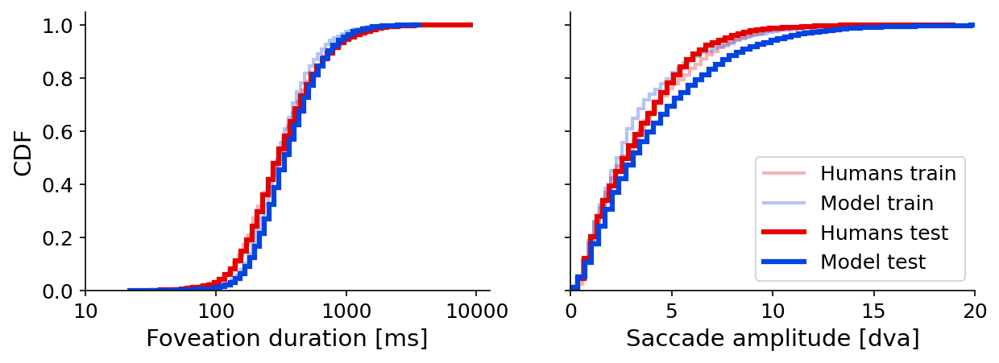

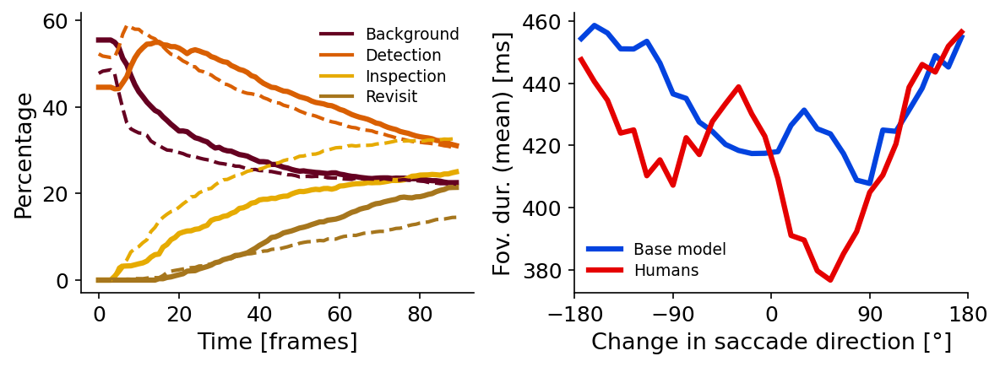

In [18]:
df_gt_all = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_all.csv", index_col=0)

identifier = 'task0.0_entropy0.11_dv3.0_sig0.3'  # 0.0, 0.11, 3.0, 0.3

all_dirs = list(glob.iglob("/scratch/vito/scanpathes/results/*"))
test_list = [x for x in all_dirs if x.endswith("_TEST_base_" + identifier)]
train_list = [x for x in all_dirs if x.endswith("final_base_4d_grid_5seeds_" + identifier)]
assert len(test_list) == len(train_list) == 1, "not unique parameter paths!"
training_run = train_list[0]
test_base_run = test_list[0]
df_train_res = pd.read_csv(f"{training_run}/df_res_fov.csv", index_col=0)
df_test_res = pd.read_csv(f"{test_base_run}/df_res_fov.csv", index_col=0)

veu.plot_cdf_fd_sa(df_test_res, df_train_res, df_gt_all)
plot_emerging_stats(df_test_res, df_gt_all, summary_measure="mean", ang_bins=30)

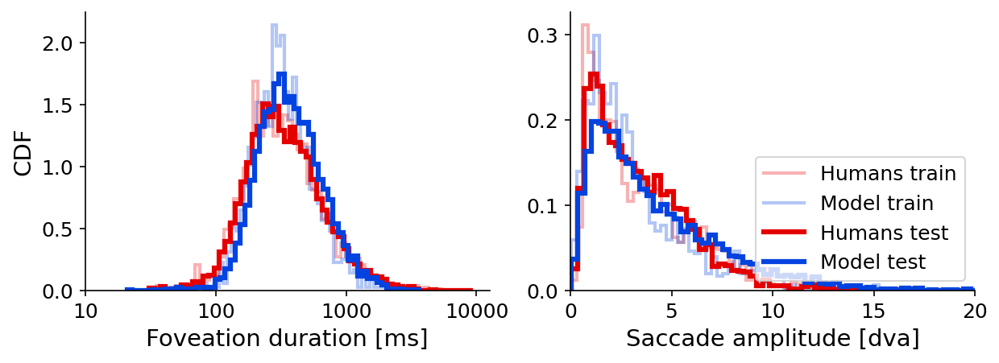

In [25]:
def plot_hist_fd_sa(df_test_res, df_train_res, df_gt, df_other=None, other_name=""):
    df_test_gt = df_gt[df_gt["video"].isin(df_test_res["video"].unique())]
    df_train_gt = df_gt[df_gt["video"].isin(df_train_res["video"].unique())]
    fig, axs = plt.subplots(1,2,dpi=150, figsize=(9.5,3), sharey=False) # fov_dur & sac_amp 
    for modus in ["train", "test"]:
        if modus == "train":
            gt_amp_dva = df_train_gt["sac_amp_dva"].dropna().values
            gt_dur_ms = df_train_gt["duration_ms"].dropna().values
            res_amp_dva = df_train_res["sac_amp_dva"].dropna().values
            res_dur_ms = df_train_res["duration_ms"].dropna().values
            kwargs = {"alpha":0.3, "lw":2} #"ls":"dotted", "lw":3,         
        else:
            gt_amp_dva = df_test_gt["sac_amp_dva"].dropna().values
            gt_dur_ms = df_test_gt["duration_ms"].dropna().values
            res_amp_dva = df_test_res["sac_amp_dva"].dropna().values
            res_dur_ms = df_test_res["duration_ms"].dropna().values
            kwargs = {"alpha":1, "lw":3}
        nbins = 60  # np.linspace(1, 4, 100)  # 60
        axs[0].hist(np.log10(gt_dur_ms), nbins, density=True, histtype='step', cumulative=False, label=f"Humans {modus}", color="xkcd:red", **kwargs)
        axs[0].hist(np.log10(res_dur_ms), nbins, density=True, histtype='step', cumulative=False, label=f"Model {modus}", color="xkcd:blue", **kwargs)
        
        axs[1].hist(gt_amp_dva, nbins, density=True, histtype='step', cumulative=False, label=f"Humans {modus}", color="xkcd:red", **kwargs)
        axs[1].hist(res_amp_dva, nbins, density=True, histtype='step', cumulative=False, label=f"Model {modus}", color="xkcd:blue", **kwargs)

    if df_other is not None:
        axs[0].hist(np.log10(df_other["duration_ms"].dropna().values), nbins, density=True, histtype='step', cumulative=False, label=other_name, color="xkcd:teal", alpha=1, lw=2)
        axs[1].hist(df_other["sac_amp_dva"].dropna().values, nbins, density=True, histtype='step', cumulative=False, label=other_name, color="xkcd:teal", alpha=1, lw=2)
        
    fix_hist_step_vertical_line_at_end(axs[0])
    fix_hist_step_vertical_line_at_end(axs[1])

    axs[0].set_xticks([1,2,3,4])
    axs[0].set_xlim([1, 4.1])
    axs[0].set_xticklabels([10,100,1000,10000], size=14)
    axs[0].tick_params(labelsize=12)
    axs[0].set_xlabel('Foveation duration [ms]', size=14)
    axs[0].set_ylabel('CDF', size=14)
    axs[1].set_xlabel('Saccade amplitude [dva]', size=14)
    axs[1].tick_params(labelsize=12)
    axs[1].set_xlim([0, 20])
    sns.despine()
    handles, labels = axs[1].get_legend_handles_labels()
    new_handles = [Line2D([], [], c=h.get_edgecolor(), lw=h.get_linewidth()) for h in handles]
    plt.legend(handles=new_handles, labels=labels, loc="lower right", fontsize=12)
    plt.show()
    
plot_hist_fd_sa(df_test_res, df_train_res, df_gt_all)


In [35]:
sns.color_palette("Blues")

[(0.8584083044982699, 0.9134486735870818, 0.9645674740484429),
 (0.7309496347558632, 0.8394771241830065, 0.9213225682429834),
 (0.5356862745098039, 0.746082276047674, 0.8642522106881968),
 (0.32628988850442137, 0.6186236063052672, 0.802798923490965),
 (0.16696655132641292, 0.48069204152249134, 0.7291503267973857),
 (0.044059976931949255, 0.3338869665513264, 0.6244521337946944)]

5, 5


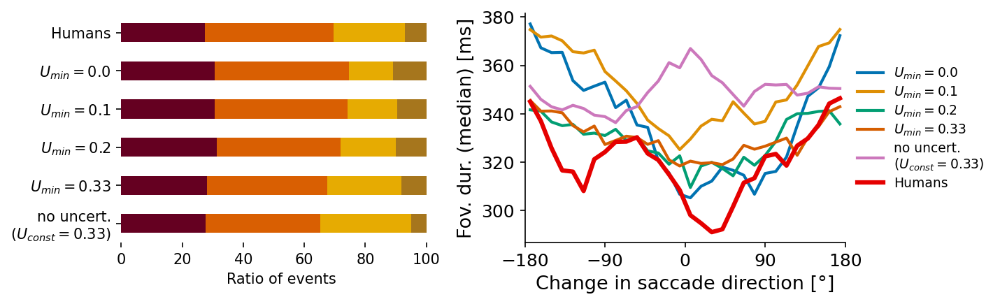

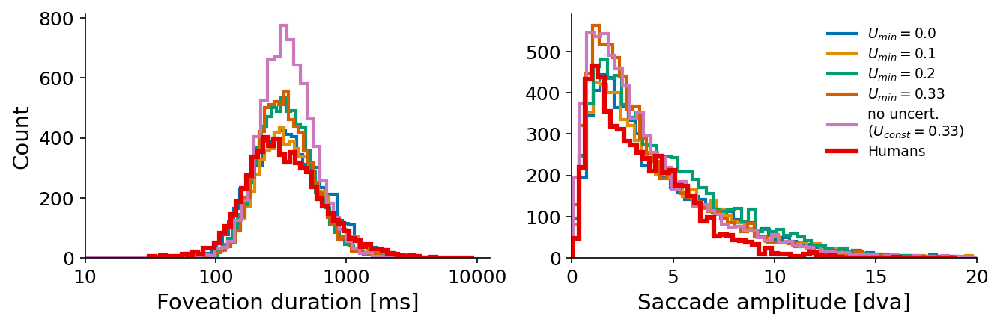

In [41]:
sets = ["2024-05-14-11-16-11_TEST_base_task0.0_entropy0.0_dv2.5_sig0.25",
        "2024-05-14-11-03-23_TEST_base_task0.0_entropy0.11_dv3.0_sig0.3", 
        "2024-05-22-14-22-57_TEST_base_task0.0_entropy0.25_dv3.5_sig0.4",
        "2024-05-24-18-45-25_TEST_base_task0.0_entropy0.5_dv4.0_sig0.4", 
        "2024-05-27-12-25-59_TEST_noUncert_task0.0_entropy0.5_dv3.0_sig0.3"
        ]
set_names = [r"$U_{min}=0.0$", r"$U_{min}=0.1$", r"$U_{min}=0.2$", r"$U_{min}=0.33$", "no uncert.\n"+r"$(U_{const}=0.33)$"]
print(f"{len(sets)}, {len(set_names)}")
colors = sns.color_palette("colorblind") # muted flare Set2 Blues
# colors[0] = "xkcd:blue"
dircl = ["xkcd:maroon", sns.color_palette("Dark2")[1], sns.color_palette("Dark2")[5], sns.color_palette("Dark2")[6]]

# for mean_or_median in ['mean', 'median']:
mean_or_median = 'median'
density_hist = False

summary_measure=mean_or_median; ang_bins=30; sma_ws=5; obj_maxframes=90
mean_fovcats_test = []

fig, axs = plt.subplots(1, 2, dpi=150, figsize=(9, 3), sharey=False)
fig2, bxs = plt.subplots(1, 2, dpi=150, figsize=(9, 3), sharey=False)

nbins_fd_sa = 60
for s_idx, s in enumerate(sets):
    df_eval = pd.read_csv(f"/scratch/vito/scanpathes/results/{s}/df_res_fov.csv", index_col=0)
    x_vals, all = fovdur_vs_sacang(df_eval, ang_bins, sma_ws, summary_measure)
    axs[1].plot(x_vals, all, color=colors[s_idx], label=set_names[s_idx], lw=2)
    res_amp_dva = df_eval["sac_amp_dva"].dropna().values
    res_dur_ms = df_eval["duration_ms"].dropna().values
    bxs[0].hist(np.log10(res_dur_ms), nbins_fd_sa, density=density_hist, histtype='step', cumulative=False, label=set_names[s_idx], color=colors[s_idx], lw=2)
    bxs[1].hist(res_amp_dva, nbins_fd_sa, density=density_hist, histtype='step', cumulative=False, label=set_names[s_idx], color=colors[s_idx], lw=2)

    bdir_ratios = np.mean(get_BDIR_per_frames(df_eval, 90), axis=1)
    mean_fovcats_test.append(bdir_ratios)
    assert round(np.sum(bdir_ratios))==100

df_gt = df_gt_all[df_gt_all["video"].isin(df_eval["video"].unique())]
x_vals, all = fovdur_vs_sacang(df_gt, ang_bins, sma_ws, summary_measure)
axs[1].plot(x_vals, all, color="xkcd:red", label="Humans", lw=3)
gt_bdir_ratios = np.mean(get_BDIR_per_frames(df_gt, 90), axis=1)
bxs[0].hist(np.log10(df_gt["duration_ms"].dropna().values), nbins_fd_sa, density=density_hist, histtype='step', cumulative=False, label="Humans", color="xkcd:red", lw=3)
bxs[1].hist(df_gt["sac_amp_dva"].dropna().values, nbins_fd_sa, density=density_hist, histtype='step', cumulative=False, label="Humans", color="xkcd:red", lw=3)

mean_fovcats_test_r = mean_fovcats_test[::-1]
df_fovcats_test = pd.DataFrame(index=set_names[::-1] + ['Humans'], data= mean_fovcats_test_r + [gt_bdir_ratios])
df_fovcats_test.plot.barh(stacked=True, ax=axs[0],rot=0, legend=False, color=dircl)#.legend(bbox_to_anchor=(0.3, 1.5))
axs[0].set_frame_on(False); axs[0].set(xlabel = 'Ratio of events')#, title = 'Testset')

axs[1].set_xlabel('Change in saccade direction [°]', size=13)
axs[1].set_xlim(-180, 180)
# axs[0].set_yticks([200, 300, 400, 500, 600])
axs[1].set_xticks([-180, -90, 0, 90, 180])
axs[1].set_ylabel(f'Fov. dur. ({summary_measure}) [ms]', size=13)
axs[1].tick_params(labelsize=12)
# axs[1].legend(labelspacing=0.3, prop={'size':9}, frameon=False)

box = axs[1].get_position()
axs[1].set_position([box.x0, box.y0, box.width * 0.8, box.height])
axs[1].legend(loc='center left', bbox_to_anchor=(1, 0.5), labelspacing=0.3, prop={'size':9}, frameon=False)

bxs[0].set_xticks([1,2,3,4])
bxs[0].set_xlim([1, 4.1])
bxs[0].set_xticklabels([10,100,1000,10000], size=14)
bxs[0].tick_params(labelsize=12)
bxs[0].set_xlabel('Foveation duration [ms]', size=14)
bxs[0].set_ylabel('Count', size=14)
bxs[1].set_xlabel('Saccade amplitude [dva]', size=14)
bxs[1].tick_params(labelsize=12)
bxs[1].set_xlim([0, 20])
handles, labels = bxs[1].get_legend_handles_labels()
new_handles = [Line2D([], [], c=h.get_edgecolor(), lw=h.get_linewidth()) for h in handles]
bxs[1].legend(handles=new_handles, labels=labels, labelspacing=0.3, prop={'size':9}, frameon=False)

fig.tight_layout(); fig2.tight_layout()
sns.despine(fig); sns.despine(fig2)
plt.show()


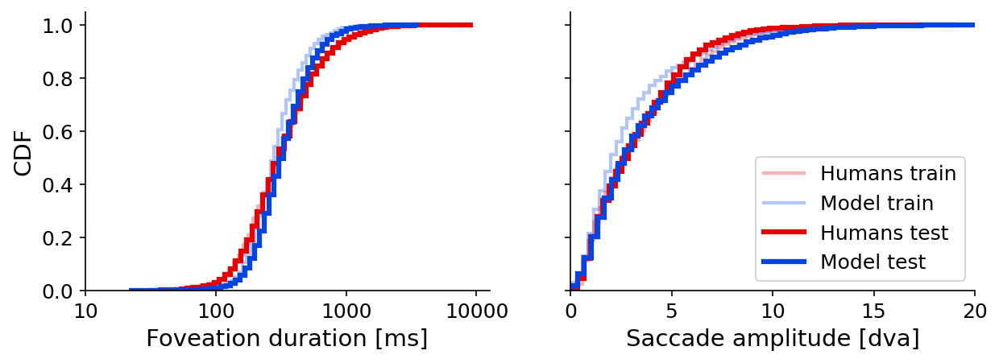

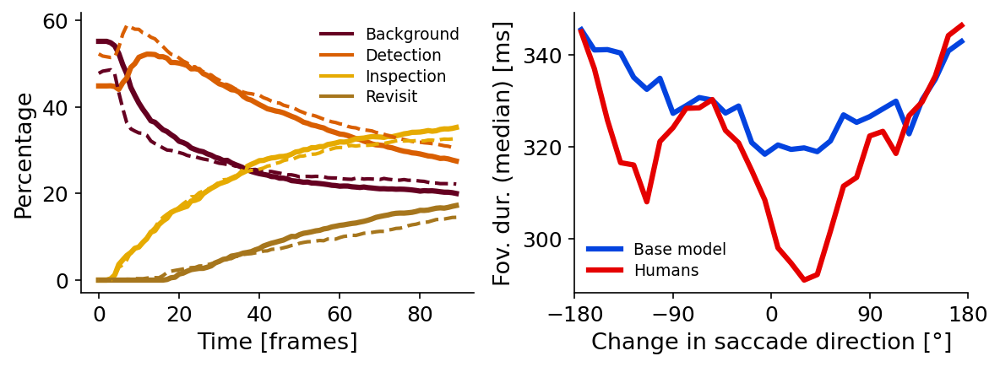

In [45]:
df_gt_all = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_all.csv", index_col=0)

identifier = 'task0.0_entropy0.5_dv4.0_sig0.4'  # 0.0, 0.11, 3.0, 0.3
# "2024-05-27-22-56-46_TEST_base_task0.0_entropy0.5_dv4.5_sig0.5"

all_dirs = list(glob.iglob("/scratch/vito/scanpathes/results/*"))
test_list = [x for x in all_dirs if x.endswith("_TEST_base_" + identifier)]
train_list = [x for x in all_dirs if x.endswith("final_base_4d_grid_5seeds_" + identifier)]
assert len(test_list) == len(train_list) == 1, "not unique parameter paths!"
training_run = train_list[0]
test_base_run = test_list[0]
df_train_res = pd.read_csv(f"{training_run}/df_res_fov.csv", index_col=0)
df_test_res = pd.read_csv(f"{test_base_run}/df_res_fov.csv", index_col=0)

# df_test_gt = df_gt_all[df_gt_all["video"].isin(df_test_res["video"].unique())]
# plot_fov_dur_sac_amp_hists(df_test_res, df_test_gt, min_amp=0, max_amp=20)
veu.plot_cdf_fd_sa(df_test_res, df_train_res, df_gt_all)
plot_emerging_stats(df_test_res, df_gt_all, summary_measure="median", ang_bins=30)

5, 5
(2.543838784232028, 0.2135448061497784) (2.0126337803143732, 0, 1.6894791809273162)


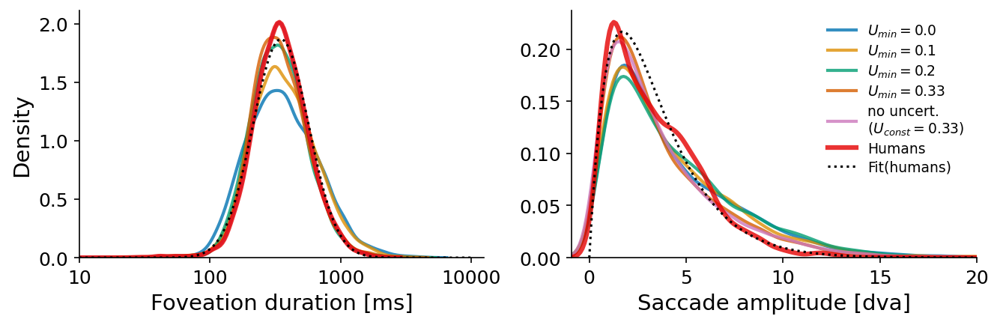

In [46]:
sets = ["2024-05-14-11-16-11_TEST_base_task0.0_entropy0.0_dv2.5_sig0.25",
        "2024-05-14-11-03-23_TEST_base_task0.0_entropy0.11_dv3.0_sig0.3", 
        "2024-05-22-14-22-57_TEST_base_task0.0_entropy0.25_dv3.5_sig0.4",
        "2024-05-24-18-45-25_TEST_base_task0.0_entropy0.5_dv4.0_sig0.4", 
        "2024-05-27-12-25-59_TEST_noUncert_task0.0_entropy0.5_dv3.0_sig0.3"
        ]
set_names = [r"$U_{min}=0.0$", r"$U_{min}=0.1$", r"$U_{min}=0.2$", r"$U_{min}=0.33$", "no uncert.\n"+r"$(U_{const}=0.33)$"]
print(f"{len(sets)}, {len(set_names)}")
colors = sns.color_palette("colorblind") # muted flare Set2 Blues

fig, axs = plt.subplots(1, 2, dpi=150, figsize=(9, 3), sharey=False)

for s_idx, s in enumerate(sets):
    df_eval = pd.read_csv(f"/scratch/vito/scanpathes/results/{s}/df_res_fov.csv", index_col=0)
    sns.kdeplot(np.log10(df_eval["duration_ms"].dropna().values), label=set_names[s_idx], color=colors[s_idx], lw=2, alpha=0.8, ax=axs[0])
    sns.kdeplot(df_eval["sac_amp_dva"].dropna().values, label=set_names[s_idx], color=colors[s_idx], lw=2, alpha=0.8, ax=axs[1])

df_gt = df_gt_all[df_gt_all["video"].isin(df_eval["video"].unique())]
gt_amp_dva = df_gt["sac_amp_dva"].dropna().values
gt_dur_ms = df_eval["duration_ms"].dropna().values
sns.kdeplot(np.log10(gt_dur_ms), label="Humans", color="xkcd:red", lw=3, alpha=0.8, ax=axs[0])
sns.kdeplot(gt_amp_dva, label="Humans", color="xkcd:red", lw=3, alpha=0.8, ax=axs[1])

ampX = np.linspace(0, 20, 200)
ampfit = stats.gamma.fit(gt_amp_dva, floc=0)
ampPDF = stats.gamma.pdf(ampX, *ampfit)

durX = np.linspace(1,4, 200)
durfit = stats.norm.fit(np.log10(gt_dur_ms))
durPDF = stats.norm.pdf(durX, *durfit)
print(durfit, ampfit)

axs[0].plot(durX, durPDF, color='k', ls=':')
axs[1].plot(ampX, ampPDF, color='k', ls=':', label='Fit(humans)')
# c_count, b_count = np.histogram(np.log10(gt_dur_ms), density=False, bins=40)
# c_dense, b_dense = np.histogram(np.log10(gt_dur_ms), density=True, bins=40)
# FD_fac = c_count.max()/c_dense.max()
# c_count, b_count = np.histogram(gt_amp_dva, density=False,bins=60)
# c_dense, b_dense = np.histogram(gt_amp_dva, density=True,bins=60)
# SA_fac = c_count.max()/c_dense.max()

axs[0].set_xticks([1,2,3,4])
axs[0].set_xlim([1, 4.1])
axs[0].set_xticklabels([10,100,1000,10000], size=14)
axs[0].tick_params(labelsize=12)
axs[0].set_xlabel('Foveation duration [ms]', size=14)
axs[0].set_ylabel('Density', size=14)
axs[1].set_ylabel("", size=14)
axs[1].set_xlabel('Saccade amplitude [dva]', size=14)
axs[1].tick_params(labelsize=12)
axs[1].set_xlim([-0.9, 20])
axs[1].legend(labelspacing=0.3, prop={'size':9}, frameon=False)

fig.tight_layout(); fig2.tight_layout()
sns.despine(fig); sns.despine(fig2)
plt.show()




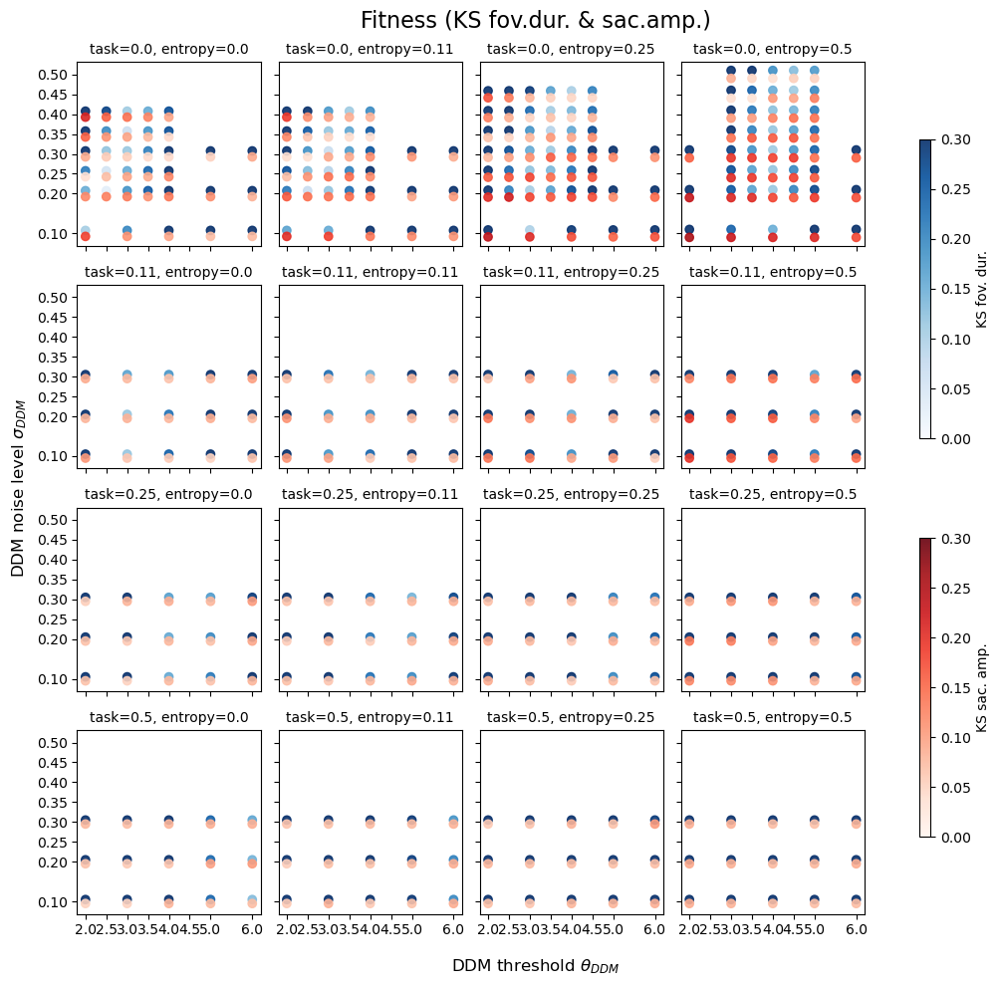

In [8]:
veu.plot_4d_grid(df_base, df_train_gt, "fitness")
# task0.0_entropy0.0_dv2.5_sig0.25
# task0.0_entropy0.11_dv3.0_sig0.3
# task0.0_entropy0.25_dv3.5_sig0.4
# task0.0_entropy0.5_dv4.0_sig0.4

In [32]:
# plot_object_eval with log axis

# Old, with SP-flip-bug

## New grid, no cb

In [3]:
fine_runs = veu.check_grid_result_completeness("2024-04-1", exclude_in_name=["_cb_", "entropy1.0", "task1.0"]) # 2024-02-19-16-
len(fine_runs)

WARNING! Only 330/50 result files in /scratch/vito/scanpathes/results/2024-04-17-13-16-14_TEST_noPrompt_task0.0_entropy0.11_dv3.0_sig0.3
WARNING! Only 330/50 result files in /scratch/vito/scanpathes/results/2024-04-17-13-16-13_TEST_llObj_task0.0_entropy0.11_dv3.0_sig0.3
WARNING! Only 330/50 result files in /scratch/vito/scanpathes/results/2024-04-17-13-16-11_TEST_hlObj_task0.0_entropy0.11_dv3.0_sig0.3
WARNING! Only 330/50 result files in /scratch/vito/scanpathes/results/2024-04-17-08-57-55_TEST_preSac0.3_task0.0_entropy0.11_dv3.0_sig0.3
WARNING! Only 325/50 result files in /scratch/vito/scanpathes/results/2024-04-17-08-57-54_TEST_preSac0.5-0.8_task0.0_entropy0.11_dv3.0_sig0.3
WARNING! Only 330/50 result files in /scratch/vito/scanpathes/results/2024-04-16-15-06-11_TEST_preSac0.3_task0.0_entropy0.25_dv3.5_sig0.3
WARNING! Only 329/50 result files in /scratch/vito/scanpathes/results/2024-04-16-15-06-10_TEST_preSac0.5-0.8_task0.0_entropy0.25_dv3.5_sig0.3


63

In [3]:
base_runs = veu.check_grid_result_completeness("_base_4d_grid_5seeds_", exclude_in_name=["_cb_", "entropy1.0", "task1.0"]) # 2024-02-19-16-
print(len(base_runs), base_runs[0])

df_train_gt = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_train.csv", index_col=0)
df_base = veu.eval_runs_to_dataframe_4d_grid_all(base_runs, df_train_gt)
df_base.sort_values("fit_fd_sa", ascending=True).head(10)

# BASE MODEL training results from the grid (5seeds, 10 training vids)

255 /scratch/vito/scanpathes/results/2024-04-12-15-43-06_base_4d_grid_5seeds_task0.0_entropy0.25_dv4.0_sig0.4


,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
46,"(0.0, 0.11, 3.0, 0.3)",375.463712,316.939802,3.456000,2.668982,0.034873,0.155514,0.048286,0.076158,0.653827,0.622387,0.201666,0.062222,0.108704,0.167352
5,"(0.0, 0.0, 2.5, 0.2)",414.474316,311.801885,3.068954,2.394765,0.031185,0.143451,0.115330,0.024638,0.731929,0.622509,0.258397,0.069984,0.132788,0.172487
6,"(0.0, 0.0, 2.5, 0.25)",386.061379,306.373918,3.254605,2.349902,0.019361,0.126815,0.087147,0.058088,0.736546,0.622129,0.213106,0.072618,0.119447,0.174369
13,"(0.0, 0.0, 3.0, 0.3)",426.196261,340.474171,3.550121,2.635775,0.025751,0.151288,0.045647,0.106093,0.632046,0.564434,0.276422,0.075870,0.142721,0.195769
53,"(0.0, 0.11, 3.5, 0.4)",381.522055,326.111166,3.737331,2.878705,0.039347,0.110365,0.057432,0.101745,0.598393,0.526326,0.138229,0.079588,0.099135,0.210950
14,"(0.0, 0.0, 3.0, 0.35)",387.594887,320.195306,4.248159,3.364676,0.035225,0.127202,0.090003,0.075151,0.588428,0.594510,0.225185,0.082577,0.130113,0.190215
86,"(0.0, 0.25, 3.5, 0.4)",336.535365,293.011794,3.514301,2.610867,0.032122,0.151310,0.046226,0.126689,0.610148,0.568455,0.153218,0.086458,0.108711,0.201487
47,"(0.0, 0.11, 3.0, 0.35)",342.554722,292.197951,3.905872,2.996629,0.026747,0.138050,0.067328,0.111567,0.630084,0.607191,0.168185,0.089448,0.115693,0.190568
7,"(0.0, 0.0, 2.5, 0.3)",332.675785,280.221495,3.792684,2.927655,0.026801,0.151591,0.056737,0.125503,0.636919,0.603019,0.216617,0.091120,0.132952,0.193074
85,"(0.0, 0.25, 3.5, 0.35)",369.584258,318.241505,3.190399,2.405969,0.036111,0.120370,0.094329,0.096607,0.733036,0.687831,0.157227,0.095468,0.116054,0.167702


In [4]:
df_base.sort_values("fit_fd_sa_fc", ascending=True).head(10)


,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
53,"(0.0, 0.11, 3.5, 0.4)",381.522055,326.111166,3.737331,2.878705,0.039347,0.110365,0.057432,0.101745,0.598393,0.526326,0.138229,0.079588,0.099135,0.210950
46,"(0.0, 0.11, 3.0, 0.3)",375.463712,316.939802,3.456000,2.668982,0.034873,0.155514,0.048286,0.076158,0.653827,0.622387,0.201666,0.062222,0.108704,0.167352
86,"(0.0, 0.25, 3.5, 0.4)",336.535365,293.011794,3.514301,2.610867,0.032122,0.151310,0.046226,0.126689,0.610148,0.568455,0.153218,0.086458,0.108711,0.201487
47,"(0.0, 0.11, 3.0, 0.35)",342.554722,292.197951,3.905872,2.996629,0.026747,0.138050,0.067328,0.111567,0.630084,0.607191,0.168185,0.089448,0.115693,0.190568
85,"(0.0, 0.25, 3.5, 0.35)",369.584258,318.241505,3.190399,2.405969,0.036111,0.120370,0.094329,0.096607,0.733036,0.687831,0.157227,0.095468,0.116054,0.167702
6,"(0.0, 0.0, 2.5, 0.25)",386.061379,306.373918,3.254605,2.349902,0.019361,0.126815,0.087147,0.058088,0.736546,0.622129,0.213106,0.072618,0.119447,0.174369
216,"(0.5, 0.0, 6.0, 0.1)",331.591800,279.435403,3.559702,2.928844,0.026667,0.120000,0.082466,0.137185,0.584365,0.538791,0.149118,0.109825,0.122923,0.226953
128,"(0.11, 0.11, 4.0, 0.3)",384.879933,339.812382,3.427073,2.748037,0.024155,0.153623,0.045405,0.158782,0.622854,0.585421,0.167592,0.102094,0.123927,0.206255
92,"(0.0, 0.25, 4.0, 0.4)",407.890715,355.451877,3.532363,2.556524,0.032821,0.155897,0.054188,0.152823,0.675928,0.627036,0.180507,0.103505,0.129173,0.193325
14,"(0.0, 0.0, 3.0, 0.35)",387.594887,320.195306,4.248159,3.364676,0.035225,0.127202,0.090003,0.075151,0.588428,0.594510,0.225185,0.082577,0.130113,0.190215


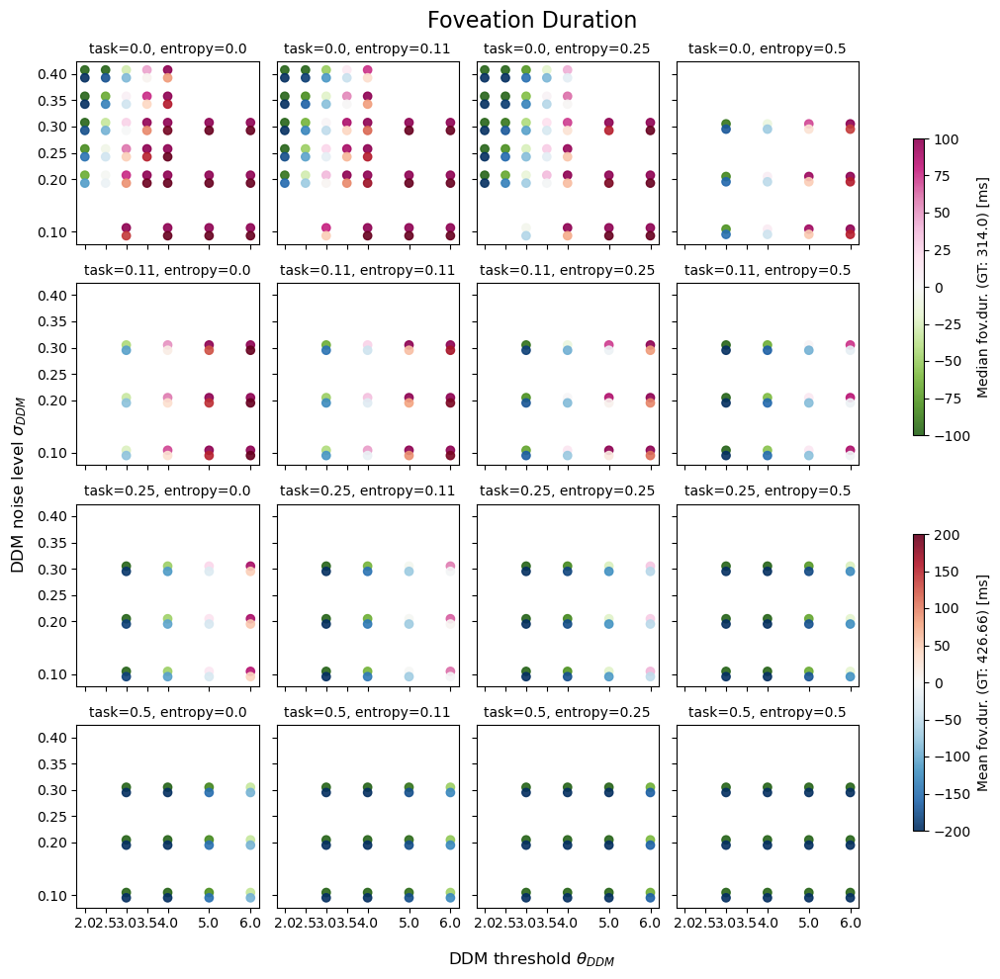

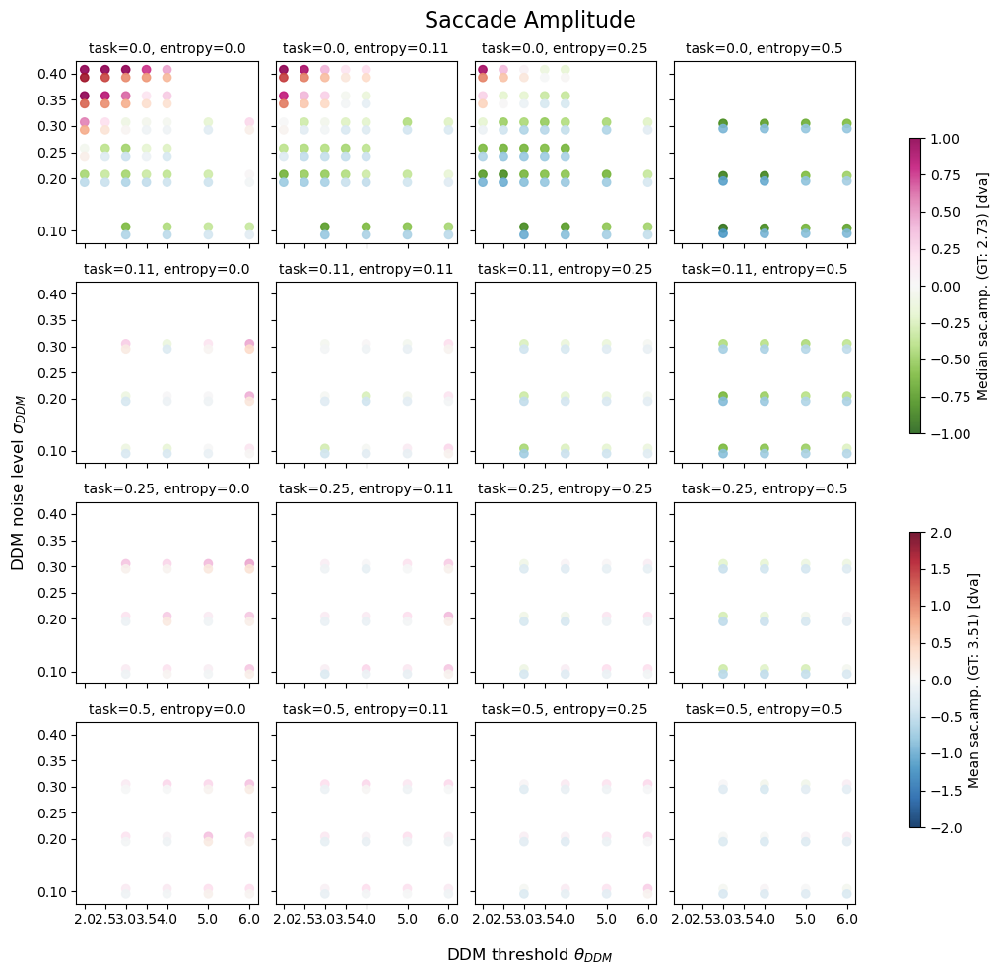

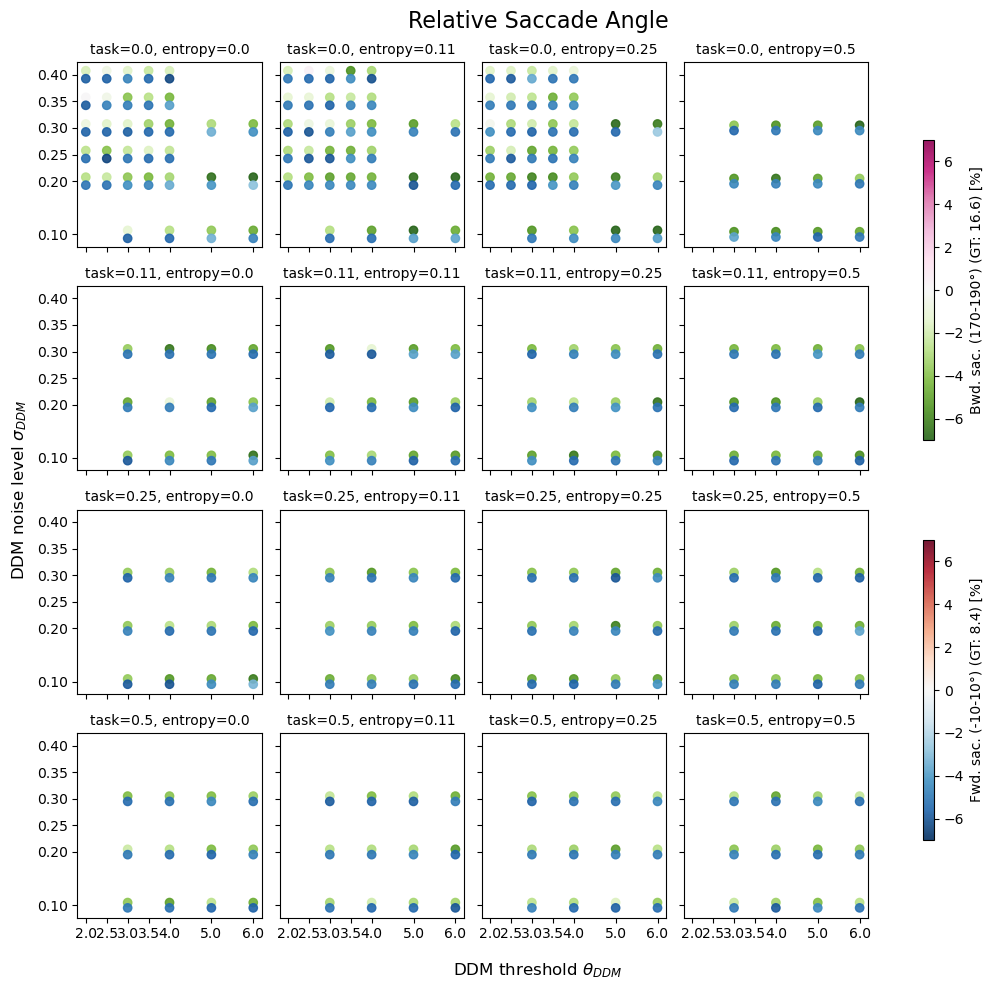

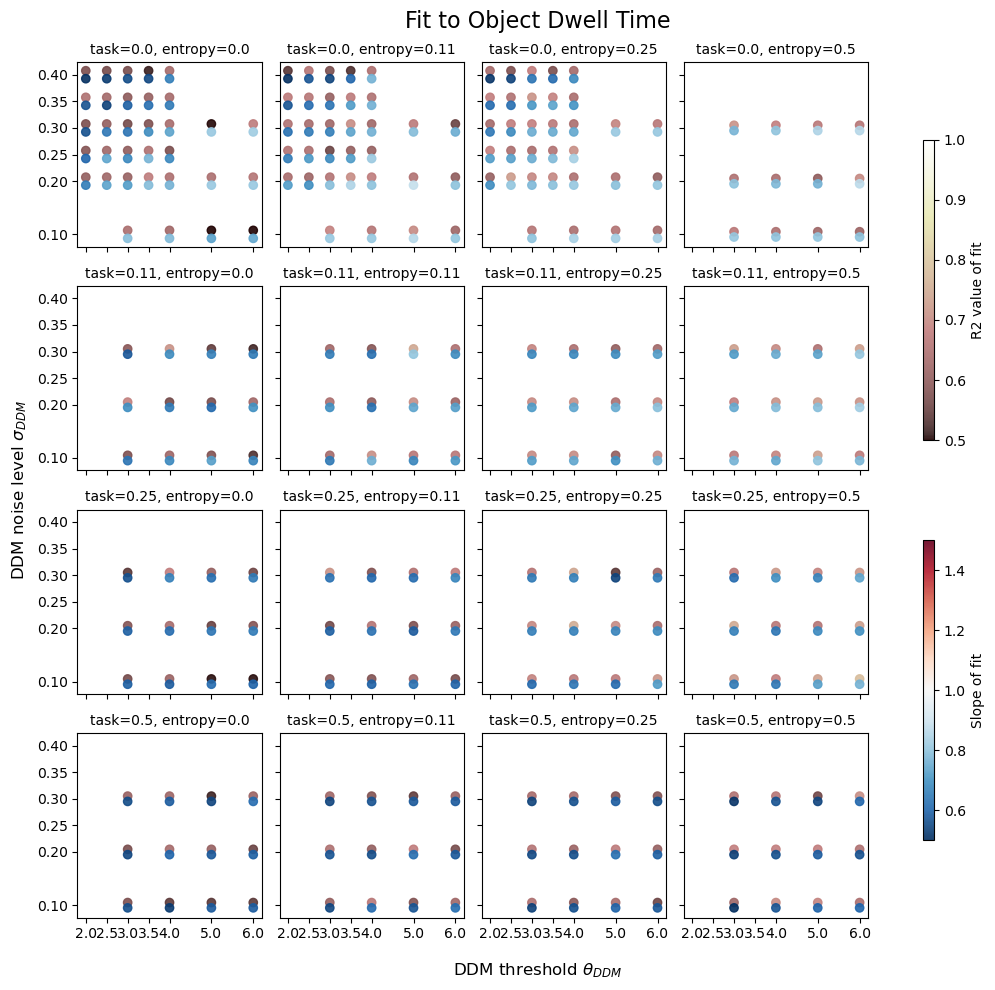

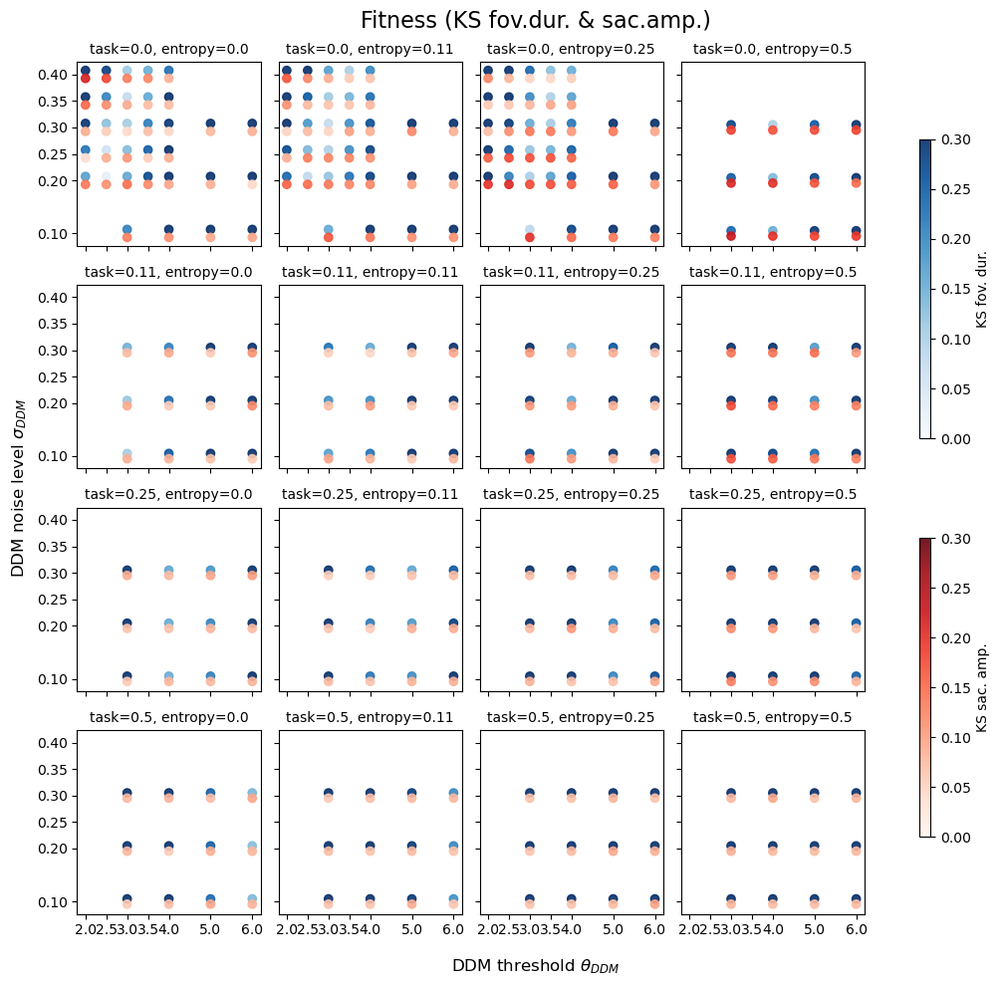

In [5]:
veu.plot_all_4d_grid(df_base, df_train_gt)

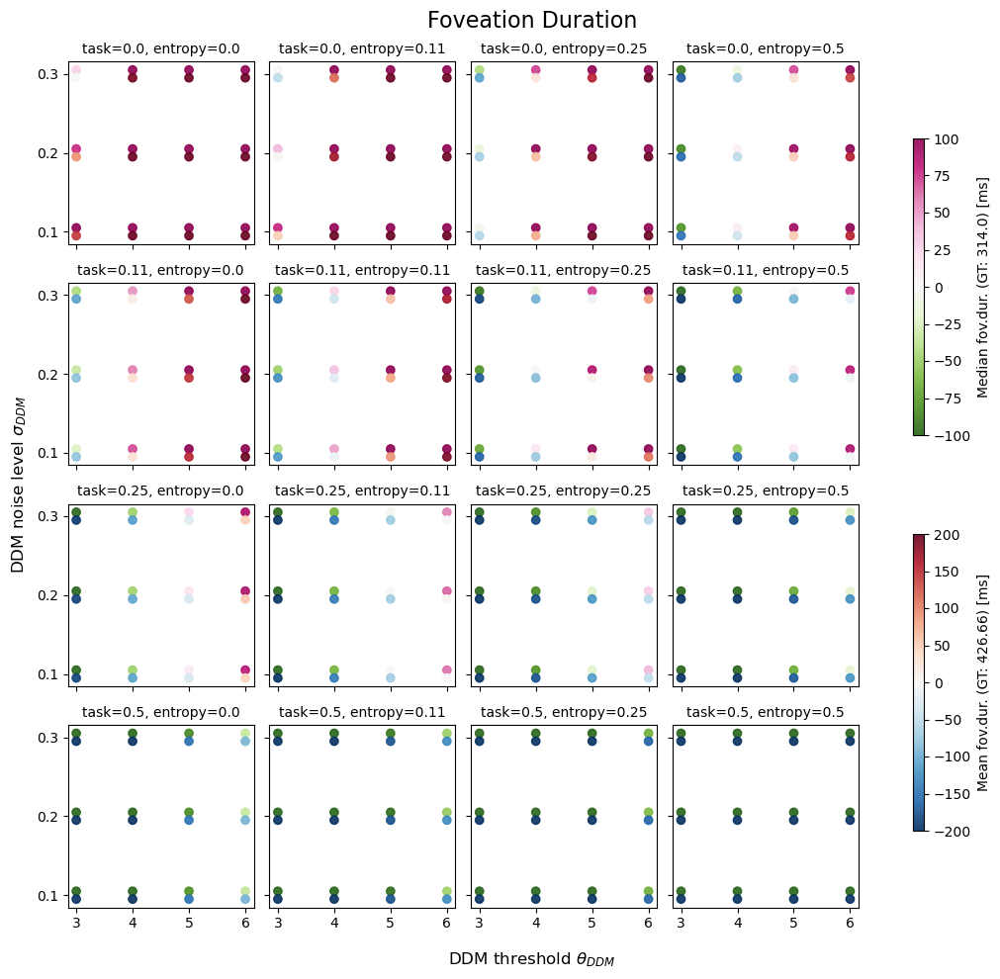

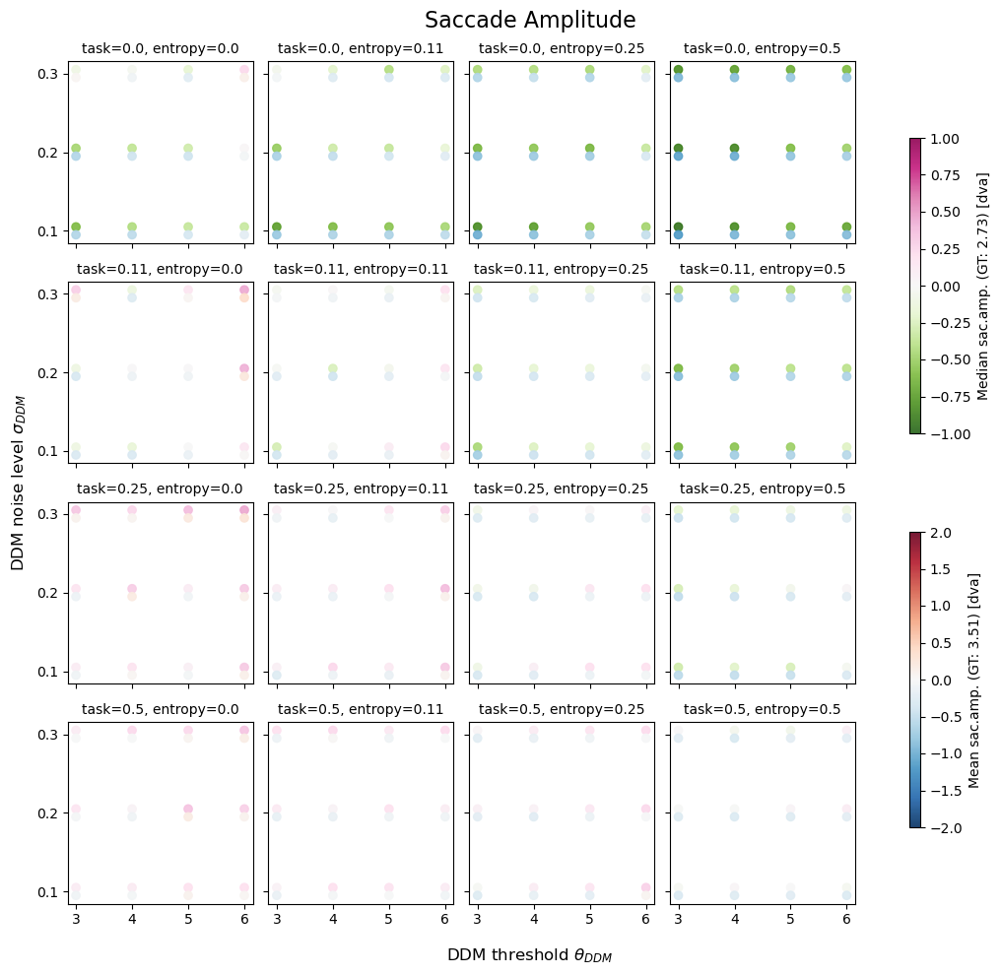

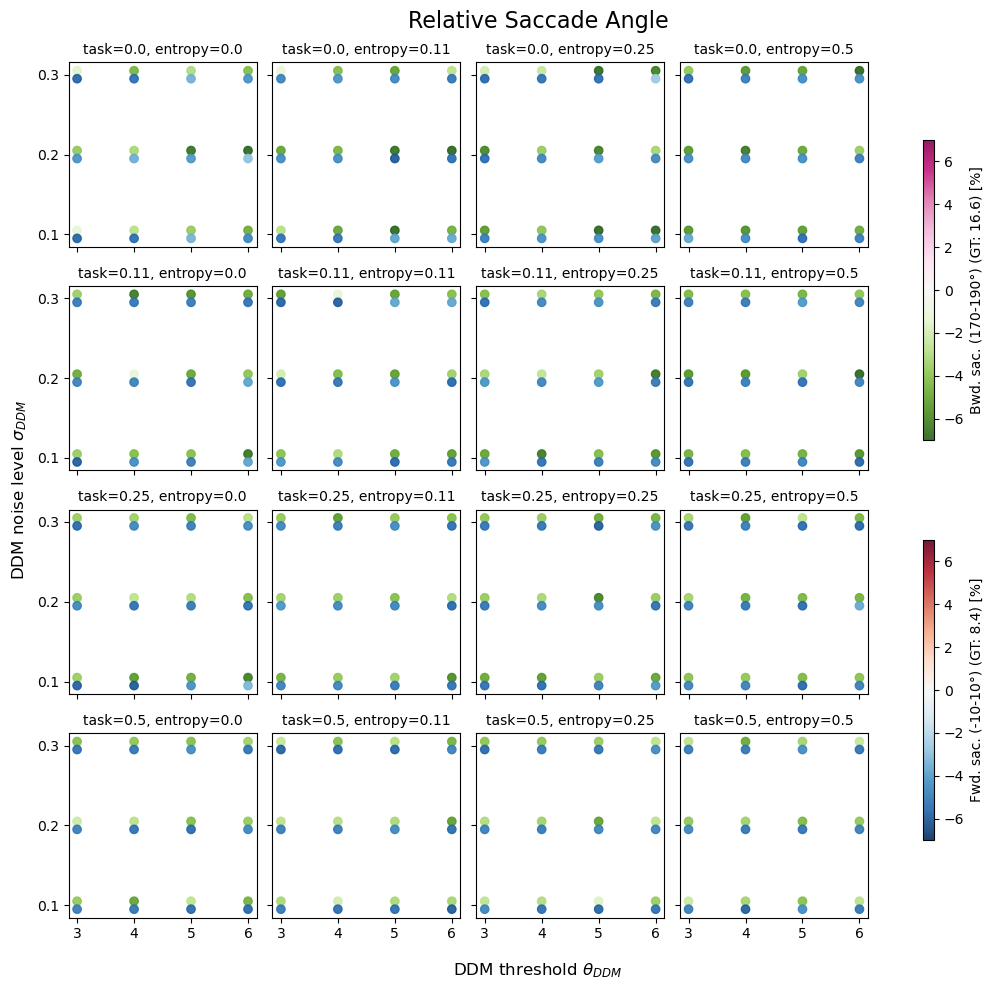

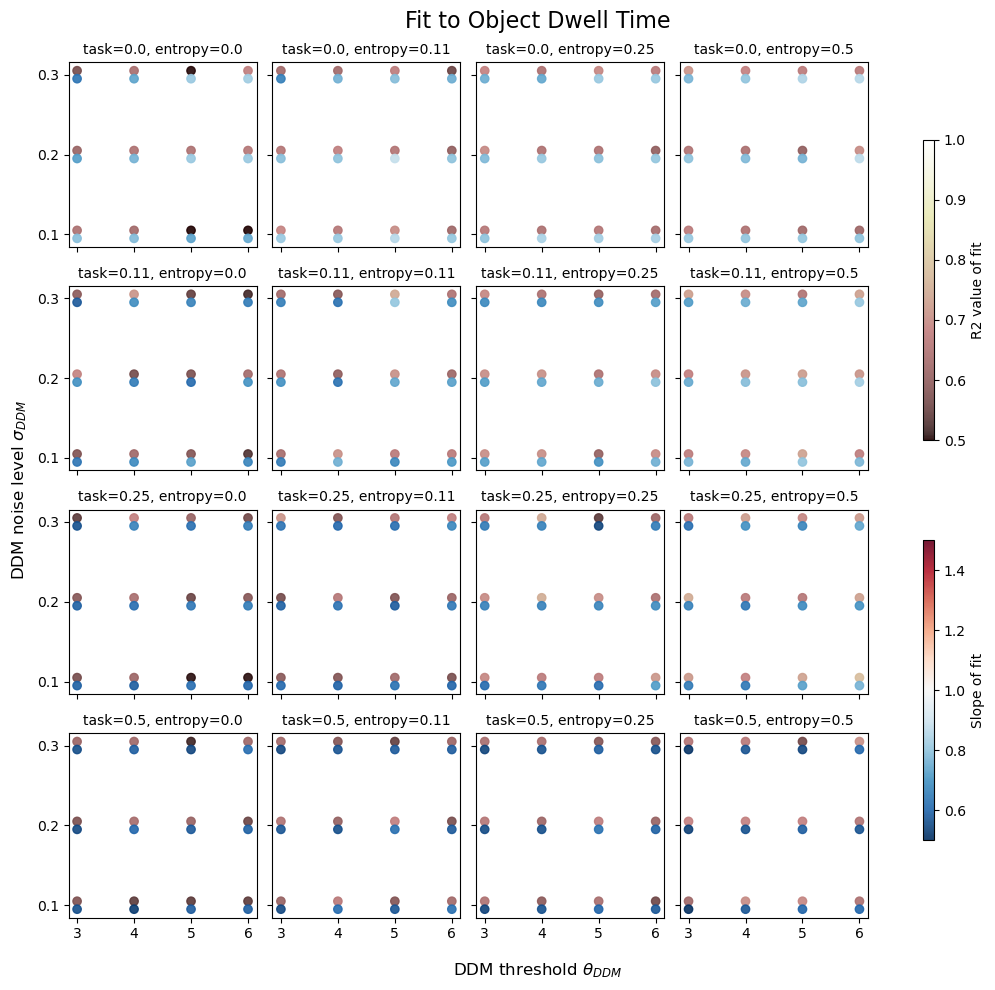

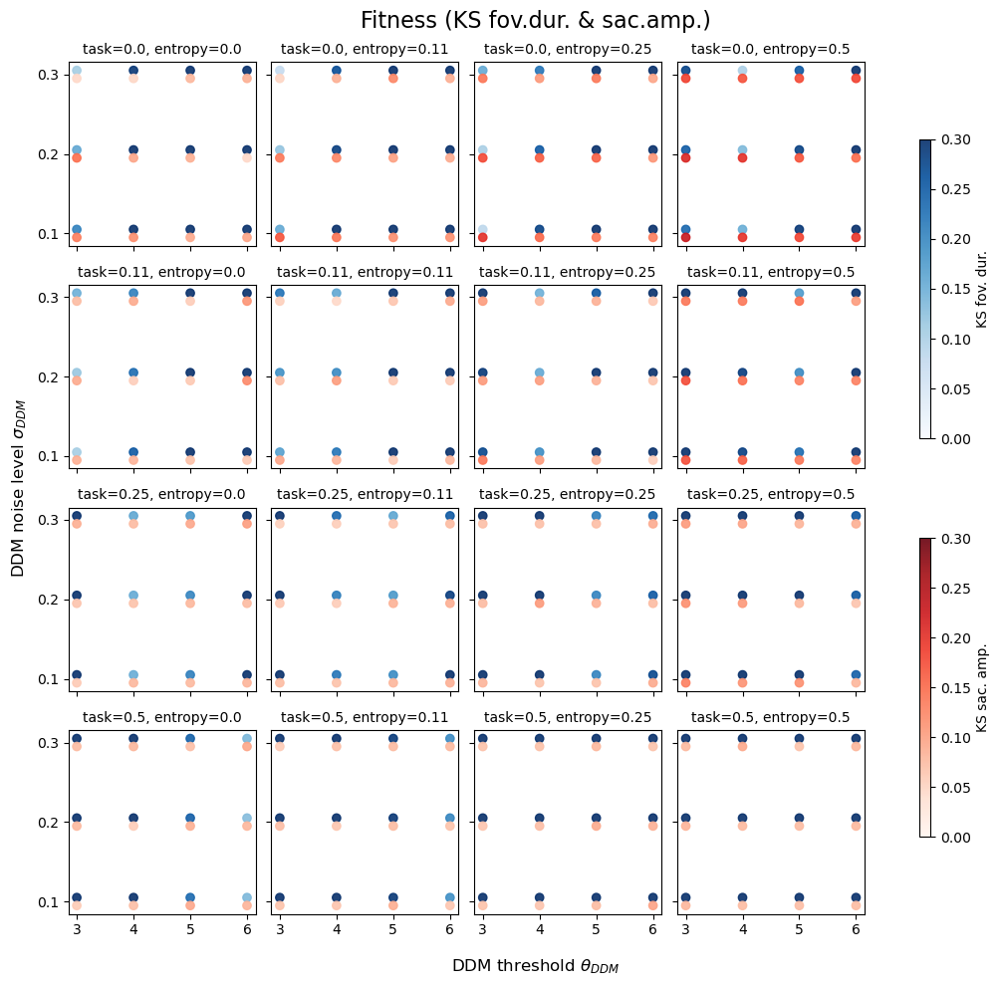

In [4]:
veu.plot_all_4d_grid(df_base, df_train_gt)

In [4]:
all_runs = os.listdir("/scratch/vito/scanpathes/results/")
key = "base_4d_grid_5seeds_task0.25_entropy0.5_dv3.0_sig0.2"
len([dir for dir in all_runs if dir.endswith(key)])

1

In [12]:
df_base.sort_values("fit_fd_sa", ascending=True).head(5) # 0.001, 0.25, 2.5, 0.3

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
46,"(0.0, 0.11, 3.0, 0.3)",375.463712,316.939802,3.456000,2.668982,0.034873,0.155514,0.048286,0.076158,0.653827,0.622387,0.201666,0.062222,0.108704,0.167352
5,"(0.0, 0.0, 2.5, 0.2)",414.474316,311.801885,3.068954,2.394765,0.031185,0.143451,0.115330,0.024638,0.731929,0.622509,0.258397,0.069984,0.132788,0.172487
6,"(0.0, 0.0, 2.5, 0.25)",386.061379,306.373918,3.254605,2.349902,0.019361,0.126815,0.087147,0.058088,0.736546,0.622129,0.213106,0.072618,0.119447,0.174369
13,"(0.0, 0.0, 3.0, 0.3)",426.196261,340.474171,3.550121,2.635775,0.025751,0.151288,0.045647,0.106093,0.632046,0.564434,0.276422,0.075870,0.142721,0.195769
53,"(0.0, 0.11, 3.5, 0.4)",381.522055,326.111166,3.737331,2.878705,0.039347,0.110365,0.057432,0.101745,0.598393,0.526326,0.138229,0.079588,0.099135,0.210950


In [4]:
df_gt_all = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_all.csv", index_col=0)

top_params = df_base.sort_values("fit_fd_sa", ascending=True).iloc[0]["(task, entropy, dv, sig)"]
identifier = f"task{top_params[0]}_entropy{top_params[1]}_dv{top_params[2]}_sig{top_params[3]}"
print(identifier)

all_dirs = list(glob.iglob("/scratch/vito/scanpathes/results/*"))
test_list = [x for x in all_dirs if x.endswith("_TEST_base_" + identifier)]
train_list = [x for x in all_dirs if x.endswith("_base_4d_grid_5seeds_" + identifier)]
assert len(test_list) == len(train_list) == 1, "not unique parameter paths!"
training_run = train_list[0]
test_base_run = test_list[0]
df_train_res = pd.read_csv(f"{training_run}/df_res_fov.csv", index_col=0)
print("train mean", np.mean(df_train_res["sac_amp_dva"].dropna().values), " median", np.median(df_train_res["sac_amp_dva"].dropna().values))
df_test_res = pd.read_csv(f"{test_base_run}/df_res_fov.csv", index_col=0)
print("test mean", np.mean(df_test_res["sac_amp_dva"].dropna().values), " median", np.median(df_test_res["sac_amp_dva"].dropna().values))

veu.plot_cdf_fd_sa(df_test_res, df_train_res, df_gt_all)
plot_object_comparison(df_test_res, df_gt_all, title=identifier)


NameError: name 'df_base' is not defined

In [53]:
identifier

'task0.0_entropy0.11_dv3.0_sig0.3'

train mean 3.456000114491919  median 2.6689819594568616
test mean 4.171187657565031  median 3.27208343012836


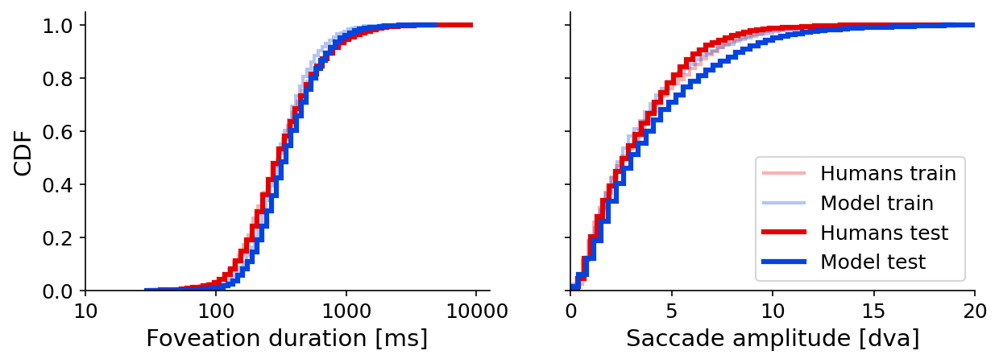

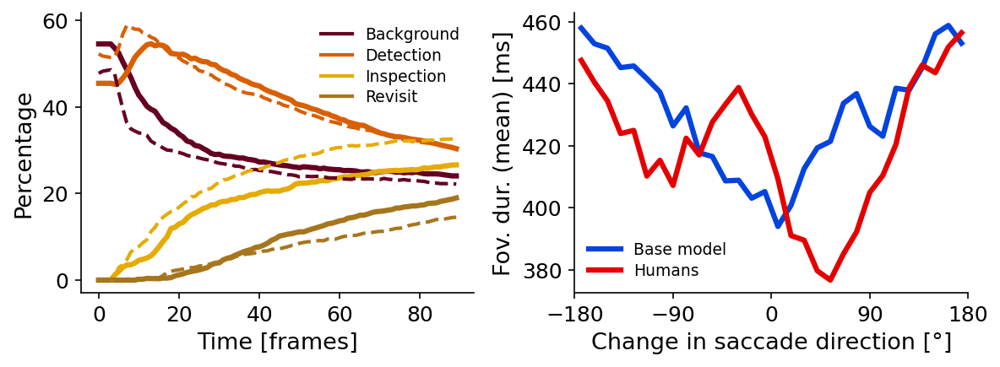

In [5]:
df_gt_all = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_all.csv", index_col=0)

identifier = 'task0.0_entropy0.11_dv3.0_sig0.3'

all_dirs = list(glob.iglob("/scratch/vito/scanpathes/results/*"))
test_list = [x for x in all_dirs if x.endswith("_TEST_base_" + identifier)]
train_list = [x for x in all_dirs if x.endswith("_base_4d_grid_5seeds_" + identifier)]
assert len(test_list) == len(train_list) == 1, "not unique parameter paths!"
training_run = train_list[0]
test_base_run = test_list[0]
df_train_res = pd.read_csv(f"{training_run}/df_res_fov.csv", index_col=0)
print("train mean", np.mean(df_train_res["sac_amp_dva"].dropna().values), " median", np.median(df_train_res["sac_amp_dva"].dropna().values))
df_test_res = pd.read_csv(f"{test_base_run}/df_res_fov.csv", index_col=0)
print("test mean", np.mean(df_test_res["sac_amp_dva"].dropna().values), " median", np.median(df_test_res["sac_amp_dva"].dropna().values))

veu.plot_cdf_fd_sa(df_test_res, df_train_res, df_gt_all)
plot_emerging_stats(df_test_res, df_gt_all, summary_measure="mean", ang_bins=30)

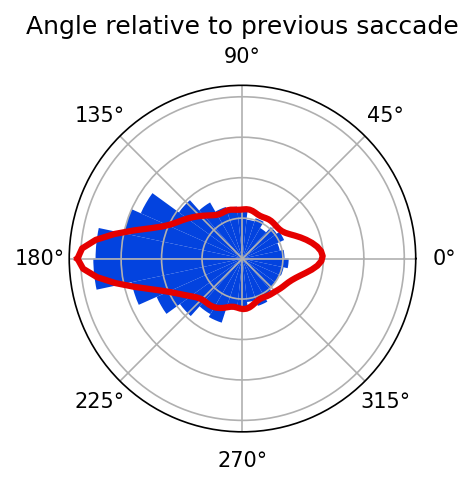

In [82]:
def plot_sac_ang_hists(df_eval, ground_truth=None, ang_bins=30, colors=["xkcd:blue", "xkcd:red"]):
    fig, ax = plt.subplots(1, 1, dpi=150, figsize=(3.5, 3), subplot_kw={'projection': 'polar'})
    prev_ang = df_eval["sac_ang_p"].dropna().values
    ax.hist(prev_ang / 180 * np.pi, ang_bins, density=True, color=colors[0])

    if ground_truth is not None:
        df_gt = ground_truth[ground_truth["video"].isin(df_eval["video"].unique())]
        prev_ang = df_gt["sac_ang_p"].dropna().values
        x_p, kde_p = vonmises_kde(prev_ang / 180 * np.pi, 50)
        ax.plot(x_p, kde_p, color=colors[1], lw=3)

    ax.set_xticks(ax.get_xticks())  ; ax.set_yticklabels([])
    # ax.set_xticklabels(["", "45°", "", "135°", "", "-135°", "", "-45°"])
    ax.set_title('Angle relative to previous saccade')
    plt.show()
    
plot_sac_ang_hists(df_test_res, df_gt_all)

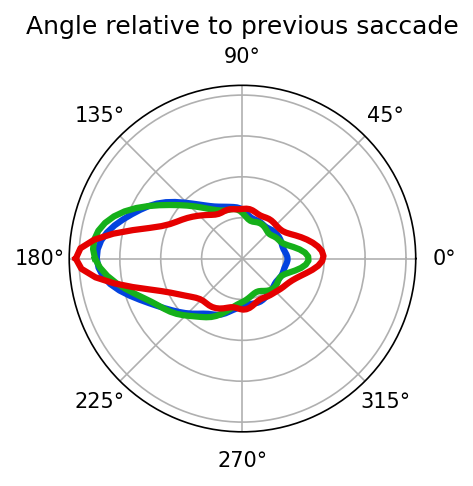

In [85]:
def plot_sac_ang_sacmo_comp(df_eval, df_sacmo, ground_truth, ang_bins=30, colors=["xkcd:blue", "xkcd:green", "xkcd:red"]):
    df_gt = ground_truth[ground_truth["video"].isin(df_eval["video"].unique())]
    dfs = [df_eval, df_sacmo, df_gt]
    
    fig, ax = plt.subplots(1, 1, dpi=150, figsize=(3.5, 3), subplot_kw={'projection': 'polar'})
    for i, df in enumerate(dfs):
        prev_ang = df["sac_ang_p"].dropna().values
        x_p, kde_p = vonmises_kde(prev_ang / 180 * np.pi, 50)
        ax.plot(x_p, kde_p, color=colors[i], lw=3)

    ax.set_xticks(ax.get_xticks())  ; ax.set_yticklabels([])
    # ax.set_xticklabels(["", "45°", "", "135°", "", "-135°", "", "-45°"])
    ax.set_title('Angle relative to previous saccade')
    plt.show()

test_sacmo_run = "/scratch/vito/scanpathes/results/2024-03-25-18-29-18_TEST_sacMom0.9-2.0-20deg_task0.0_entropy0.11_dv3.0_sig0.3"
df_sac_mom = pd.read_csv(f"{test_sacmo_run}/df_res_fov.csv", index_col=0)

plot_sac_ang_sacmo_comp(df_test_res, df_sac_mom, df_gt_all)

higher Umin

train mean 2.9525329846343036  median 2.212007266252326
test mean 3.6461051088460446  median 2.82572526815391


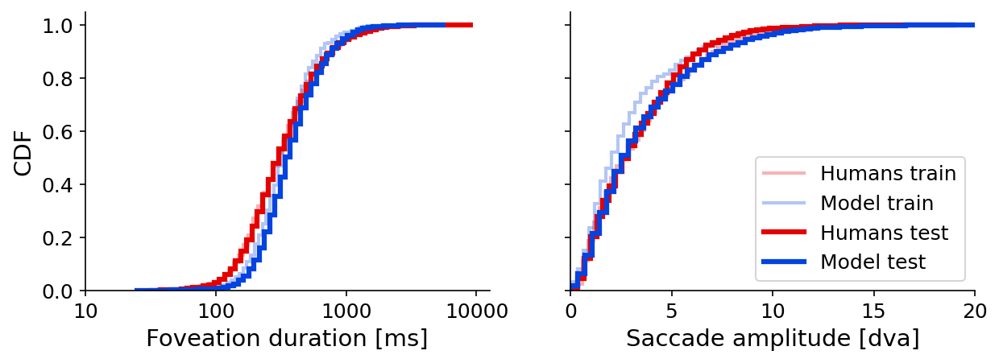

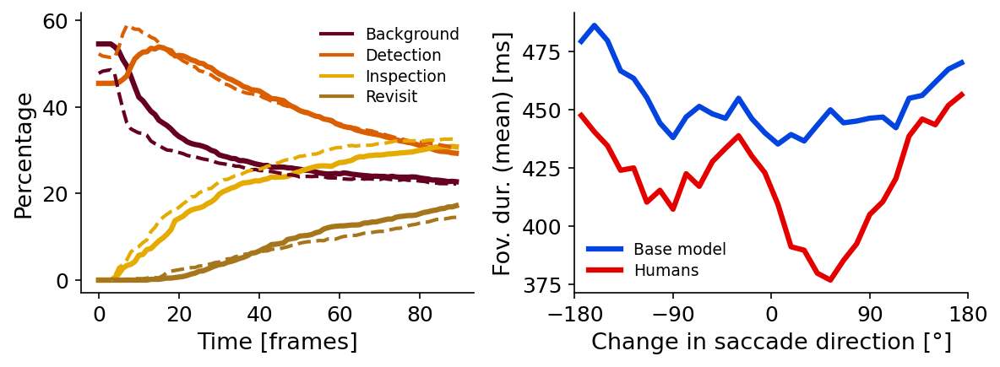

In [65]:
identifier = 'task0.0_entropy0.25_dv3.5_sig0.3'

all_dirs = list(glob.iglob("/scratch/vito/scanpathes/results/*"))
test_list = [x for x in all_dirs if x.endswith("_TEST_base_" + identifier)]
train_list = [x for x in all_dirs if x.endswith("_base_4d_grid_5seeds_" + identifier)]
assert len(test_list) == len(train_list) == 1, "not unique parameter paths!"
training_run = train_list[0]
test_base_run = test_list[0]
df_train_res = pd.read_csv(f"{training_run}/df_res_fov.csv", index_col=0)
print("train mean", np.mean(df_train_res["sac_amp_dva"].dropna().values), " median", np.median(df_train_res["sac_amp_dva"].dropna().values))
df_test_res = pd.read_csv(f"{test_base_run}/df_res_fov.csv", index_col=0)
print("test mean", np.mean(df_test_res["sac_amp_dva"].dropna().values), " median", np.median(df_test_res["sac_amp_dva"].dropna().values))

veu.plot_cdf_fd_sa(df_test_res, df_train_res, df_gt_all)
plot_emerging_stats(df_test_res, df_gt_all, summary_measure="mean", ang_bins=30)

In [66]:
test_base_run

'/scratch/vito/scanpathes/results/2024-03-27-15-23-58_TEST_base_task0.0_entropy0.25_dv3.5_sig0.3'

test mean 3.6461051088460446  median 2.82572526815391


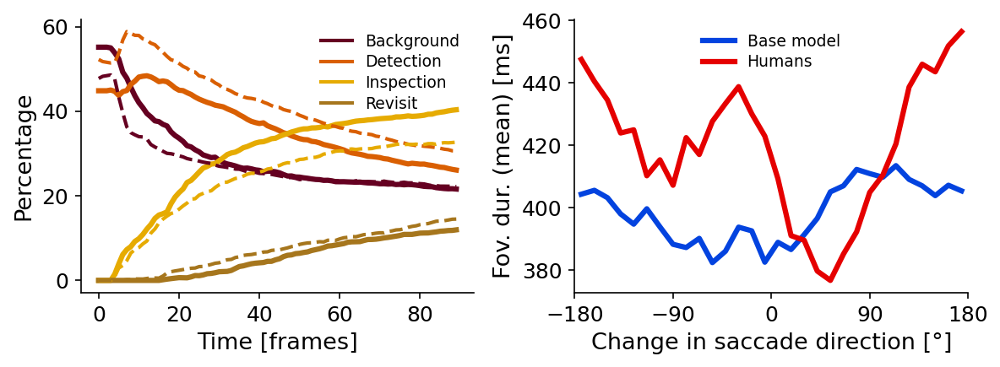

In [68]:
best_noUncert_run = "/scratch/vito/scanpathes/results/2024-03-21-00-25-30_TEST_noUncert_task0.0_entropy0.5_dv3.0_sig0.3"
df_test_noUncert = pd.read_csv(f"{best_noUncert_run}/df_res_fov.csv", index_col=0)
df_train_noUncert = pd.read_csv(f"{best_noUncert_run.replace('2024-03-21-00-25-30_TEST', '_')}/df_res_fov.csv", index_col=0)
print("test mean", np.mean(df_test_res["sac_amp_dva"].dropna().values), " median", np.median(df_test_res["sac_amp_dva"].dropna().values))

veu.plot_cdf_fd_sa(df_test_noUncert, df_train_noUncert, df_gt_all)
plot_emerging_stats(df_test_noUncert, df_gt_all, summary_measure="mean", ang_bins=30)

2024-04-17-13-16-11_TEST_hlObj_task0.0_entropy0.11_dv3.0_sig0.3
test mean 4.241078777363866  median 3.366300058454275


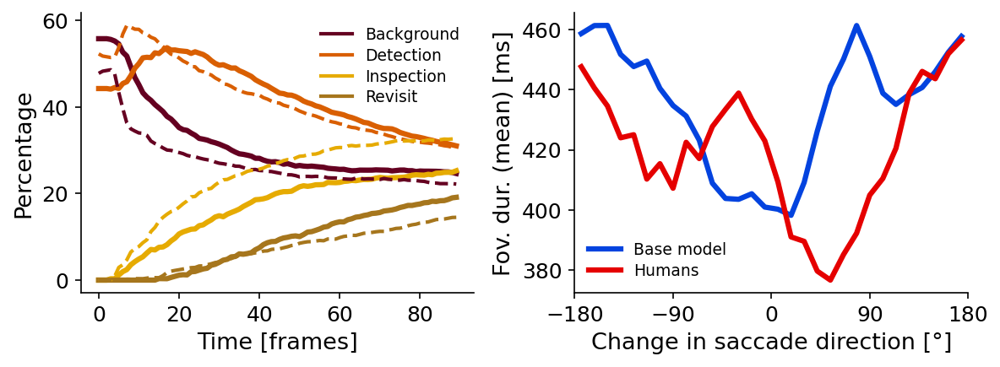

2024-04-17-13-16-13_TEST_llObj_task0.0_entropy0.11_dv3.0_sig0.3
test mean 2.2761809351673907  median 1.598256196599355


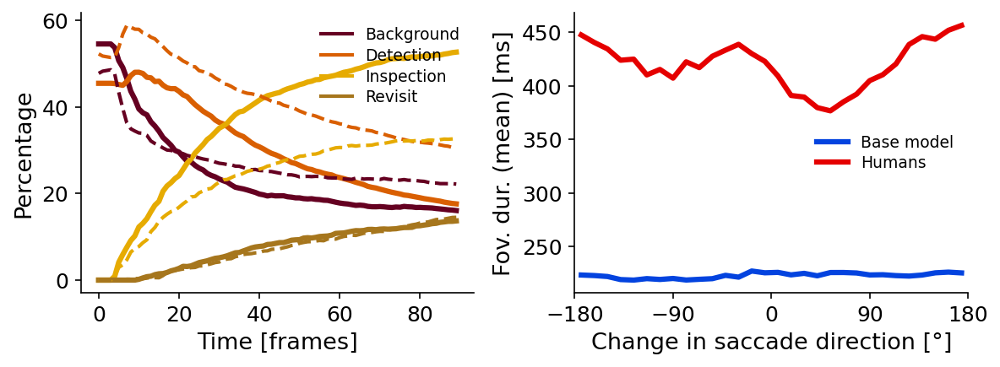

2024-04-17-13-16-14_TEST_noPrompt_task0.0_entropy0.11_dv3.0_sig0.3
test mean 2.5231182950579365  median 1.756726862108575


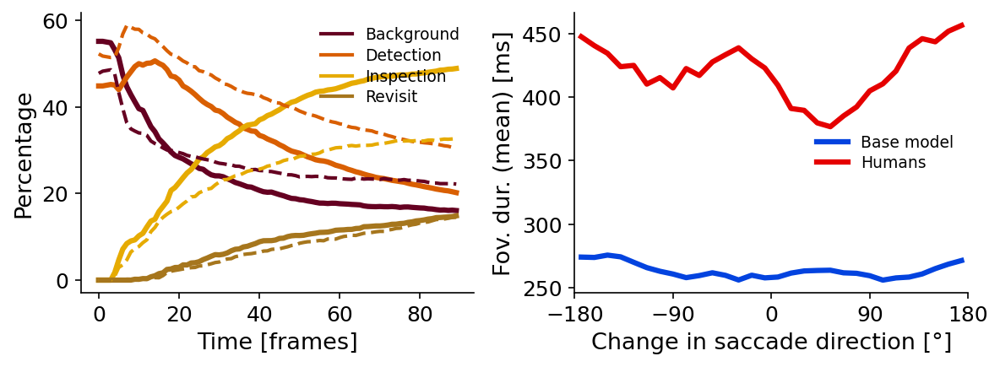

2024-03-25-18-29-20_TEST_3SEC_gtObj_task0.0_entropy0.11_dv3.0_sig0.3
test mean 3.695241589121075  median 2.9591475028395653


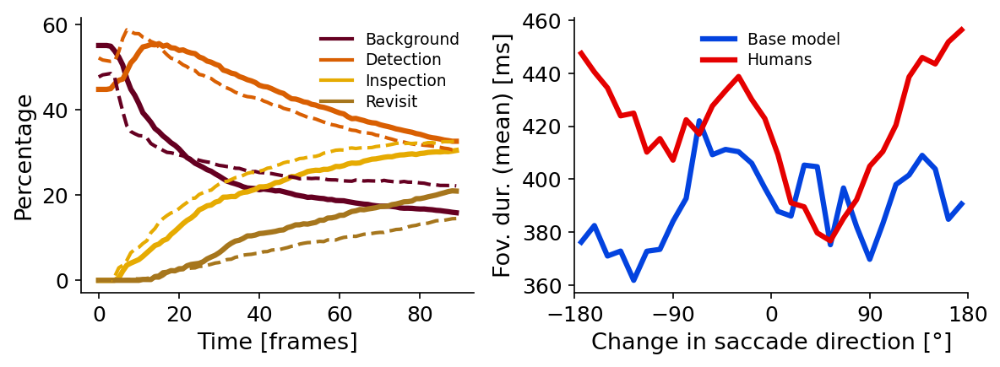

In [7]:
sets = ["2024-04-17-13-16-11_TEST_hlObj_task0.0_entropy0.11_dv3.0_sig0.3", "2024-04-17-13-16-13_TEST_llObj_task0.0_entropy0.11_dv3.0_sig0.3", "2024-04-17-13-16-14_TEST_noPrompt_task0.0_entropy0.11_dv3.0_sig0.3", "2024-03-25-18-29-20_TEST_3SEC_gtObj_task0.0_entropy0.11_dv3.0_sig0.3"]
len(sets)

for s in sets:
    df_test = pd.read_csv(f"/scratch/vito/scanpathes/results/{s}/df_res_fov.csv", index_col=0)
    print(s)
    print("test mean", np.mean(df_test["sac_amp_dva"].dropna().values), " median", np.median(df_test["sac_amp_dva"].dropna().values))
    # veu.plot_cdf_fd_sa(df_test, df_train_noUncert, df_gt_all)
    plot_emerging_stats(df_test, df_gt_all, summary_measure="mean", ang_bins=30)

### Object ablation study

In [22]:
bdir_ratios = get_BDIR_per_frames(df_gt, 90)
print(np.mean(bdir_ratios, axis=1))
print(np.sum(np.mean(bdir_ratios, axis=1)))

[27.41697296 42.2525963  23.401211    6.92921974]
99.99999999999999


7, 7


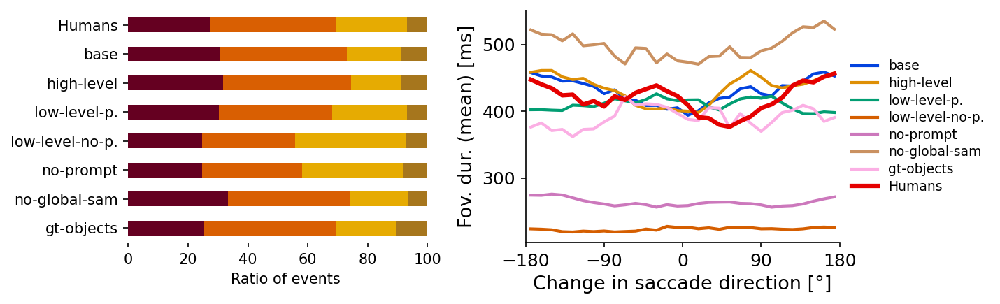

In [25]:
# def plot_emerging_stats(df_eval, ground_truth=None, ang_bins=30, sma_ws=5,
#                         colors=["xkcd:blue", "xkcd:red"], summary_measure="mean", 
#                         custom_name="Base model", obj_maxframes=90):
    

#     cols = ["xkcd:maroon", sns.color_palette("Dark2")[1], sns.color_palette("Dark2")[5], sns.color_palette("Dark2")[6]]
#     labels = ["Background", "Detection", "Inspection", "Revisit"]
#     for i, df in enumerate(dfs):
#         ratios = get_BDIR_per_frames(df, obj_maxframes)
#         for j in range(4):
#             axs[0].plot(ratios[j], color=cols[j], **bdir_kwargs[i])
#     axs[0].set_ylabel("Percentage", size=13)
#     axs[0].set_xlabel("Time [frames]", size=13)
#     axs[0].tick_params(labelsize=12)
#     legend_elements = [Line2D([0], [0], color=cols[i], lw=2, label=labels[i]) for i in range(4)]
#     # make legend smaller
#     axs[0].legend(handles=legend_elements, loc="upper right", labelspacing=0.3, prop={'size':9}, frameon=False)  #, bbox_to_anchor=(1.2, 1.0))
#     sns.despine(fig)
#     fig.tight_layout()
#     plt.show()

sets = ["2024-03-24-03-40-26_TEST_base_task0.0_entropy0.11_dv3.0_sig0.3",
        "2024-04-17-13-16-11_TEST_hlObj_task0.0_entropy0.11_dv3.0_sig0.3", 
        "2024-04-24-14-17-54_TEST_llPrompt_task0.0_entropy0.11_dv3.0_sig0.3",
        "2024-04-17-13-16-13_TEST_llObj_task0.0_entropy0.11_dv3.0_sig0.3", 
        "2024-04-17-13-16-14_TEST_noPrompt_task0.0_entropy0.11_dv3.0_sig0.3", 
        "2024-04-24-12-25-51_TEST_noGlobalSAM_task0.0_entropy0.11_dv3.0_sig0.3",
        "2024-03-25-18-29-20_TEST_3SEC_gtObj_task0.0_entropy0.11_dv3.0_sig0.3"
        ]
set_names = ["base", "high-level", "low-level-p.", "low-level-no-p.", "no-prompt", "no-global-sam", "gt-objects"]
colors = sns.color_palette("colorblind")
colors[0] = "xkcd:blue"
dircl = ["xkcd:maroon", sns.color_palette("Dark2")[1], sns.color_palette("Dark2")[5], sns.color_palette("Dark2")[6]]

print(f"{len(sets)}, {len(set_names)}")

summary_measure="mean"; ang_bins=30; sma_ws=5; obj_maxframes=90
mean_fovcats_test = []

fig, axs = plt.subplots(1, 2, dpi=150, figsize=(9, 3), sharey=False)
# kwargs = {"alpha": 1, "lw": 3} #, "label": custom_name}]

for s_idx, s in enumerate(sets):
    df_eval = pd.read_csv(f"/scratch/vito/scanpathes/results/{s}/df_res_fov.csv", index_col=0)
    x_vals, all = fovdur_vs_sacang(df_eval, ang_bins, sma_ws, summary_measure)
    axs[1].plot(x_vals, all, color=colors[s_idx], label=set_names[s_idx], lw=2)
    bdir_ratios = np.mean(get_BDIR_per_frames(df_eval, 90), axis=1)
    mean_fovcats_test.append(bdir_ratios)
    assert round(np.sum(bdir_ratios))==100
    
    

df_gt = df_gt_all[df_gt_all["video"].isin(df_eval["video"].unique())]
x_vals, all = fovdur_vs_sacang(df_gt, ang_bins, sma_ws, summary_measure)
axs[1].plot(x_vals, all, color="xkcd:red", label="Humans", lw=3)
gt_bdir_ratios = np.mean(get_BDIR_per_frames(df_gt, 90), axis=1)

mean_fovcats_test_r = mean_fovcats_test[::-1]
df_fovcats_test = pd.DataFrame(index=set_names[::-1] + ['Humans'], data= mean_fovcats_test_r + [gt_bdir_ratios])
df_fovcats_test.plot.barh(stacked=True, ax=axs[0],rot=0, legend=False, color=dircl)#.legend(bbox_to_anchor=(0.3, 1.5))
axs[0].set_frame_on(False); axs[0].set(xlabel = 'Ratio of events')#, title = 'Testset')



axs[1].set_xlabel('Change in saccade direction [°]', size=13)
axs[1].set_xlim(-180, 180)
# axs[0].set_yticks([200, 300, 400, 500, 600])
axs[1].set_xticks([-180, -90, 0, 90, 180])
axs[1].set_ylabel(f'Fov. dur. ({summary_measure}) [ms]', size=13)
axs[1].tick_params(labelsize=12)
# axs[1].legend(labelspacing=0.3, prop={'size':9}, frameon=False)

box = axs[1].get_position()
axs[1].set_position([box.x0, box.y0, box.width * 0.8, box.height])
axs[1].legend(loc='center left', bbox_to_anchor=(1, 0.5), labelspacing=0.3, prop={'size':9}, frameon=False)

plt.tight_layout()
sns.despine()
plt.show()


In [6]:
df_gt_all

,trial_id,video,subject,index,duration_ms,x_start,x_end,y_start,y_end,frame_start,frame_end,fov_start,fov_end,sac_amp_dva,gt_object,sac_ang_h,sac_ang_p,fov_category,ret_times
0,001_11_1,-Gfncisg2GE,1,0,198,528.0,523.0,451.0,449.0,0,5,0,198,5.704549,Ground,127.568592,NaN,B,NaN
1,001_11_1,-Gfncisg2GE,1,2,758,383.0,362.0,267.0,289.0,6,29,229,987,1.922142,Object 1,-153.103763,79.327645,D,NaN
2,001_11_1,-Gfncisg2GE,1,4,604,293.0,295.0,324.0,324.0,30,48,1002,1606,0.916529,Object 1,122.828542,-84.067695,I,NaN
3,001_11_1,-Gfncisg2GE,1,6,381,275.0,270.0,293.0,295.0,49,60,1629,2010,1.901480,Object 1,151.090816,28.262275,I,NaN
4,001_11_1,-Gfncisg2GE,1,8,775,203.0,208.0,258.0,270.0,60,84,2025,2800,1.739950,Object 1,-170.134193,38.774991,I,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14,014_21_198,3JGPQ3loSV4,14,28,636,534.0,535.0,163.0,199.0,122,141,4041,4677,4.293012,NaN,-127.002527,-118.872424,-,NaN
15,014_21_198,3JGPQ3loSV4,14,30,139,431.0,433.0,337.0,339.0,142,146,4732,4871,0.846148,NaN,93.366461,-139.631013,-,NaN
16,014_21_198,3JGPQ3loSV4,14,32,131,431.0,428.0,305.0,300.0,147,151,4895,5026,4.007244,NaN,165.274517,71.908057,-,NaN
17,014_21_198,3JGPQ3loSV4,14,34,392,272.0,266.0,259.0,229.0,153,164,5071,5463,4.134824,NaN,-20.394876,174.330607,-,NaN


### no uncert grid

In [4]:
nouncert_runs = veu.check_grid_result_completeness("_noUncert_4d_grid_5seeds_", exclude_in_name=["_cb_", "entropy1.0", "task1.0"]) # 2024-02-19-16-
print(len(nouncert_runs), nouncert_runs[0])

df_train_gt = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_train.csv", index_col=0)
df_nu = veu.eval_runs_to_dataframe_4d_grid_all(nouncert_runs, df_train_gt)
df_nu.sort_values("fit_fd_sa", ascending=True).head(10)

# NO UNCERTAINTY CONTRIBUTION MODEL, same grid

192 /scratch/vito/scanpathes/results/2024-03-24-03-46-52_noUncert_4d_grid_5seeds_task0.5_entropy0.11_dv6.0_sig0.3


/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:140: RuntimeWarning: invalid value encountered in scalar divide
  data["fwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)<10) / len(prev_ang)
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:141: RuntimeWarning: invalid value encountered in scalar divide
  data["bwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)>170) / len(prev_ang)
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:137: RuntimeWarning: Mean of empty slice
  data["mean_sa"][(par1, par2, par3, par4)] = np.nanmean(df["sac_amp_dva"])
/home/users/n/nicolas-roth/miniconda3/envs/cluster_config3/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:140: RuntimeWarning: inva

/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:140: RuntimeWarning: invalid value encountered in scalar divide
  data["fwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)<10) / len(prev_ang)
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:141: RuntimeWarning: invalid value encountered in scalar divide
  data["bwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)>170) / len(prev_ang)
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:140: RuntimeWarning: invalid value encountered in scalar divide
  data["fwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)<10) / len(prev_ang)
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:141: RuntimeWarning: invalid value encountered in scalar divide
  data["bwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)>170) / len(prev_ang)
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_e

/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:140: RuntimeWarning: invalid value encountered in scalar divide
  data["fwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)<10) / len(prev_ang)
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:141: RuntimeWarning: invalid value encountered in scalar divide
  data["bwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)>170) / len(prev_ang)
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:140: RuntimeWarning: invalid value encountered in scalar divide
  data["fwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)<10) / len(prev_ang)
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:141: RuntimeWarning: invalid value encountered in scalar divide
  data["bwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)>170) / len(prev_ang)
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_e

/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:140: RuntimeWarning: invalid value encountered in scalar divide
  data["fwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)<10) / len(prev_ang)
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:141: RuntimeWarning: invalid value encountered in scalar divide
  data["bwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)>170) / len(prev_ang)
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:137: RuntimeWarning: Mean of empty slice
  data["mean_sa"][(par1, par2, par3, par4)] = np.nanmean(df["sac_amp_dva"])
/home/users/n/nicolas-roth/miniconda3/envs/cluster_config3/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a, func=_nanmedian, keepdims=keepdims,
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:140: RuntimeWarning: inva

/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:140: RuntimeWarning: invalid value encountered in scalar divide
  data["fwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)<10) / len(prev_ang)
/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:141: RuntimeWarning: invalid value encountered in scalar divide
  data["bwd_sac"][(par1, par2, par3, par4)] = np.sum(np.abs(prev_ang)>170) / len(prev_ang)


,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,obj_slope,obj_r2,fovcat_dist,fit_fd_sa,fit_fd_sa_fc,fit_fd_sa_r2
38,"(0.0, 0.5, 3.0, 0.3)",345.919645,301.411670,3.070287,2.359538,0.037229,0.121212,0.122005,0.109783,0.707423,0.620120,0.243057,0.115894,0.158282,0.203889
37,"(0.0, 0.5, 3.0, 0.2)",360.758392,312.363801,2.757241,2.116534,0.030631,0.128829,0.171916,0.092875,0.778240,0.642468,0.265622,0.132396,0.176804,0.207441
89,"(0.11, 0.5, 4.0, 0.3)",351.480276,331.709881,3.042601,2.453003,0.036939,0.117854,0.111716,0.154973,0.788712,0.671060,0.279894,0.133344,0.182194,0.198543
36,"(0.0, 0.5, 3.0, 0.1)",372.237351,323.873655,2.691997,2.080469,0.031599,0.128253,0.178791,0.088472,0.827835,0.627635,0.298099,0.133631,0.188454,0.213209
140,"(0.25, 0.5, 5.0, 0.3)",325.599836,314.324894,3.221075,2.620989,0.039184,0.119184,0.086865,0.201162,0.624605,0.606435,0.148177,0.144014,0.145401,0.227197
121,"(0.25, 0.25, 3.0, 0.2)",319.528668,312.152427,3.311693,2.712079,0.039294,0.112269,0.076222,0.211831,0.607880,0.617718,0.136453,0.144027,0.141502,0.223445
173,"(0.5, 0.25, 4.0, 0.3)",310.937938,306.290591,3.478783,2.855899,0.038311,0.134480,0.054321,0.240588,0.648552,0.624064,0.085903,0.147455,0.126938,0.223615
88,"(0.11, 0.5, 4.0, 0.2)",358.055754,342.664731,2.932013,2.401614,0.035810,0.114593,0.130594,0.167820,0.786430,0.681000,0.254491,0.149207,0.184302,0.205805
139,"(0.25, 0.5, 5.0, 0.2)",331.738633,316.454321,3.180188,2.460837,0.034081,0.103076,0.094253,0.207179,0.699089,0.593898,0.243842,0.150716,0.181758,0.235845
172,"(0.5, 0.25, 4.0, 0.2)",313.159971,302.812136,3.297992,2.727045,0.043239,0.108491,0.072293,0.234135,0.588571,0.538039,0.200864,0.153214,0.169097,0.256130


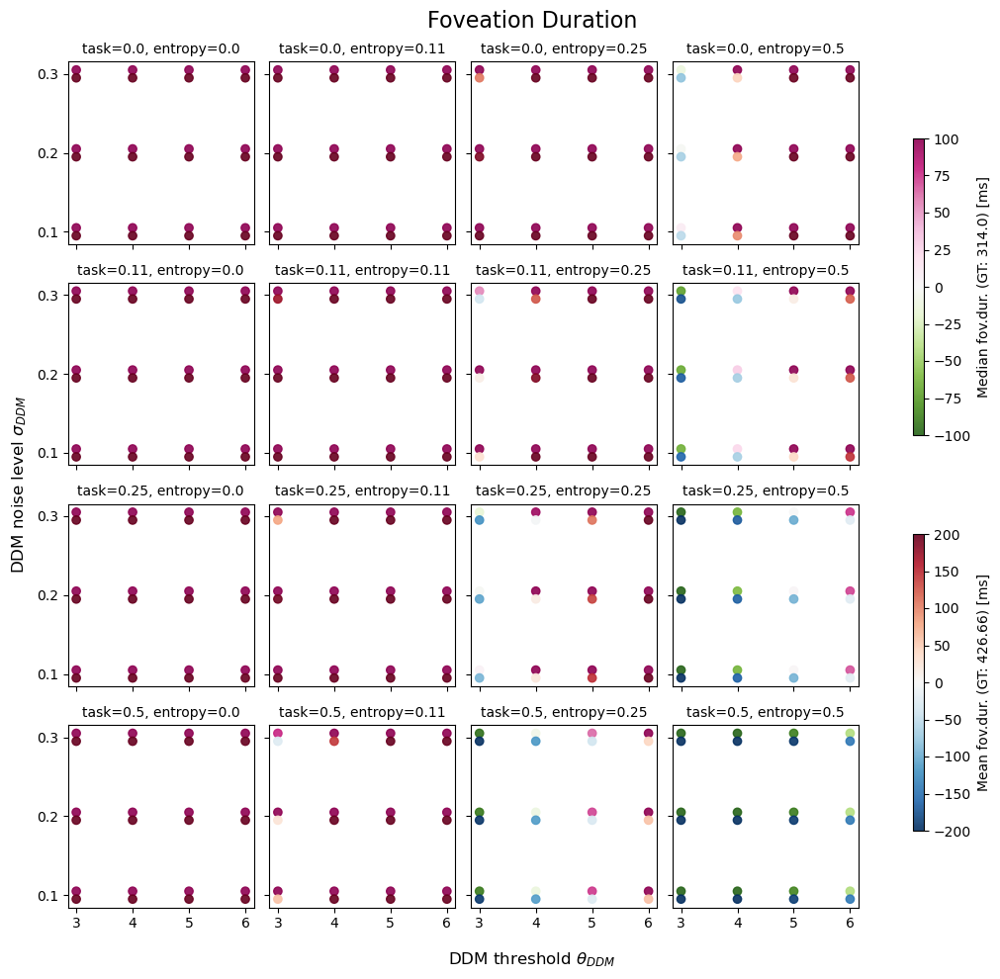

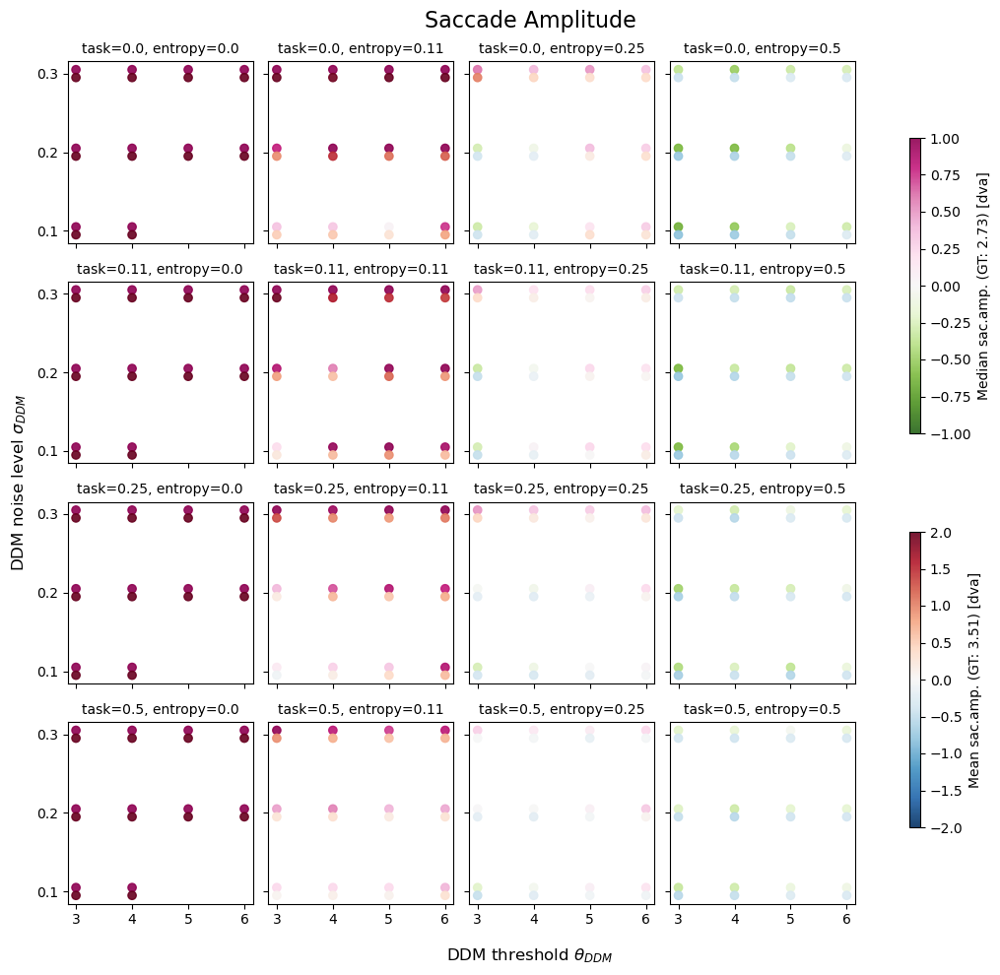

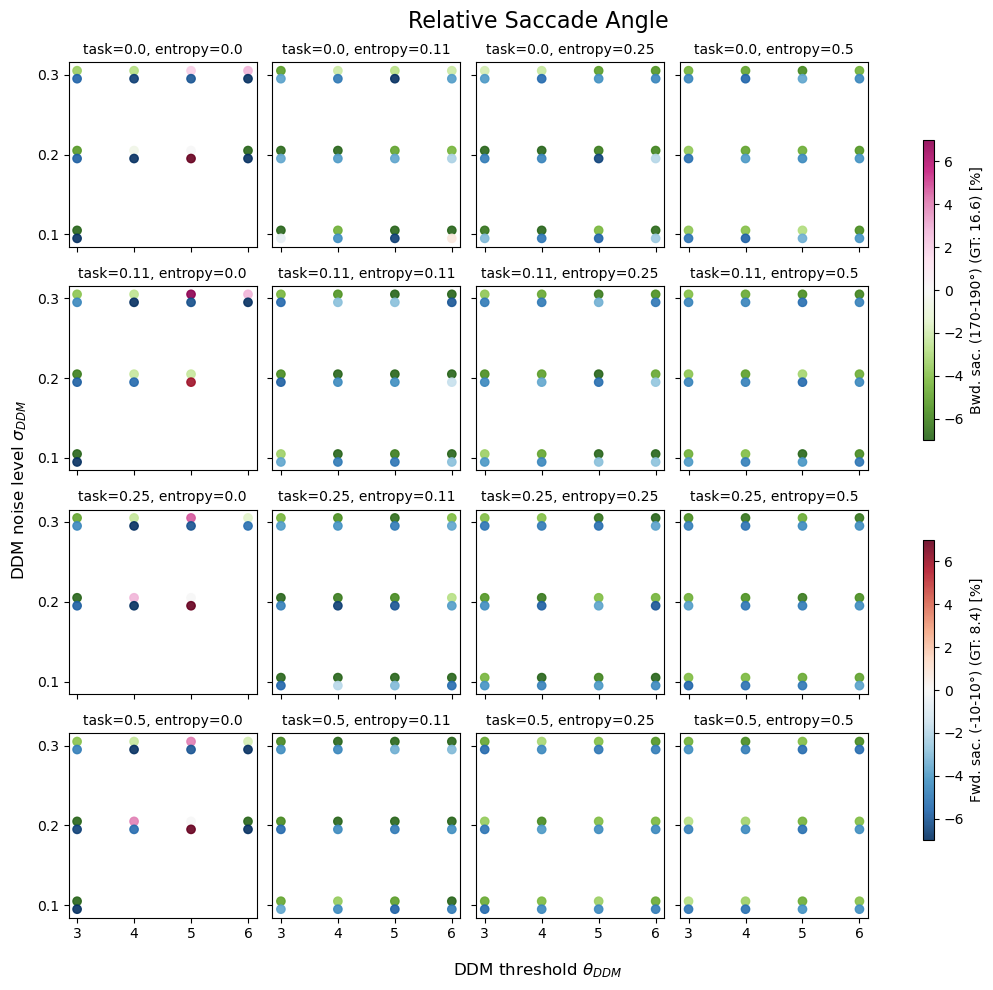

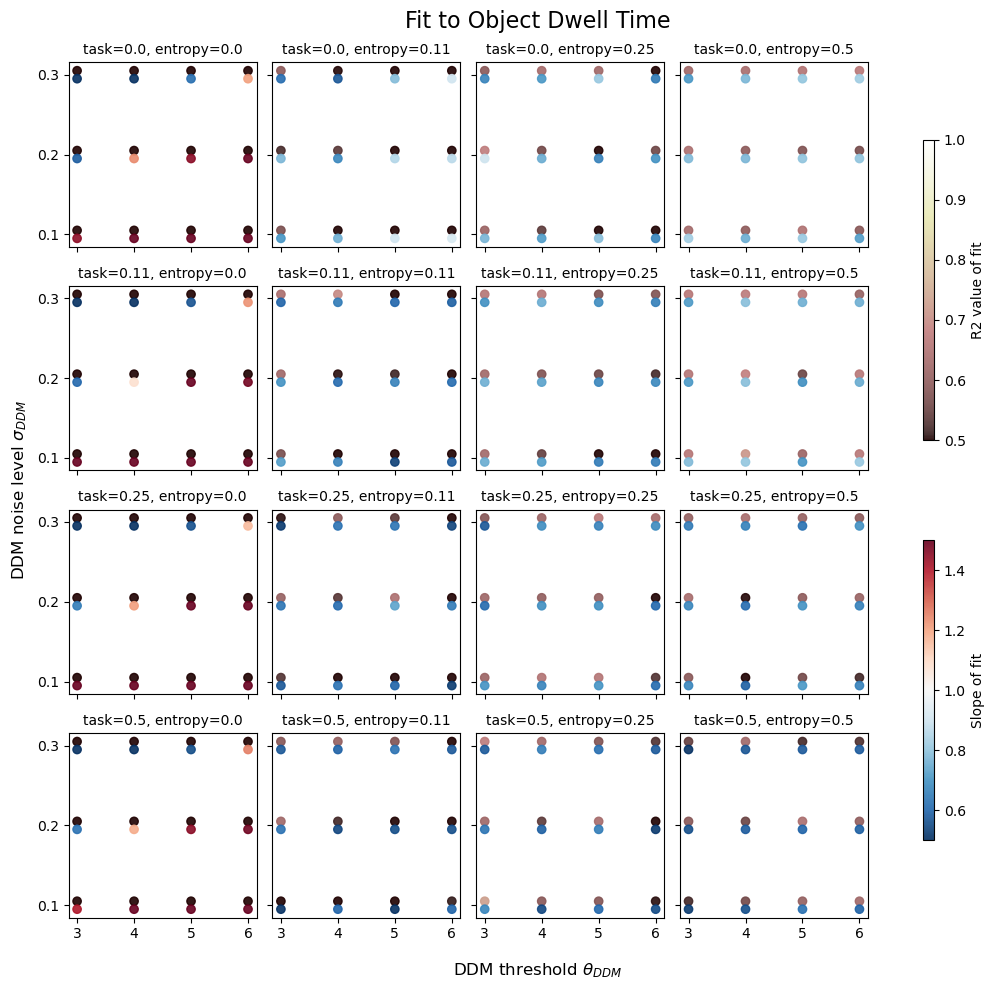

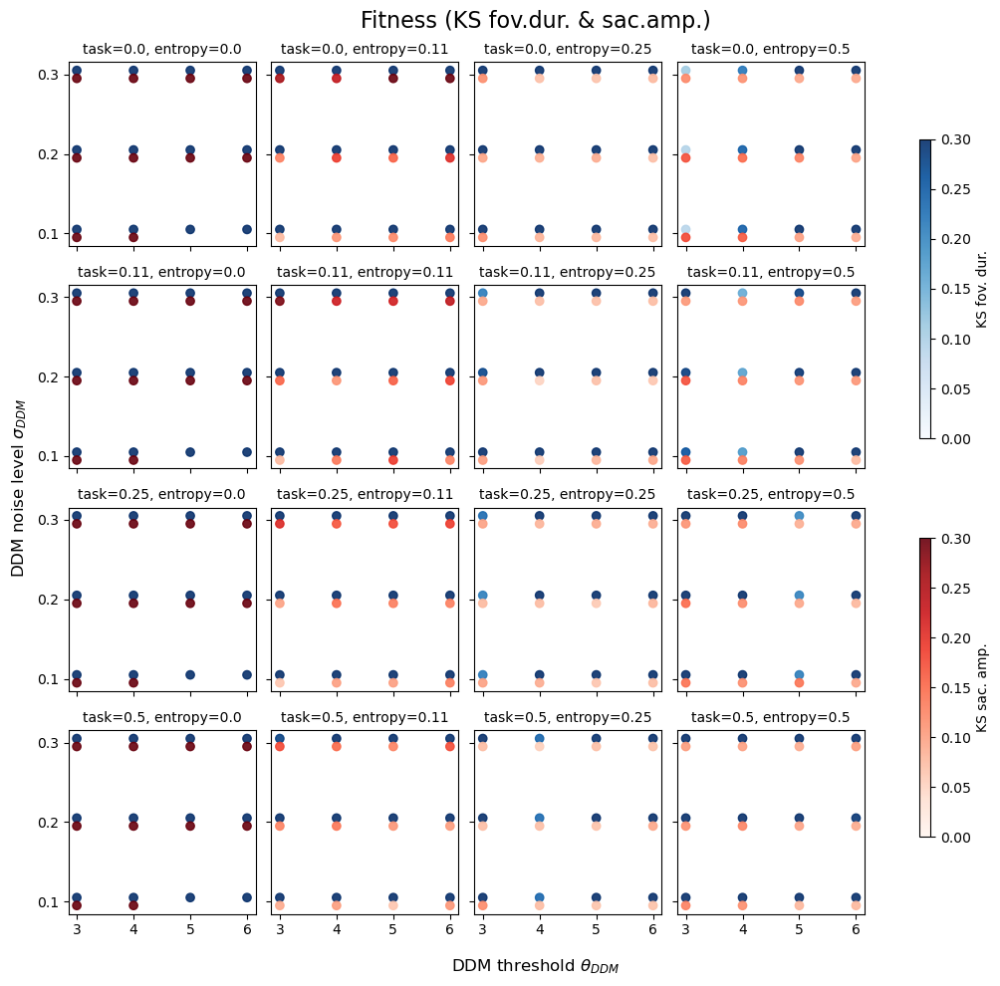

In [8]:
veu.plot_all_4d_grid(df_nu, df_train_gt)

In [9]:
df_nu.sort_values("fit_fd_sa", ascending=True).head(5) # 0.001, 0.25, 2.5, 0.3

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,fit_fd_sa,obj_slope,obj_r2
38,"(0.0, 0.5, 3.0, 0.3)",345.919645,301.411670,3.070287,2.359538,0.037229,0.121212,0.122005,0.109783,0.115894,0.707423,0.620120
37,"(0.0, 0.5, 3.0, 0.2)",360.758392,312.363801,2.757241,2.116534,0.030631,0.128829,0.171916,0.092875,0.132396,0.778240,0.642468
89,"(0.11, 0.5, 4.0, 0.3)",351.480276,331.709881,3.042601,2.453003,0.036939,0.117854,0.111716,0.154973,0.133344,0.788712,0.671060
36,"(0.0, 0.5, 3.0, 0.1)",372.237351,323.873655,2.691997,2.080469,0.031599,0.128253,0.178791,0.088472,0.133631,0.827835,0.627635
140,"(0.25, 0.5, 5.0, 0.3)",325.599836,314.324894,3.221075,2.620989,0.039184,0.119184,0.086865,0.201162,0.144014,0.624605,0.606435


### compare best parameters

In [ ]:
df_gt_all = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_all.csv", index_col=0)

for i, par in enumerate(param_strs):
    df_train_res = pd.read_csv(f"{training_runs[i]}/df_res_fov.csv")
    print("train mean", np.mean(df_train_res["sac_amp_dva"].dropna().values), " median", np.median(df_train_res["sac_amp_dva"].dropna().values))
    df_test_res = pd.read_csv(f"{test_base_runs[i]}/df_res_fov.csv")
    print("test mean", np.mean(df_test_res["sac_amp_dva"].dropna().values), " median", np.median(df_test_res["sac_amp_dva"].dropna().values))
    print(df_test_res.groupby("video")["sac_amp_dva"].mean().sort_values(ascending=False).iloc[:2])
    df_noUncert_res = pd.read_csv(f"{test_noUncert_runs[i]}/df_res_fov.csv")
    # print()

    
    veu.plot_cdf_fd_sa(df_test_res, df_train_res, df_gt_all, df_noUncert_res, "Test: No Uncertainty")
    plot_object_comparison(df_test_res, df_gt_all, df_noUncert_res, "Test: No Uncertainty", title=par)


In [18]:
videos = os.listdir("/scratch/vito/scanpathes/results/2024-03-19-14-52-11_noUncert_4d_grid_5seeds_task0.5_entropy1.0_dv5.0_sig0.3/config_0/")
videos

['2fojVBo1tv0',
 '0AkA2Ru9qG0',
 '3-evHTgxa8M',
 '-sGcmYcU_QI',
 '-2HFZjPOCMk',
 '-5FU8vEKtyE',
 '4-dI5vRgGWQ',
 '3JGPQ3loSV4',
 '07YX_GR_cEE',
 '24cgfaG8WI0']

In [21]:
grid_dirs = ["/scratch/vito/scanpathes/results/2024-03-19-14-52-11_noUncert_4d_grid_5seeds_task0.5_entropy1.0_dv6.0_sig0.3", "/scratch/vito/scanpathes/results/2024-03-19-14-52-11_noUncert_4d_grid_5seeds_task0.5_entropy1.0_dv5.0_sig0.3", "/scratch/vito/scanpathes/results/2024-03-19-14-52-03_noUncert_4d_grid_5seeds_task0.5_entropy0.0_dv5.0_sig0.1"]
for RES_DIR in grid_dirs:
    res_files = []
    for path, subdirs, files in os.walk(RES_DIR):
        for name in files:
            if name == "raw_results.pickle4":
                res_files.append(os.path.join(path, name))
    # if len(res_files) != nresults: 
    #     print(f"WARNING! Only {len(res_files)}/{nresults} result files in {RES_DIR}")
    # else:
    #     complete_dirs.append(RES_DIR)
    for i in range(5):
        conflist = [x for x in res_files if f"config_{i}" in x]
        if len(conflist) != 10:
            for vid in videos:
                vidlist = [x for x in conflist if vid in x]
                if len(vidlist) == 0:
                    print(RES_DIR)
                    print(i, vid)


/scratch/vito/scanpathes/results/2024-03-19-14-52-03_noUncert_4d_grid_5seeds_task0.5_entropy0.0_dv5.0_sig0.1
2 3JGPQ3loSV4


## extensive grid search (task, entropy, dv, sig)	

In [3]:
base_runs = veu.check_grid_result_completeness("_cb_base_4d_grid_5seeds_", exclude_dates=["2024-03-1"]) # 2024-02-19-16-
print(len(base_runs), base_runs[0])

df_train_gt = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_train.csv", index_col=0)
df_4d = veu.eval_runs_to_dataframe_4d_grid_all(base_runs, df_train_gt)
df_4d.head(5) #.sort_values("fit_fd_sa", ascending=True).head(20)

108 /scratch/vito/scanpathes/results/2024-03-19-00-44-22_base_4d_grid_5seeds_task1.0_entropy1.0_dv6.0_sig0.3


KeyboardInterrupt: 

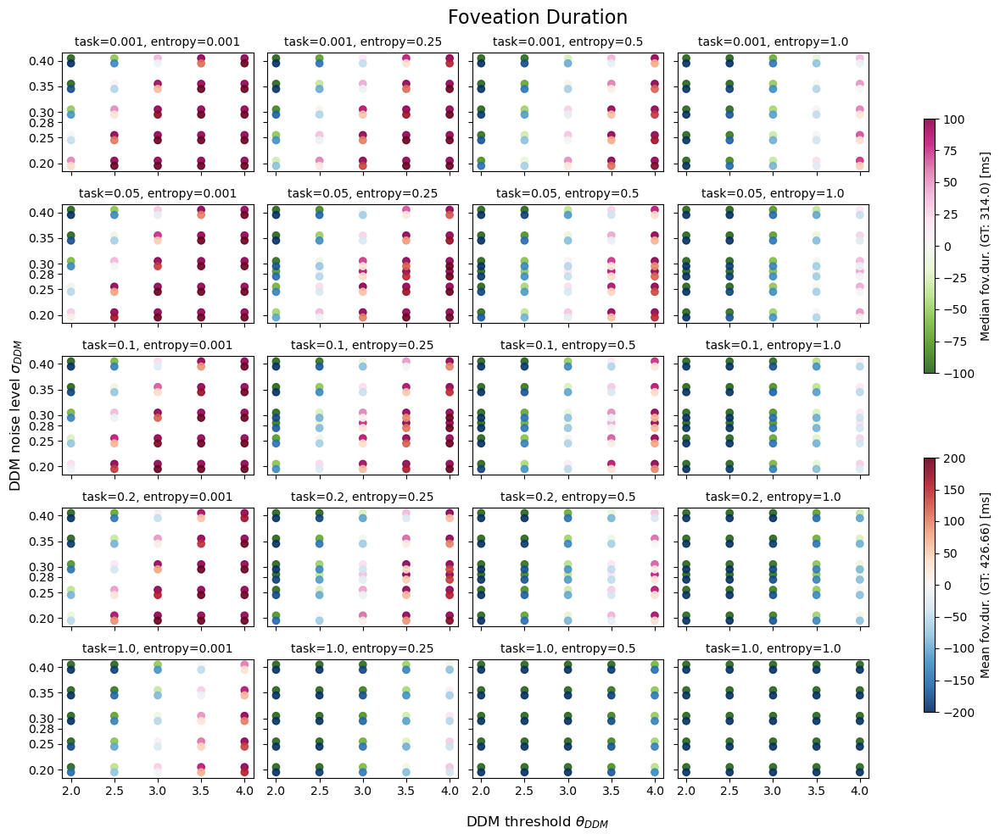

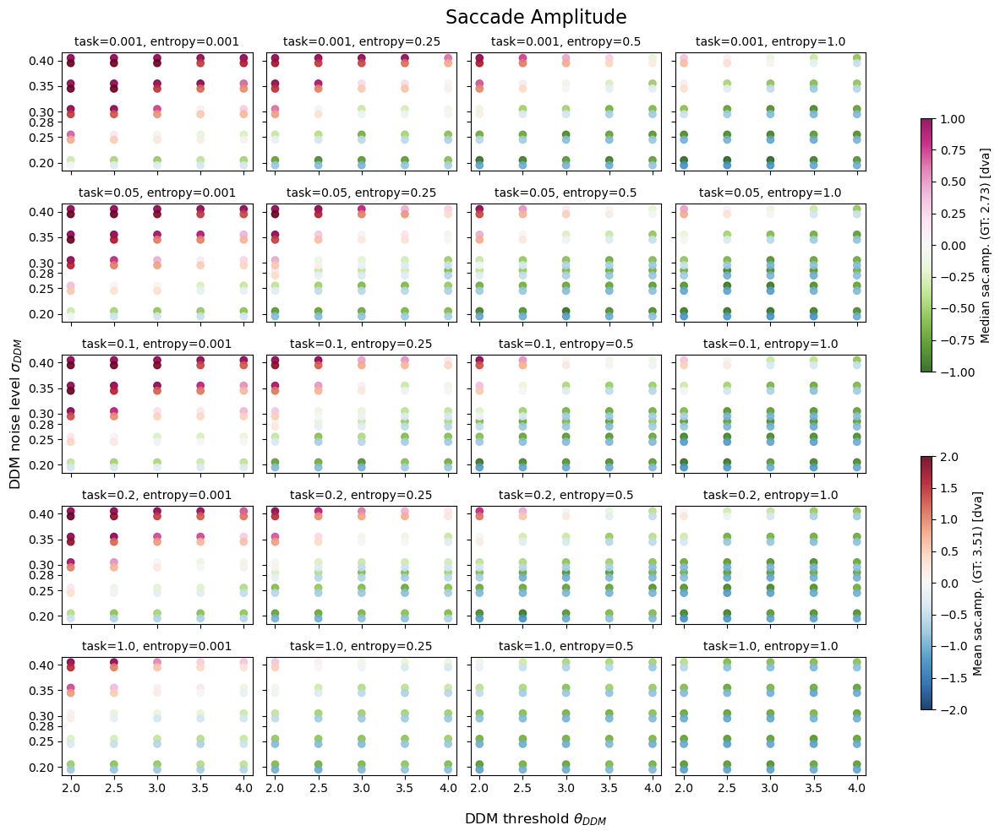

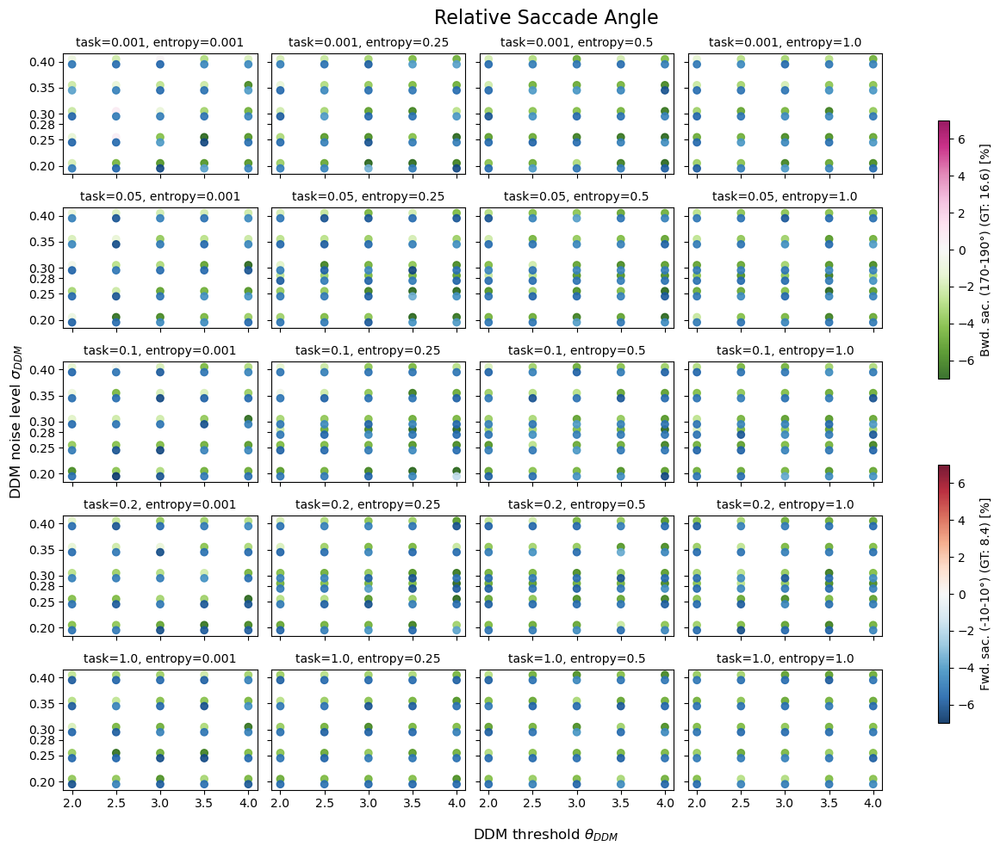

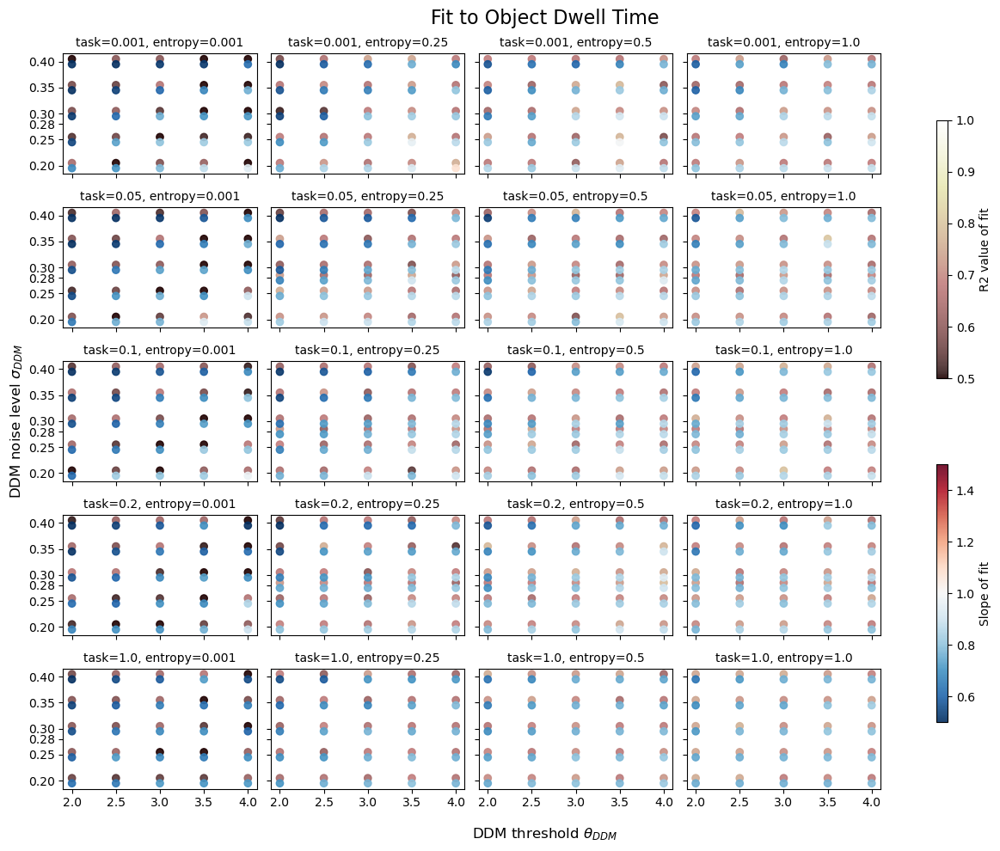

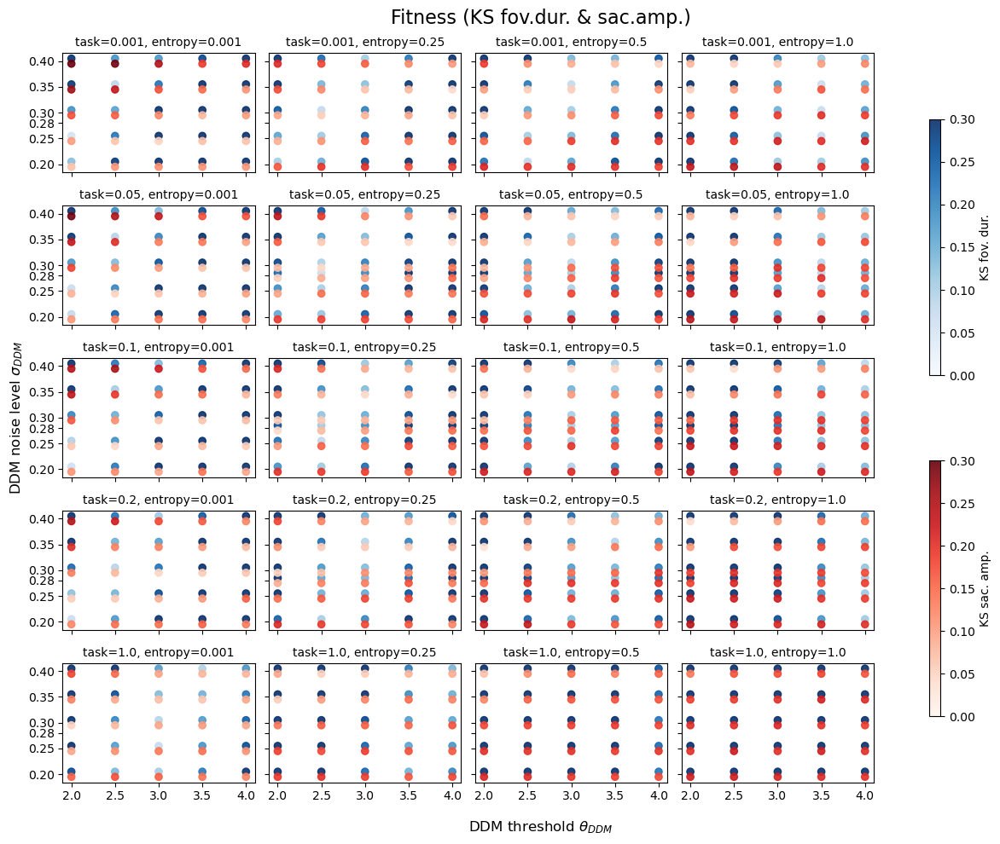

In [4]:
veu.plot_all_4d_grid(df_4d, df_train_gt)

### plot the evaluation on test for params with highest fitness

In [5]:
df_4d.sort_values("fit_fd_sa", ascending=True).head(5)

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,fit_fd_sa,obj_slope,obj_r2
32,"(0.001, 0.25, 2.5, 0.3)",366.316408,309.166782,3.799442,2.739522,0.043318,0.134562,0.055478,0.077911,0.066694,0.586388,0.536642
63,"(0.001, 0.5, 3.0, 0.35)",360.140786,308.801132,3.497227,2.652864,0.042495,0.117541,0.055230,0.078459,0.066845,0.763239,0.746911
134,"(0.05, 0.25, 2.5, 0.3)",351.187593,305.114752,3.634836,2.619400,0.026478,0.105031,0.045359,0.095989,0.070674,0.650266,0.639992
371,"(0.2, 0.25, 3.0, 0.35)",354.900876,309.469351,3.535730,2.661857,0.036542,0.122995,0.060673,0.089914,0.075293,0.727692,0.689292
293,"(0.1, 0.5, 3.5, 0.4)",366.577495,327.468102,3.568213,2.681080,0.034070,0.126151,0.049654,0.101661,0.075657,0.725437,0.702105


In [6]:
param_strs = ["task0.001_entropy0.25_dv2.5_sig0.3", "task0.001_entropy0.5_dv3.0_sig0.35", "task0.2_entropy0.25_dv3.0_sig0.35"]
# base_test_runs = sorted(veu.check_grid_result_completeness("_TEST_task", nseeds=10, nvideos=33))

all_dirs = list(glob.iglob("/scratch/vito/scanpathes/results/*"))
training_runs = []
test_base_runs = []
test_noUncert_runs = []

for identifier in param_strs:
    train_list = [x for x in all_dirs if x.endswith("_cb_base_4d_grid_5seeds_" + identifier)]
    training_runs.append(train_list[0])
    test_list = [x for x in all_dirs if x.endswith("_TEST_" + identifier)]
    test_base_runs.append(test_list[0])
    test_noUncert_list = [x for x in all_dirs if x.endswith("TEST_NO_UNCERT_" + identifier)]
    test_noUncert_runs.append(test_noUncert_list[0])
    assert len(train_list) == 1 == len(test_list) == len(test_noUncert_list), "not unique identifier"

train mean 3.7994420930650463  median 2.739521555900574
test mean 4.716226320786961  median 3.62681958638533
video
-PMG_RNHaQE    8.186384
02L6JyleSLE    7.599344
Name: sac_amp_dva, dtype: float64


/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:57: RuntimeWarning: invalid value encountered in log10
  axs[0].hist(np.log10(res_dur_ms), nbins, density=True, histtype='step', cumulative=True, label=f"Model {modus}", color="xkcd:blue", **kwargs)


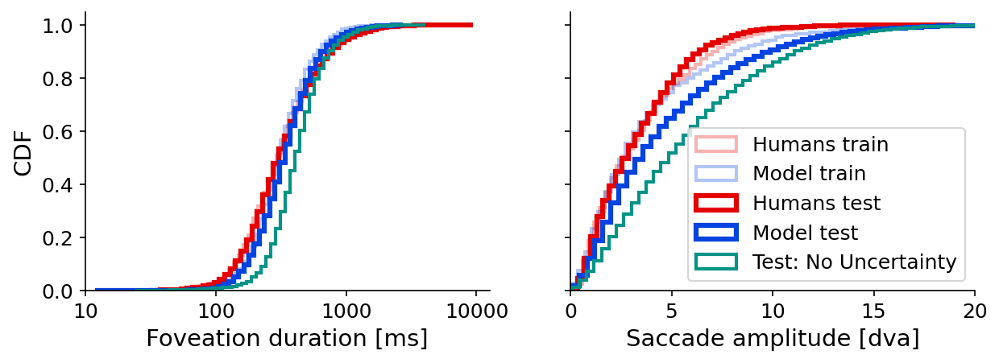

Test: No Uncertainty: slope: 0.5564719168629436, intercept: 120.91112841611994, r_value: 0.7503517100318086, p_value: 1.4394397764231456e-30, std_err: 0.03875657078985953, r2 : 0.5630276887476593
slope: 0.5972980301458574, intercept: 133.86120925681075, r_value: 0.7621963767378394, p_value: 1.8522330782647446e-31, std_err: 0.040486549199611935, r2 : 0.5809433167122904
[27.41697296 42.2525963  23.401211    6.92921974]
[31.36393167 41.85537466 18.27815754  8.50253613]
[37.42040098 42.77632032 14.47751555  5.32576315]


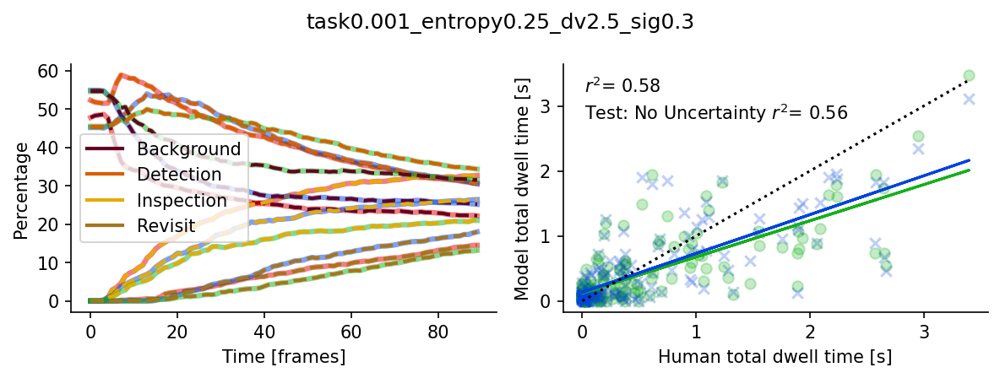

train mean 3.4972271686773264  median 2.6528635703786616
test mean 4.500119808525315  median 3.4579379020259307
video
-PMG_RNHaQE    7.950965
02L6JyleSLE    7.313768
Name: sac_amp_dva, dtype: float64


/scratch/vito/scanpathes/code/domip_scanpathes/src/visualization_eval_utils.py:57: RuntimeWarning: invalid value encountered in log10
  axs[0].hist(np.log10(res_dur_ms), nbins, density=True, histtype='step', cumulative=True, label=f"Model {modus}", color="xkcd:blue", **kwargs)


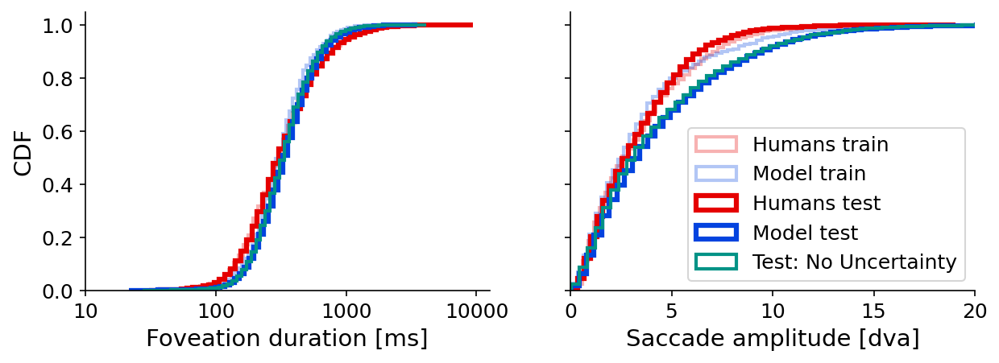

Test: No Uncertainty: slope: 0.6139590707351269, intercept: 120.0058759368049, r_value: 0.7555063973672067, p_value: 6.726867335772909e-30, std_err: 0.04304180907640912, r2 : 0.5707899164627757
slope: 0.6051294273951346, intercept: 135.31864564783996, r_value: 0.7531715765611477, p_value: 1.9229733568084105e-29, std_err: 0.042868901223084475, r2 : 0.5672674237396048
[27.41697296 42.2525963  23.401211    6.92921974]
[31.11707998 40.29786545 20.52368969  8.06136488]
[31.08153071 38.23904818 25.30166061  5.3777605 ]


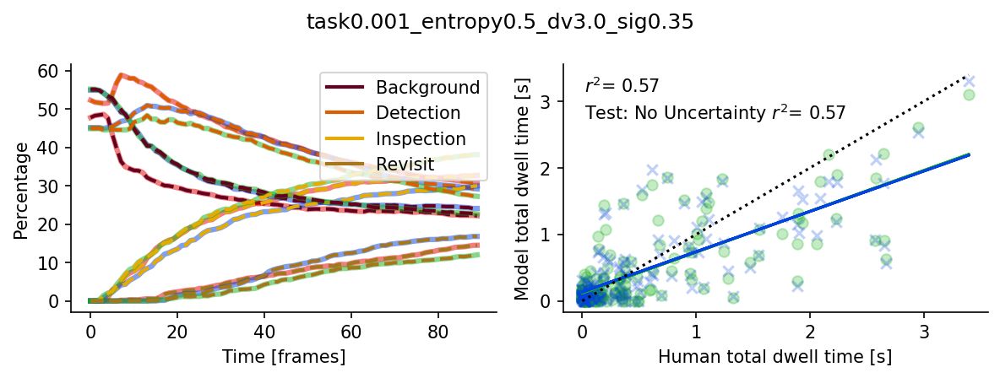

train mean 3.535729588193793  median 2.661857416925721
test mean 4.356145600370922  median 3.3796779445853677
video
02L6JyleSLE    6.065364
-PMG_RNHaQE    6.058117
Name: sac_amp_dva, dtype: float64


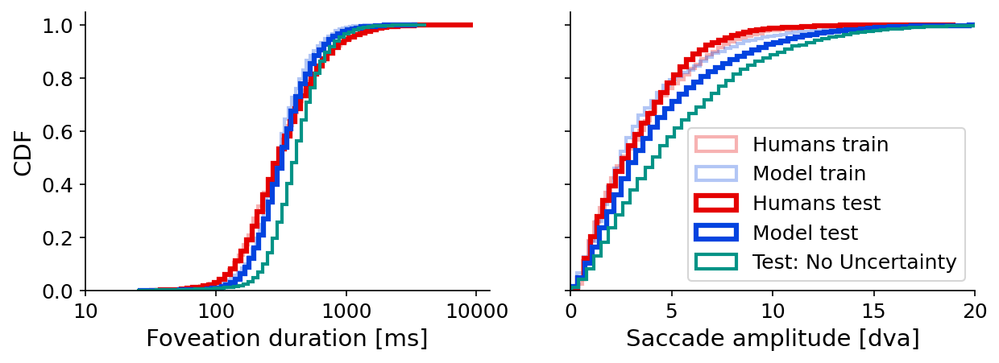

Test: No Uncertainty: slope: 0.5499204527105448, intercept: 137.9257201995103, r_value: 0.7466579271370941, p_value: 4.651993658496958e-29, std_err: 0.03947984337514322, r2 : 0.5574980601566621
slope: 0.6161551625953496, intercept: 125.16823549562872, r_value: 0.7794652852791882, p_value: 4.304441689463638e-33, std_err: 0.03990397818386048, r2 : 0.6075661309553663
[27.41697296 42.2525963  23.401211    6.92921974]
[31.55323562 40.8128473  19.2474449   8.38647219]
[36.41476323 41.96013457 16.34108807  5.28401412]


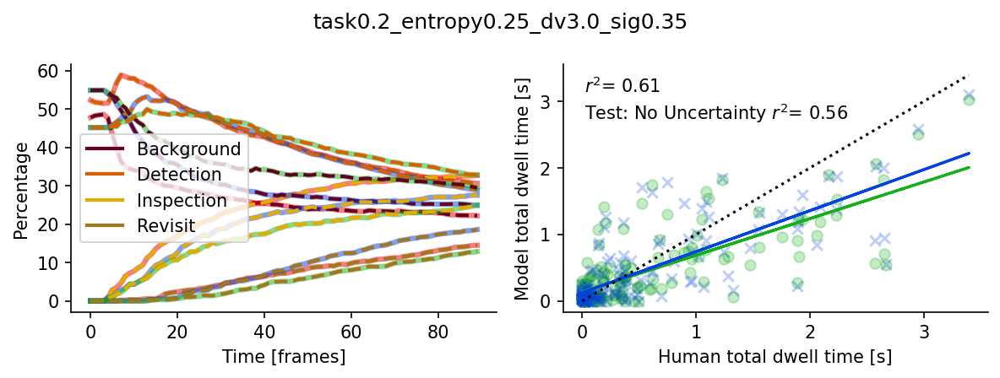

In [10]:
df_gt_all = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_all.csv", index_col=0)

for i, par in enumerate(param_strs):
    df_train_res = pd.read_csv(f"{training_runs[i]}/df_res_fov.csv")
    print("train mean", np.mean(df_train_res["sac_amp_dva"].dropna().values), " median", np.median(df_train_res["sac_amp_dva"].dropna().values))
    df_test_res = pd.read_csv(f"{test_base_runs[i]}/df_res_fov.csv")
    print("test mean", np.mean(df_test_res["sac_amp_dva"].dropna().values), " median", np.median(df_test_res["sac_amp_dva"].dropna().values))
    print(df_test_res.groupby("video")["sac_amp_dva"].mean().sort_values(ascending=False).iloc[:2])
    df_noUncert_res = pd.read_csv(f"{test_noUncert_runs[i]}/df_res_fov.csv")
    # print()

    
    veu.plot_cdf_fd_sa(df_test_res, df_train_res, df_gt_all, df_noUncert_res, "Test: No Uncertainty")
    plot_object_comparison(df_test_res, df_gt_all, df_noUncert_res, "Test: No Uncertainty", title=par)


In [19]:
par

'task0.5_entropy1.0_dv5.0_sig0.2'

## grid with high added task number

In [24]:
new_grid_runs = veu.check_grid_result_completeness("_cb_base_4d_grid_5seeds_", exclude_dates=["2024-03-0", "2024-02-"])
print(len(new_grid_runs), new_grid_runs[0])

df_train_gt = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_train.csv", index_col=0)
df_new_grid = veu.eval_runs_to_dataframe_4d_grid_all(new_grid_runs, df_train_gt)
df_new_grid#.sort_values("fit_fd_sa", ascending=True).head(5)

144 /scratch/vito/scanpathes/results/2024-03-16-20-00-15_cb_base_4d_grid_5seeds_task1.0_entropy1.0_dv6.0_sig0.25


,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,fit_fd_sa,obj_slope,obj_r2
0,"(0.5, 0.25, 4.0, 0.0)",503.261340,447.190132,2.738849,2.179462,0.024142,0.102922,0.153567,0.334219,0.243893,0.804821,0.649978
1,"(0.5, 0.25, 4.0, 0.05)",500.058335,445.101542,2.588744,2.054753,0.036570,0.110971,0.197359,0.333182,0.265271,0.785367,0.610990
2,"(0.5, 0.25, 4.0, 0.1)",495.571517,441.101203,2.731576,2.116015,0.048750,0.111250,0.162599,0.313149,0.237874,0.763108,0.597015
3,"(0.5, 0.25, 4.0, 0.15)",487.719871,434.637183,2.651480,1.993929,0.033170,0.130221,0.190708,0.299534,0.245121,0.775629,0.619687
4,"(0.5, 0.25, 4.0, 0.2)",471.662886,426.889410,2.702597,2.112875,0.027284,0.113879,0.185409,0.291080,0.238245,0.837461,0.667824
...,...,...,...,...,...,...,...,...,...,...,...,...
139,"(1.0, 1.0, 6.0, 0.05)",348.350496,332.421030,2.597793,2.078922,0.041703,0.112945,0.181154,0.171656,0.176405,0.848433,0.706592
140,"(1.0, 1.0, 6.0, 0.1)",344.247941,330.034398,2.679216,2.144916,0.036942,0.110825,0.166275,0.163459,0.164867,0.790599,0.650580
141,"(1.0, 1.0, 6.0, 0.15)",347.149562,326.702604,2.711881,2.137635,0.046794,0.129983,0.175751,0.168095,0.171923,0.853658,0.753531
142,"(1.0, 1.0, 6.0, 0.2)",346.485075,324.885086,2.620698,2.095521,0.037165,0.111495,0.187937,0.155549,0.171743,0.835483,0.725153


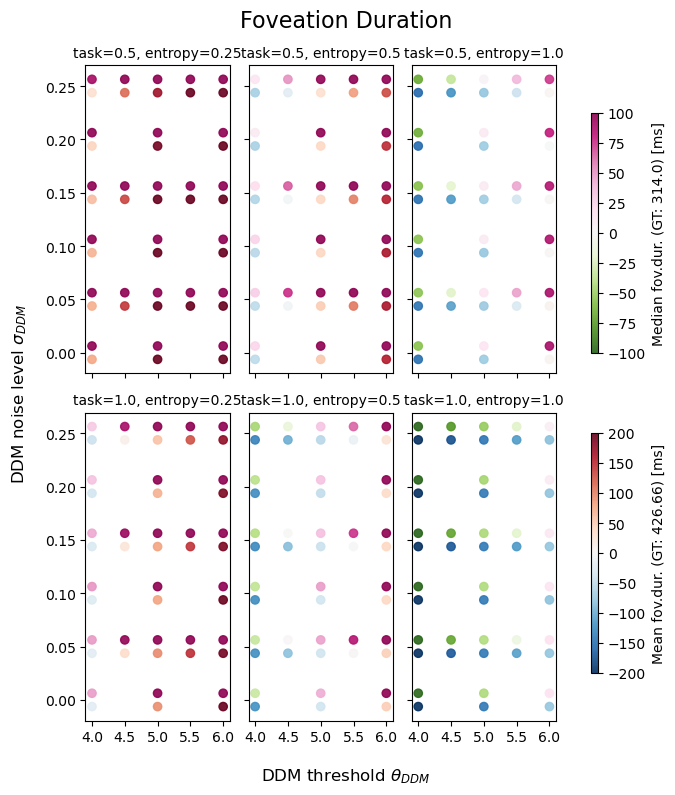

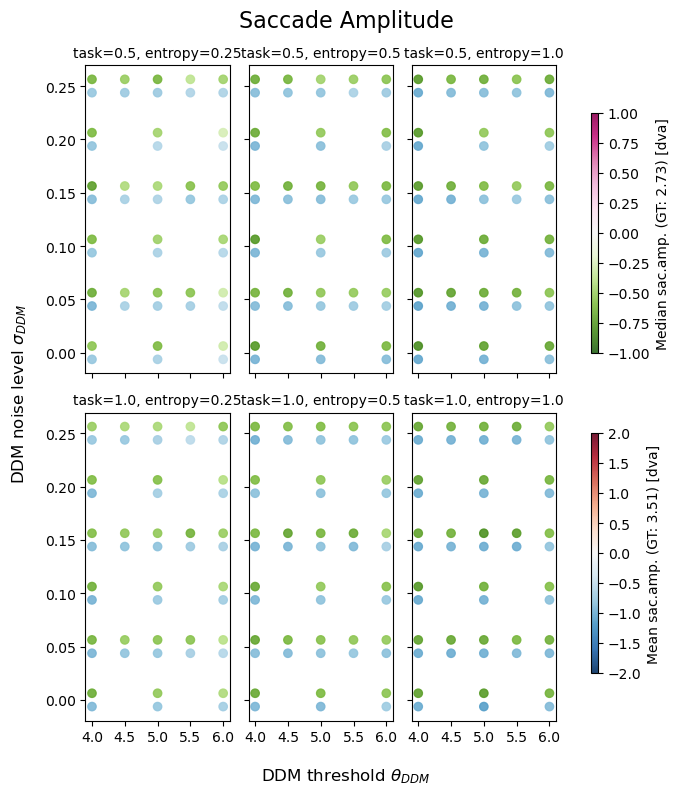

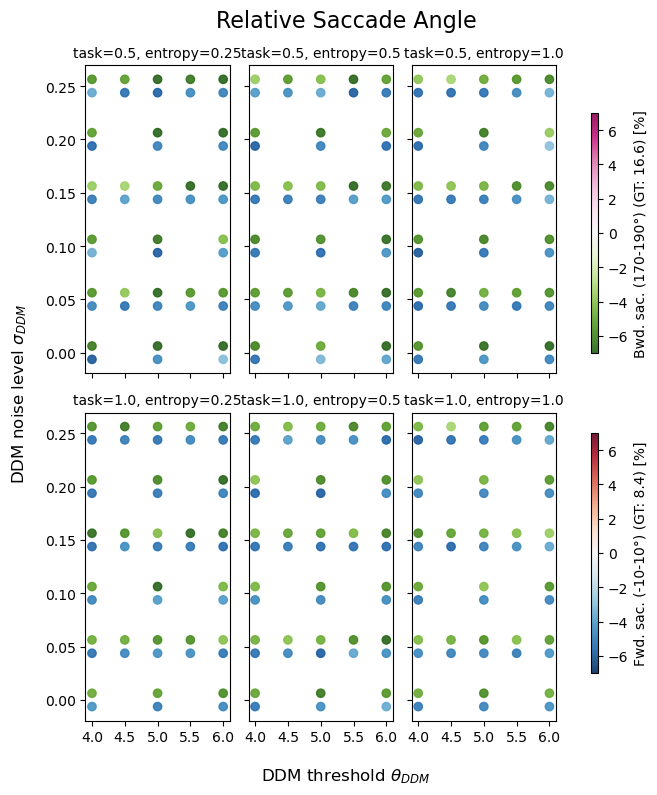

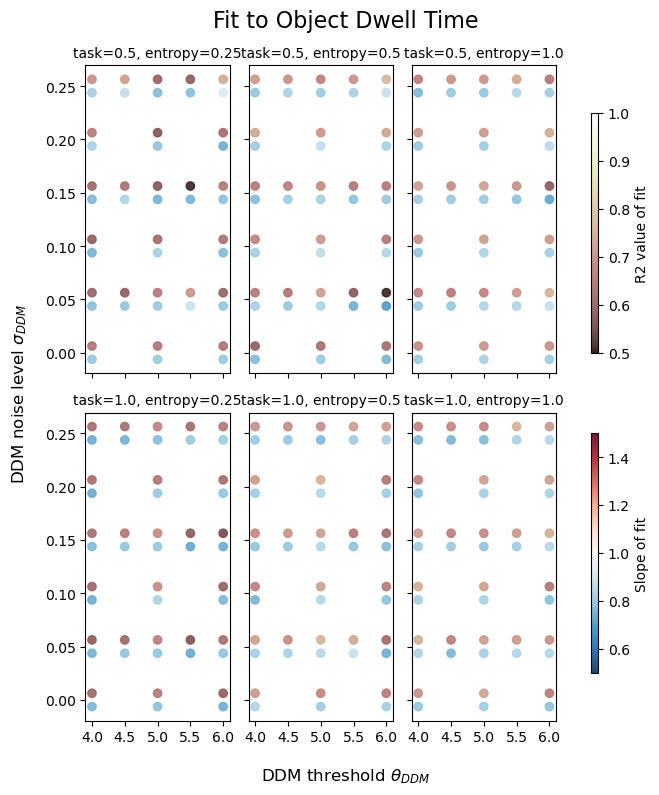

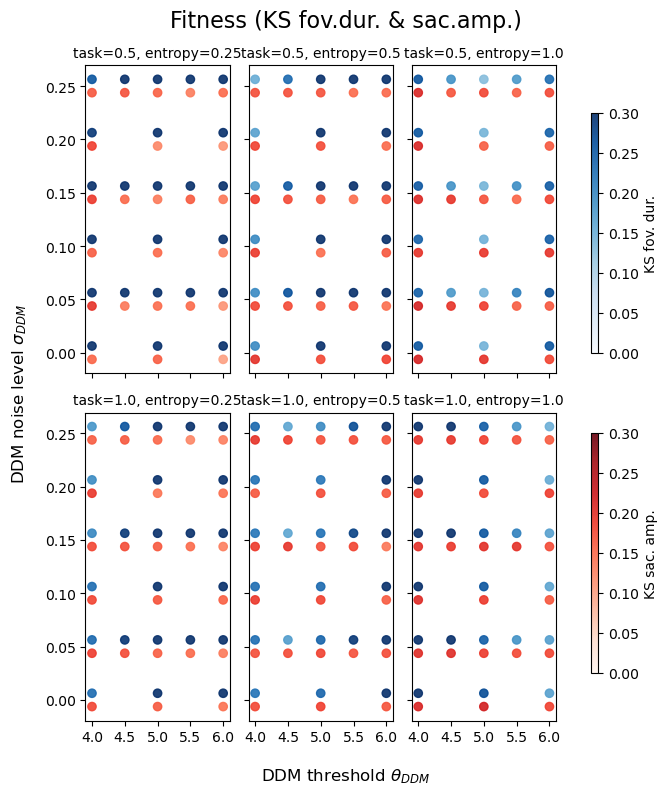

In [13]:
veu.plot_all_4d_grid(df_new_grid, df_train_gt)

In [14]:
df_new_grid.sort_values("fit_fd_sa", ascending=True).head(5)

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,fit_fd_sa,obj_slope,obj_r2
61,"(0.5, 1.0, 5.0, 0.2)",354.233173,325.898167,2.699940,2.198181,0.035367,0.102564,0.161555,0.142076,0.151815,0.817362,0.720152
62,"(0.5, 1.0, 5.0, 0.25)",348.217891,317.555594,2.648950,2.064719,0.030408,0.117289,0.179325,0.129647,0.154486,0.803523,0.707439
143,"(1.0, 1.0, 6.0, 0.25)",343.602478,322.337087,2.699987,2.197915,0.045455,0.103774,0.162750,0.149182,0.155966,0.854447,0.715393
60,"(0.5, 1.0, 5.0, 0.15)",355.241122,325.299641,2.673469,2.128047,0.032801,0.120567,0.170238,0.142614,0.156426,0.810952,0.728891
29,"(0.5, 0.5, 4.0, 0.25)",360.079824,328.533660,2.645619,2.051830,0.043127,0.130279,0.173455,0.152560,0.163008,0.801917,0.720241


In [22]:
param_strs = ["task0.5_entropy1.0_dv5.0_sig0.2", "task1.0_entropy1.0_dv6.0_sig0.1", "task0.5_entropy1.0_dv5.0_sig0.1"]
all_dirs = list(glob.iglob("/scratch/vito/scanpathes/results/*"))
training_runs = []
test_base_runs = []
test_noUncert_runs = []

for identifier in param_strs:
    train_list = [x for x in all_dirs if x.endswith("_cb_base_4d_grid_5seeds_" + identifier)]
    training_runs.append(train_list[0])
    test_list = [x for x in all_dirs if x.endswith("_TEST_" + identifier)]
    test_base_runs.append(test_list[0])
    test_noUncert_list = [x for x in all_dirs if x.endswith("TEST_NO_UNCERT_" + identifier)]
    print(len(test_noUncert_list))
    # if len(test_noUncert_list) > 0:
    #     test_noUncert_runs.append(test_noUncert_list[0])
    # else:
    #     test_noUncert_runs.append(None)
    assert len(train_list) == 1 == len(test_list) == len(test_noUncert_list), "not unique identifier"

1
1
1


In [23]:
df_gt_all = pd.read_csv("/scratch/vito/scanpathes/scanpath_data/df_res_gt_fov_all.csv", index_col=0)

for i, par in enumerate(param_strs):
    df_train_res = pd.read_csv(f"{training_runs[i]}/df_res_fov.csv")
    print("train mean", np.mean(df_train_res["sac_amp_dva"].dropna().values), " median", np.median(df_train_res["sac_amp_dva"].dropna().values))
    df_test_res = pd.read_csv(f"{test_base_runs[i]}/df_res_fov.csv")
    print("test mean", np.mean(df_test_res["sac_amp_dva"].dropna().values), " median", np.median(df_test_res["sac_amp_dva"].dropna().values))
    print(df_test_res.groupby("video")["sac_amp_dva"].mean().sort_values(ascending=False).iloc[:2])
    df_noUncert_res = pd.read_csv(f"{test_noUncert_runs[i]}/df_res_fov.csv")
    
    veu.plot_cdf_fd_sa(df_test_res, df_train_res, df_gt_all, df_noUncert_res, "Test: No Uncertainty")
    plot_object_comparison(df_test_res, df_gt_all, df_noUncert_res, "NoUncert", title=par)


train mean 2.6999395635470496  median 2.198180537525329
test mean 2.7076097416831124  median 2.2151840450763705
video
-UJgyiWe500    4.370972
-DgC31LRuXs    4.218530
Name: sac_amp_dva, dtype: float64


IndexError: list index out of range

In [3]:
runs = veu.check_grid_result_completeness("_cb_base_4d_grid_5seeds_", exclude_dates=["2024-03-12-11"]) # 2024-02-19-16-
print(runs[0])

df_4d = veu.eval_runs_to_dataframe_4d_grid_all(runs, df_train_gt)
df_4d

/scratch/vito/scanpathes/results/2024-03-12-11-39-30_cb_base_4d_grid_5seeds_task1.0_entropy1.0_dv6.0_sig0.2


NameError: name 'df_train_gt' is not defined

In [7]:
veu.plot_all_4d_grid(df_4d, df_train_gt)

AttributeError: module 'visualization_eval_utils' has no attribute 'plot_all_4d_grid'

* large added entropy leads to shorter saccades, suggesting that the uncertainty contribution encourages exploritory behavior --> good!

In [7]:
df_4d.sort_values("fit_fd_sa", ascending=True).head(20)

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,fit_fd_sa,obj_slope,obj_r2
32,"(0.001, 0.25, 2.5, 0.3)",366.316408,309.166782,3.799442,2.739522,0.043318,0.134562,0.055478,0.077911,0.066694,0.586388,0.536642
63,"(0.001, 0.5, 3.0, 0.35)",360.140786,308.801132,3.497227,2.652864,0.042495,0.117541,0.055230,0.078459,0.066845,0.763239,0.746911
134,"(0.05, 0.25, 2.5, 0.3)",351.187593,305.114752,3.634836,2.619400,0.026478,0.105031,0.045359,0.095989,0.070674,0.650266,0.639992
371,"(0.2, 0.25, 3.0, 0.35)",354.900876,309.469351,3.535730,2.661857,0.036542,0.122995,0.060673,0.089914,0.075293,0.727692,0.689292
293,"(0.1, 0.5, 3.5, 0.4)",366.577495,327.468102,3.568213,2.681080,0.034070,0.126151,0.049654,0.101661,0.075657,0.725437,0.702105
101,"(0.05, 0.001, 2.0, 0.25)",371.118280,306.360841,4.057546,3.102165,0.028064,0.134705,0.081851,0.070452,0.076151,0.550164,0.520716
133,"(0.05, 0.25, 2.5, 0.28)",369.490386,318.027457,3.358320,2.403799,0.034291,0.131603,0.088935,0.067979,0.078457,0.729145,0.631292
1,"(0.001, 0.001, 2.0, 0.25)",378.741147,312.853031,4.253845,3.391808,0.026769,0.153920,0.102820,0.054566,0.078693,0.539368,0.531064
216,"(0.1, 0.001, 2.0, 0.25)",348.789191,290.252989,3.961939,2.895720,0.033392,0.129174,0.063048,0.095057,0.079052,0.607666,0.623236
337,"(0.2, 0.001, 2.5, 0.3)",391.121872,329.358065,4.203927,3.256904,0.034551,0.131293,0.077498,0.089992,0.083745,0.603148,0.653639


In [30]:
df_4d.sort_values("obj_r2", ascending=False).head(20)

,"(task, entropy, dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,ks_amp,ks_dur,fit_fd_sa,obj_slope,obj_r2
182,"(0.05, 1.0, 3.5, 0.35)",340.730315,298.748624,2.789775,2.063725,0.028936,0.112340,0.166727,0.115172,0.140950,0.883320,0.799720
262,"(0.1, 1.0, 3.0, 0.2)",288.926617,250.754820,2.522211,1.965491,0.046931,0.122022,0.194279,0.204912,0.199596,0.855148,0.791185
148,"(0.05, 0.5, 3.5, 0.2)",486.910051,412.156558,2.525758,1.902104,0.033088,0.115196,0.215617,0.240278,0.227947,0.919312,0.786233
336,"(0.2, 0.5, 4.0, 0.28)",450.497563,394.672340,2.609718,2.086315,0.039548,0.106215,0.198798,0.239438,0.219118,0.900924,0.782000
171,"(0.05, 1.0, 2.5, 0.4)",210.631506,185.155383,3.820158,2.784532,0.031505,0.127105,0.053306,0.391096,0.222201,0.727222,0.776135
314,"(0.2, 0.5, 2.0, 0.35)",174.418657,155.625014,3.660453,2.716266,0.034341,0.127747,0.033400,0.514807,0.274103,0.668415,0.776106
68,"(0.001, 0.5, 3.5, 0.35)",438.607432,372.460057,3.334208,2.470262,0.037528,0.121413,0.075949,0.183686,0.129818,0.812507,0.773594
66,"(0.001, 0.5, 3.5, 0.25)",501.153929,426.762755,2.625703,1.997641,0.035398,0.101138,0.204332,0.232256,0.218294,0.988668,0.768858
338,"(0.2, 0.5, 4.0, 0.35)",425.867941,375.967723,2.988561,2.325757,0.037393,0.107906,0.149130,0.194763,0.171946,0.897353,0.767125
147,"(0.05, 0.5, 3.0, 0.4)",311.074217,277.703505,4.003089,2.844909,0.044776,0.127258,0.065087,0.157836,0.111462,0.662845,0.765014


# OLD

## Grid without presac

In [ ]:
def plot_fov_dur_grid(df_res, df_gt):
    parcol = df_res.columns[0]
    p1 = parcol.split(",")[0][1:]
    p2 = parcol.split(",")[1][1:-1]
    mean_fd_gt = np.nanmean(df_gt["duration_ms"])
    median_fd_gt = np.nanmedian(df_gt["duration_ms"])

    fig, ax = plt.subplots(figsize=(7, 4))

    p1_values, p2_values = zip(*df_res[parcol])
    p1_values = np.array(p1_values)
    p2_values = np.array(p2_values)

    mean_fd_values = df_res["mean_fd"] - mean_fd_gt
    median_fd_values = df_res["median_fd"] - median_fd_gt

    scatter_median = ax.scatter(p1_values, p2_values + (p2_values.max()-p2_values.min())/70, c=median_fd_values, cmap='PiYG_r', marker='o', vmin=-100, vmax=100, alpha=0.9)
    plt.colorbar(scatter_median, label=f'Median fov.dur. (GT: {round(median_fd_gt, 2)})')
    # if "dv" in parcol:
    #     ax.set_xlabel('DDM threshold')
    # elif "sens" in parcol:
    #     ax.set_xlabel('Sensitivity [dva]')
    ax.set_xlabel(label_dict[p1])
    ax.set_xticks(np.unique(p1_values))
    
        
    # ax.set_ylabel('DDM noise level')
    ax.set_ylabel(label_dict[p2])
    ax.set_yticks(np.unique(p2_values))
    ax.set_title('Grid search: Foveation duration (- GT)')
    scatter_mean = ax.scatter(p1_values, p2_values - (p2_values.max()-p2_values.min())/70, c=mean_fd_values, cmap='RdBu_r', marker='o', vmin=-200, vmax=200, alpha=0.9)
    plt.colorbar(scatter_mean, label=f'Mean fov.dur. (GT: {round(mean_fd_gt, 2)})')
    plt.show()
    
    
def plot_sac_amp_grid(df_res, df_gt): # , par1str, par2str
    # parcol = f"({par1str}, {par2str})"
    parcol = df_res.columns[0]
    p1 = parcol.split(",")[0][1:]
    p2 = parcol.split(",")[1][1:-1]

    mean_sa_gt = np.nanmean(df_gt["sac_amp_dva"])
    median_sa_gt = np.nanmedian(df_gt["sac_amp_dva"])

    fig, ax = plt.subplots(figsize=(7, 4))
    
    mean_sa_values = df_res["mean_sa"] - mean_sa_gt
    median_sa_values = df_res["median_sa"] - median_sa_gt
    
    p1_values, p2_values = zip(*df_res[parcol])
    p1_values = np.array(p1_values)
    p2_values = np.array(p2_values)

    scatter_median = ax.scatter(p1_values, p2_values + (p2_values.max()-p2_values.min())/70, c=median_sa_values, cmap='PiYG_r', marker='o', vmin=-1, vmax=1, alpha=0.9)
    plt.colorbar(scatter_median, label=f'Median sac.amp. (GT: {round(median_sa_gt, 2)})')
    ax.set_xlabel(label_dict[p1])
    ax.set_xticks(np.unique(p1_values))
    ax.set_ylabel(label_dict[p2])
    ax.set_yticks(np.unique(p2_values))
    ax.set_title('Grid search: Saccade amplitude (- GT)')
    scatter_mean = ax.scatter(p1_values, p2_values - (p2_values.max()-p2_values.min())/70, c=mean_sa_values, cmap='RdBu_r', marker='o', vmin=-1, vmax=1, alpha=0.9)
    plt.colorbar(scatter_mean, label=f'Mean sac.amp. (GT: {round(mean_sa_gt, 2)})')
    plt.show()

def plot_prev_ang_grid(df_res, df_gt): # , par1str, par2str
    # parcol = f"({par1str}, {par2str})"
    parcol = df_res.columns[0]
    p1 = parcol.split(",")[0][1:]
    p2 = parcol.split(",")[1][1:-1]

    prev_ang_gt = df_gt["sac_ang_p"].dropna().values
    prev_ang_gt_fwd = np.sum(np.abs(prev_ang_gt)<10) / len(prev_ang_gt)
    prev_ang_gt_bwd = np.sum(np.abs(prev_ang_gt)>170) / len(prev_ang_gt)

    fig, ax = plt.subplots(figsize=(7, 4))
    
    fwd_sac_values = (df_res["fwd_sac"] - prev_ang_gt_fwd) * 100
    bwd_sac_values = (df_res["bwd_sac"] - prev_ang_gt_bwd) * 100
    
    p1_values, p2_values = zip(*df_res[parcol])
    p1_values = np.array(p1_values)
    p2_values = np.array(p2_values)

    scatter_fwd = ax.scatter(p1_values, p2_values + (p2_values.max()-p2_values.min())/70, c=fwd_sac_values, cmap='PiYG_r', marker='o', vmin=-7, vmax=7, alpha=0.9)
    plt.colorbar(scatter_fwd, label=f'Forward saccades (-10-10°) [%] (GT: {round(prev_ang_gt_fwd*100, 1)})')
    ax.set_xlabel(label_dict[p1])
    ax.set_xticks(np.unique(p1_values))
    ax.set_ylabel(label_dict[p2])
    ax.set_yticks(np.unique(p2_values))
    ax.set_title('Grid search: Previous saccade angle (- GT)')
    scatter_bwd = ax.scatter(p1_values, p2_values - (p2_values.max()-p2_values.min())/70, c=bwd_sac_values, cmap='RdBu_r', marker='o', vmin=-7, vmax=7, alpha=0.9)
    plt.colorbar(scatter_bwd, label=f'Backward saccades (170-190°) [%] (GT: {round(prev_ang_gt_bwd*100, 1)})')
    plt.show()

def plot_obj_fit_grid(df_res): # , par1str, par2str
    # parcol = f"({par1str}, {par2str})"
    parcol = df_res.columns[0]
    p1 = parcol.split(",")[0][1:]
    p2 = parcol.split(",")[1][1:-1]
    fig, ax = plt.subplots(figsize=(7, 4))    
    p1_values, p2_values = zip(*df_res[parcol])
    p1_values = np.array(p1_values)
    p2_values = np.array(p2_values)

    scatter_fwd = ax.scatter(p1_values, p2_values + (p2_values.max()-p2_values.min())/70, c=df_res["obj_r2"], cmap='pink', marker='o', vmin=0.5, vmax=1, alpha=0.9)
    plt.colorbar(scatter_fwd, label=f'R2 value of fit')
    ax.set_xlabel(label_dict[p1])
    ax.set_xticks(np.unique(p1_values))
    ax.set_ylabel(label_dict[p2])
    ax.set_yticks(np.unique(p2_values))
    ax.set_title('Grid search: Object fit')
    scatter_bwd = ax.scatter(p1_values, p2_values - (p2_values.max()-p2_values.min())/70, c=df_res["obj_slope"], cmap='RdBu_r', marker='o', vmin=0.5, vmax=1.5, alpha=0.9)
    plt.colorbar(scatter_bwd, label=f'Slope of fit')
    plt.show()

def plot_all_4indiv_grids(df_res, df_gt):
    plot_fov_dur_grid(df_res, df_gt)
    plot_sac_amp_grid(df_res, df_gt)
    plot_prev_ang_grid(df_res, df_gt)
    plot_obj_fit_grid(df_res)

In [20]:
runs = check_grid_result_completeness("2024-02-19-")
len(runs)

81

In [17]:
runs = check_grid_result_completeness("cb_base__nopresac", nseeds=10)
# runs = [dir for dir in os.listdir("/scratch/vito/scanpathes/results/") if "cb_base__nopresac" in dir]
print(runs[0])

df_nopresac = eval_runs_to_dataframe_grid_all(runs, df_gt, "dv", "sig")
df_nopresac

WARNING! Only 97/100 result files in /scratch/vito/scanpathes/results/2024-01-01-20-21-47_cb_base__nopresac_dv2.0_sig0.05
/scratch/vito/scanpathes/results/2024-01-01-20-24-56_cb_base__nopresac_dv4.0_sig0.35


,"(dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,obj_slope,obj_r2
0,"(2.0, 0.0)",302.740771,238.693090,2.460638,1.909945,0.027946,0.123112,0.811146,0.690417
1,"(2.0, 0.05)",306.619672,232.276683,2.495250,1.933617,0.028797,0.125049,0.807500,0.655079
2,"(2.0, 0.1)",298.607458,232.032414,2.498285,1.939981,0.035781,0.130078,0.794342,0.683460
3,"(2.0, 0.15)",290.164904,228.280842,2.584691,1.976642,0.029017,0.137468,0.772425,0.637563
4,"(2.0, 0.2)",280.062273,219.281781,2.910400,2.157297,0.031986,0.126538,0.749689,0.679549
...,...,...,...,...,...,...,...,...,...
163,"(4.0, 0.15)",664.846055,512.842631,3.085253,2.351162,0.053448,0.109483,0.773708,0.632395
164,"(4.0, 0.2)",644.117613,508.075035,3.226831,2.406320,0.039967,0.113239,0.743324,0.654550
165,"(4.0, 0.25)",631.067695,492.319501,3.335006,2.474502,0.030945,0.109935,0.760980,0.661558
166,"(4.0, 0.3)",578.032859,469.210755,3.513465,2.534864,0.036269,0.124352,0.714877,0.606208


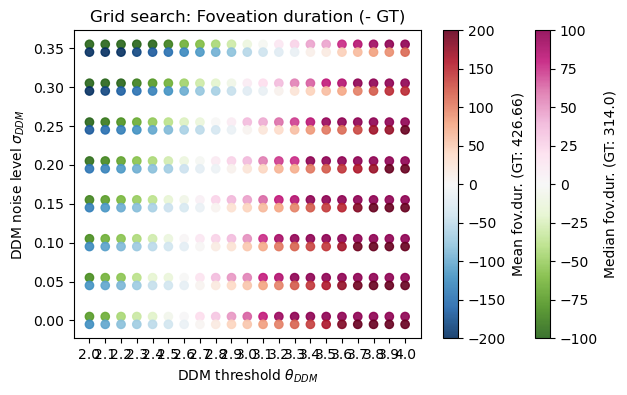

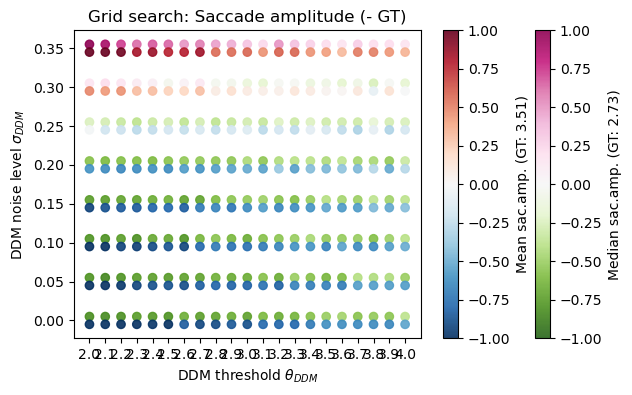

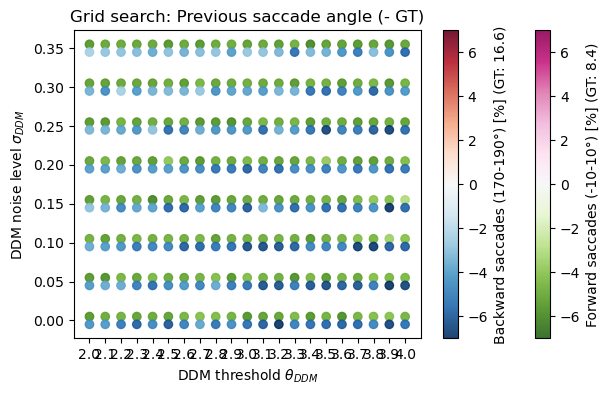

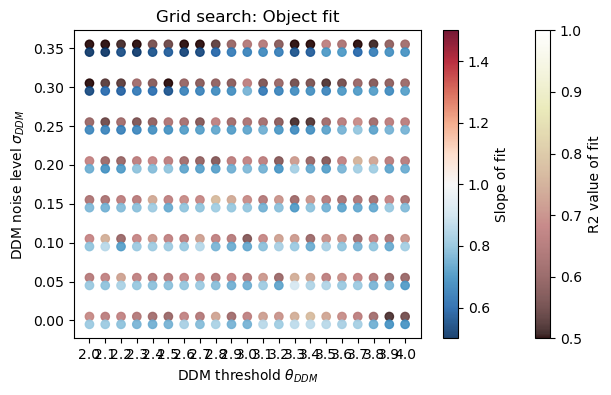

In [20]:
plot_fov_dur_grid(df_nopresac, df_gt)
plot_sac_amp_grid(df_nopresac, df_gt)
plot_prev_ang_grid(df_nopresac, df_gt)
plot_obj_fit_grid(df_nopresac)

['config_7', 'config_0', 'config_6', 'config_4', 'config_2', 'config_5', 'fov_dur_sac_amp_hists_cb_base__nopresac_dv2.6_sig0.05.png', 'obj_eval_cb_base__nopresac_dv2.6_sig0.05.png', 'sac_ang_hists_cb_base__nopresac_dv2.6_sig0.05.png', 'config_3', 'ior_stats_cb_base__nopresac_dv2.6_sig0.05.png', 'config_9', 'config_1', 'df_res_fov.csv', 'config_8']
2024-01-01-20-22-42_cb_base__nopresac_dv2.6_sig0.05


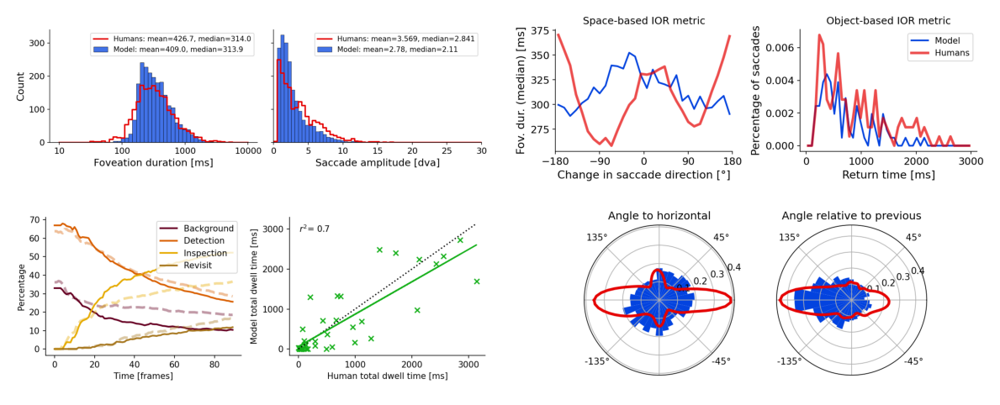

['sac_ang_hists_cb_base__nopresac_dv2.7_sig0.1.png', 'config_7', 'config_0', 'config_6', 'config_4', 'config_2', 'config_5', 'fov_dur_sac_amp_hists_cb_base__nopresac_dv2.7_sig0.1.png', 'config_3', 'config_9', 'ior_stats_cb_base__nopresac_dv2.7_sig0.1.png', 'config_1', 'obj_eval_cb_base__nopresac_dv2.7_sig0.1.png', 'df_res_fov.csv', 'config_8']
2024-01-01-20-22-52_cb_base__nopresac_dv2.7_sig0.1


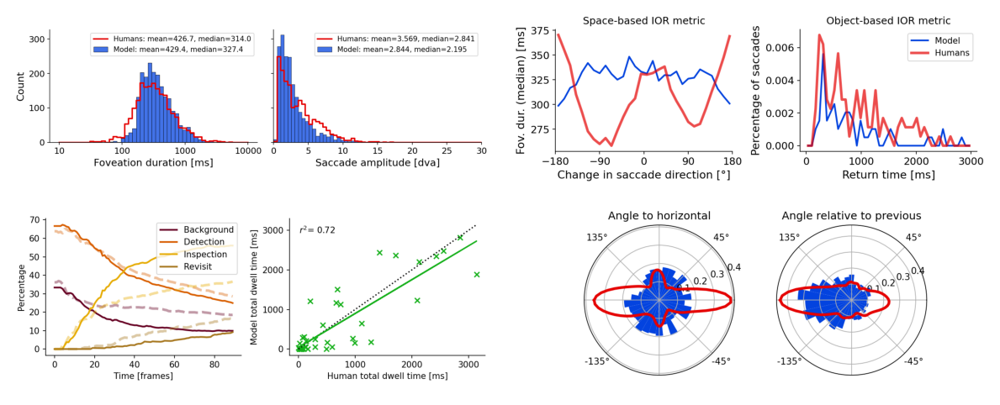

['config_7', 'config_0', 'config_6', 'fov_dur_sac_amp_hists_cb_base__nopresac_dv2.7_sig0.15.png', 'config_4', 'config_2', 'config_5', 'obj_eval_cb_base__nopresac_dv2.7_sig0.15.png', 'sac_ang_hists_cb_base__nopresac_dv2.7_sig0.15.png', 'ior_stats_cb_base__nopresac_dv2.7_sig0.15.png', 'config_3', 'config_9', 'config_1', 'df_res_fov.csv', 'config_8']
2024-01-01-20-22-53_cb_base__nopresac_dv2.7_sig0.15


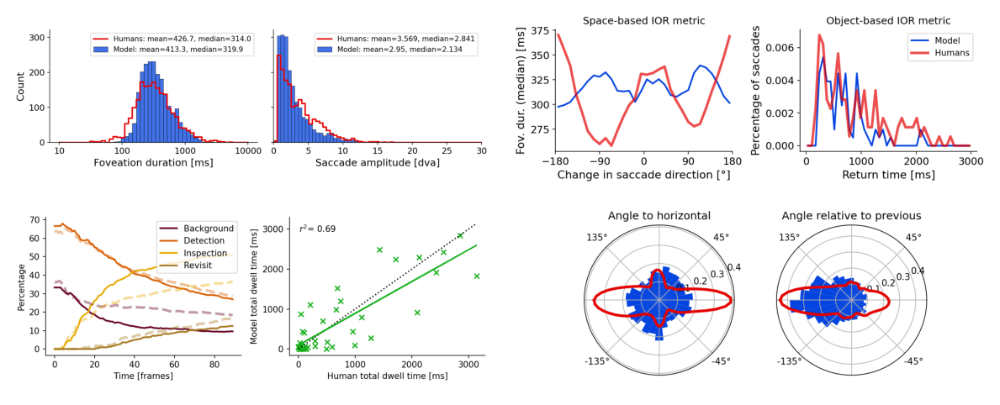

['config_7', 'fov_dur_sac_amp_hists_cb_base__nopresac_dv2.8_sig0.2.png', 'config_0', 'config_6', 'sac_ang_hists_cb_base__nopresac_dv2.8_sig0.2.png', 'config_4', 'config_2', 'config_5', 'ior_stats_cb_base__nopresac_dv2.8_sig0.2.png', 'config_3', 'config_9', 'config_1', 'obj_eval_cb_base__nopresac_dv2.8_sig0.2.png', 'df_res_fov.csv', 'config_8']
2024-01-01-20-23-03_cb_base__nopresac_dv2.8_sig0.2


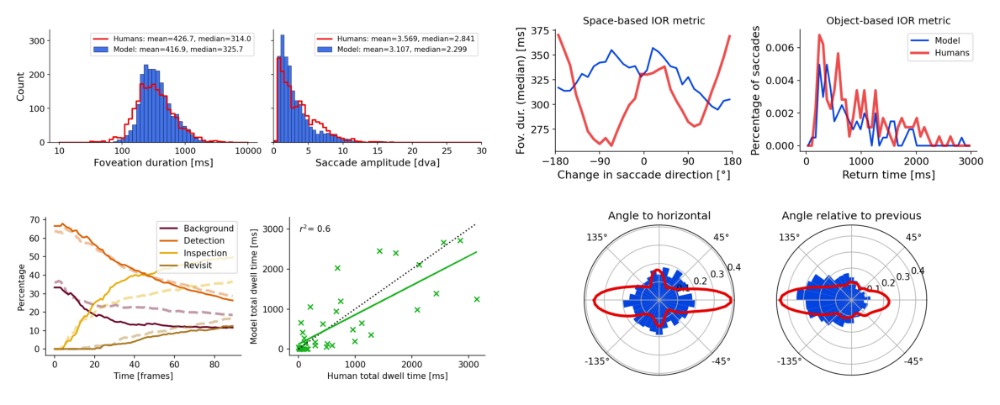

['config_7', 'config_0', 'config_6', 'sac_ang_hists_cb_base__nopresac_dv2.9_sig0.25.png', 'config_4', 'config_2', 'config_5', 'fov_dur_sac_amp_hists_cb_base__nopresac_dv2.9_sig0.25.png', 'config_3', 'obj_eval_cb_base__nopresac_dv2.9_sig0.25.png', 'config_9', 'ior_stats_cb_base__nopresac_dv2.9_sig0.25.png', 'config_1', 'df_res_fov.csv', 'config_8']
2024-01-01-20-23-13_cb_base__nopresac_dv2.9_sig0.25


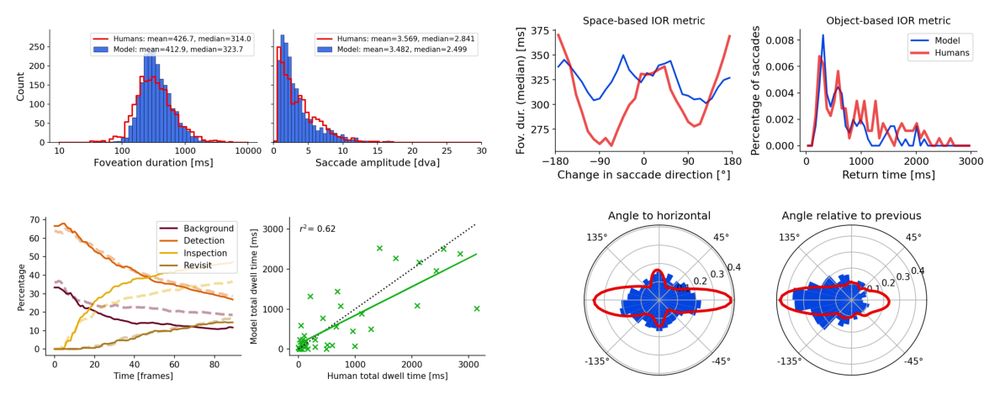

['config_7', 'config_0', 'config_6', 'ior_stats_cb_base__nopresac_dv3.0_sig0.3.png', 'config_4', 'config_2', 'config_5', 'sac_ang_hists_cb_base__nopresac_dv3.0_sig0.3.png', 'fov_dur_sac_amp_hists_cb_base__nopresac_dv3.0_sig0.3.png', 'obj_eval_cb_base__nopresac_dv3.0_sig0.3.png', 'config_3', 'config_9', 'config_1', 'df_res_fov.csv', 'config_8']
2024-01-01-20-23-24_cb_base__nopresac_dv3.0_sig0.3


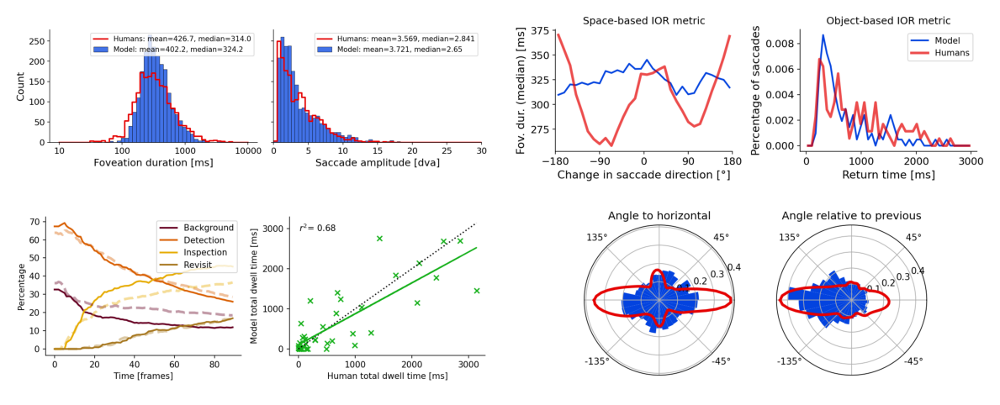

['config_7', 'config_0', 'config_6', 'config_4', 'config_2', 'config_5', 'ior_stats_cb_base__nopresac_dv3.2_sig0.35.png', 'fov_dur_sac_amp_hists_cb_base__nopresac_dv3.2_sig0.35.png', 'sac_ang_hists_cb_base__nopresac_dv3.2_sig0.35.png', 'config_3', 'config_9', 'config_1', 'df_res_fov.csv', 'config_8', 'obj_eval_cb_base__nopresac_dv3.2_sig0.35.png']
2024-01-01-20-23-43_cb_base__nopresac_dv3.2_sig0.35


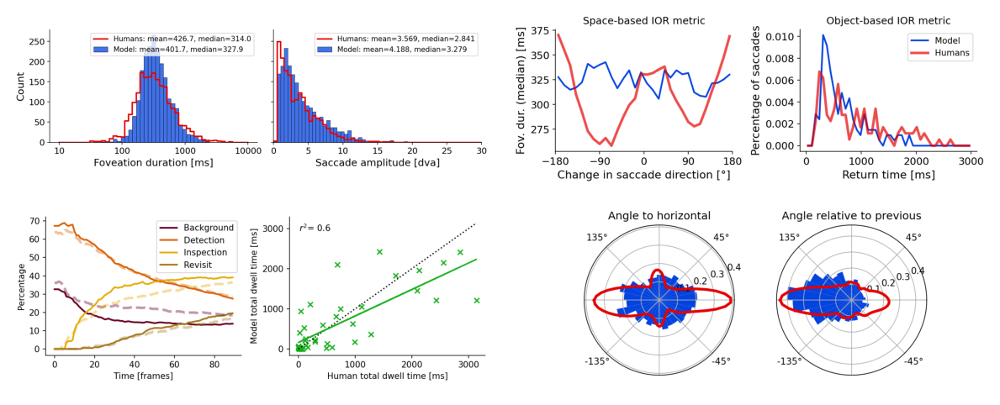

In [6]:
dvs = [2.6, 2.7, 2.7, 2.8, 2.9, 3.0, 3.2]
sigs = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35]

for i in range(len(dvs)):
    run = [dir for dir in os.listdir("/scratch/vito/scanpathes/results/") if dir.endswith(f"cb_base__nopresac_dv{dvs[i]}_sig{sigs[i]}")][0]
    print(os.listdir("/scratch/vito/scanpathes/results/" + run))
    # obj_png = [f for f in os.listdir("/scratch/vito/scanpathes/results/" + run) if f.startswith("obj_eval")][0]
    pngs = sorted([f for f in os.listdir("/scratch/vito/scanpathes/results/" + run) if f.endswith(".png")])
    
    print(run)
    fig, axs = plt.subplots(2,2, figsize=(12,5))
    # objpng = plt.imread(os.path.join("/scratch/vito/scanpathes/results/", run, obj_png))
    
    # axs[0].imshow(objpng)
    for i, ax in enumerate(axs.flat):
        img = plt.imread(os.path.join("/scratch/vito/scanpathes/results/", run, pngs[i]))
        ax.imshow(img)
        ax.set_axis_off()
    plt.tight_layout()
    plt.show()


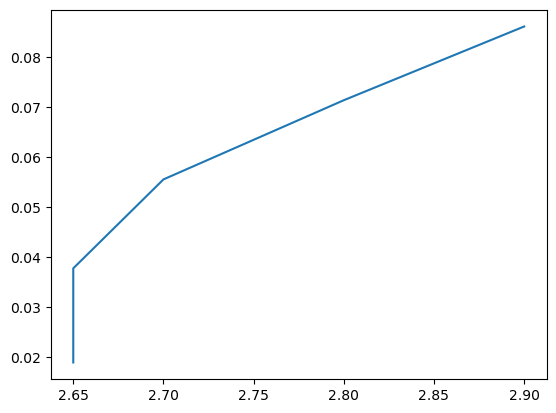

In [6]:
plt.plot(np.array([2.65, 2.65, 2.7, 2.8, 2.9]), np.array([0.05, 0.1, 0.15, 0.2, 0.25]) / np.array([2.65, 2.65, 2.7, 2.8, 2.9]))

## Vary size of the visual sensitivity

Number of runs: 63 
e.g.: /scratch/vito/scanpathes/results/2024-02-06-15-41-10_cb_base_nopresac_amp_dv3_5seeds_sens20.0_sig0.45


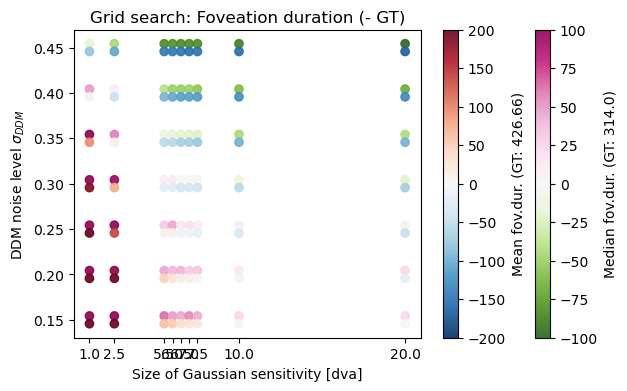

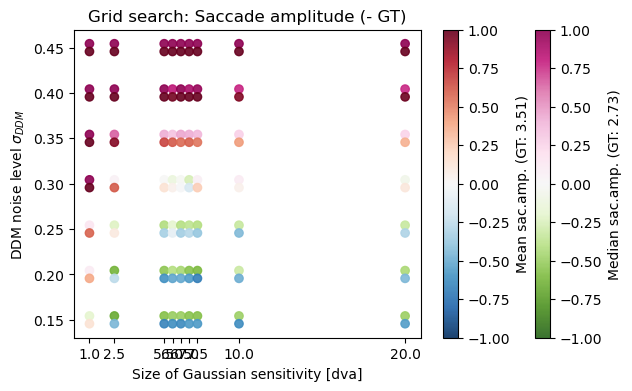

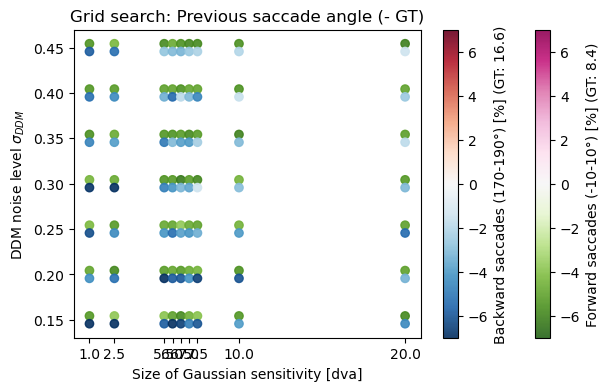

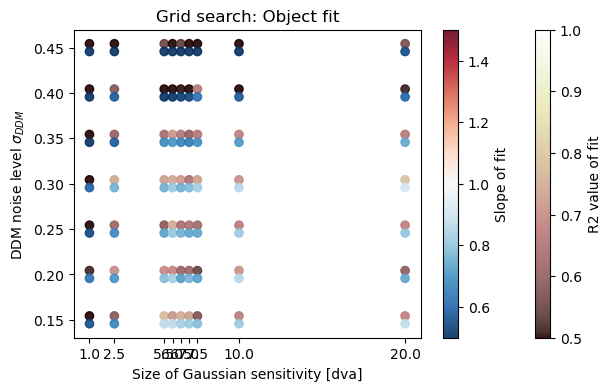

,"(sens, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,obj_slope,obj_r2
0,"(1.0, 0.15)",1133.328810,811.690238,3.655677,2.530362,0.029412,0.071895,0.553007,0.275952
1,"(1.0, 0.2)",891.312457,743.912506,3.892380,2.839003,0.033981,0.123786,0.627014,0.513891
2,"(1.0, 0.25)",744.756242,647.230645,4.106955,2.872340,0.041339,0.104331,0.541834,0.489319
3,"(1.0, 0.3)",609.594415,529.895320,5.038570,4.230030,0.039494,0.097946,0.586733,0.480257
4,"(1.0, 0.35)",521.717958,452.643789,5.915052,5.244033,0.026846,0.119463,0.482709,0.464824
...,...,...,...,...,...,...,...,...,...
58,"(20.0, 0.25)",378.584445,306.498754,3.205476,2.394316,0.032258,0.111954,0.799617,0.677611
59,"(20.0, 0.3)",357.544366,292.785431,3.625049,2.665994,0.029650,0.134771,0.909555,0.785861
60,"(20.0, 0.35)",330.223935,271.199020,3.871071,2.980622,0.031614,0.148087,0.741154,0.663381
61,"(20.0, 0.4)",295.572948,246.365674,4.498813,3.495890,0.033033,0.140390,0.595392,0.510113


In [21]:
runs = check_grid_result_completeness("_nopresac_amp_dv3_5seeds_")
print("Number of runs:",len(runs), "\ne.g.:", runs[0])

df_nopresac_amp = eval_runs_to_dataframe_grid_all(runs, df_gt, "sens", "sig")
plot_fov_dur_grid(df_nopresac_amp, df_gt)
plot_sac_amp_grid(df_nopresac_amp, df_gt)
plot_prev_ang_grid(df_nopresac_amp, df_gt)
plot_obj_fit_grid(df_nopresac_amp)
df_nopresac_amp

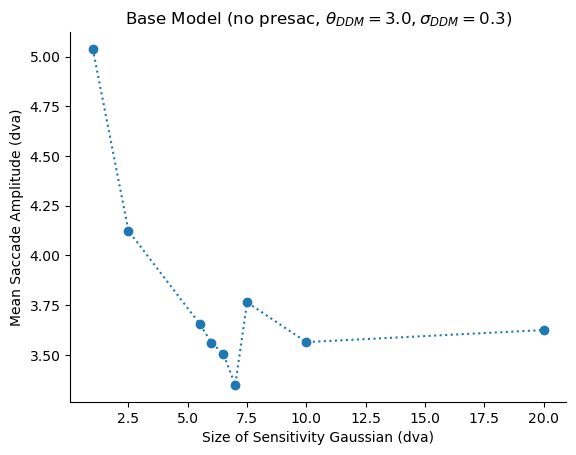

In [22]:
df_nopresac_sig03 = df_nopresac_amp[df_nopresac_amp["(sens, sig)"].str[1] == 0.3]
plt.plot(df_nopresac_sig03["(sens, sig)"].str[0], df_nopresac_sig03.mean_sa, "o:")
plt.xlabel("Size of Sensitivity Gaussian (dva)")
plt.ylabel("Mean Saccade Amplitude (dva)")
plt.title(r"Base Model (no presac, $\theta_{DDM}=3.0, \sigma_{DDM}=0.3$)")
sns.despine()

Number of runs: 49 
e.g.: /scratch/vito/scanpathes/results/2024-02-08-17-38-17_cb_base_nopresac_added_uncert_sal_5seeds_task0.75_entropy0.75


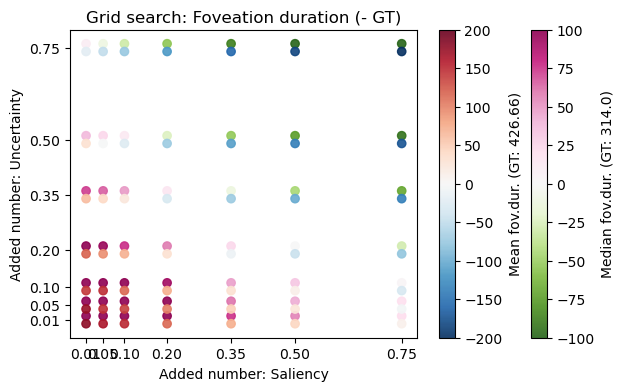

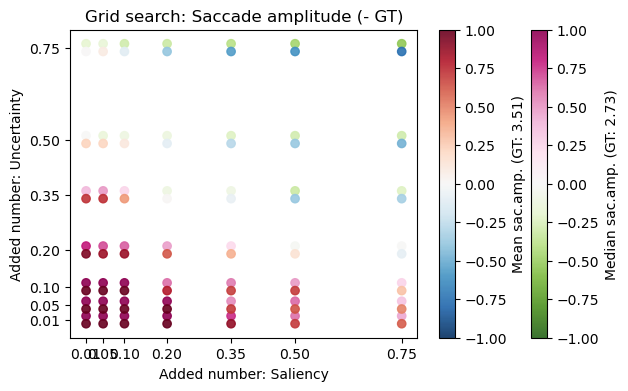

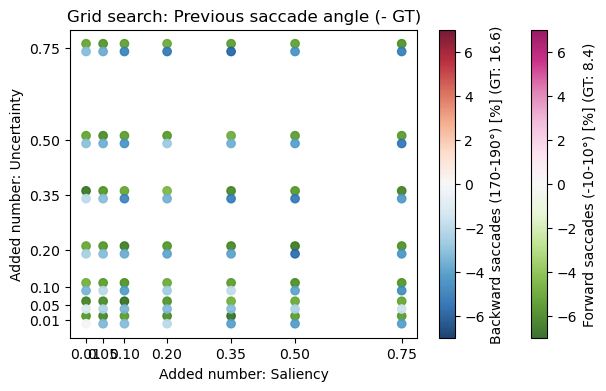

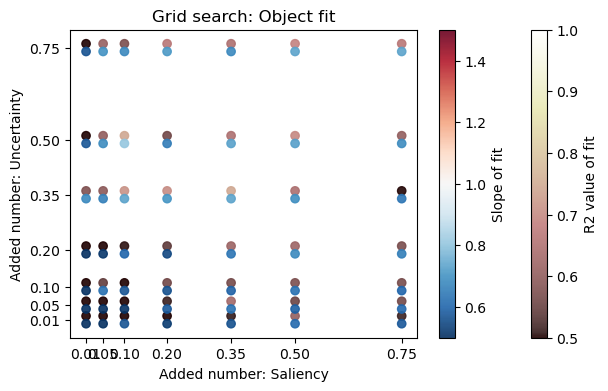

,"(task, entropy)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,obj_slope,obj_r2
0,"(0.01, 0.01)",605.711692,467.866182,5.187782,4.400943,0.028257,0.164835,0.416039,0.327565
1,"(0.01, 0.05)",598.945123,474.938910,5.134142,4.256308,0.021705,0.155039,0.426260,0.363319
2,"(0.01, 0.1)",568.799358,445.089651,5.158994,4.291174,0.036657,0.133431,0.500865,0.399823
3,"(0.01, 0.2)",545.369759,423.870731,4.445223,3.537106,0.033520,0.142458,0.492568,0.366065
4,"(0.01, 0.35)",488.818844,386.541641,4.239671,3.110346,0.017391,0.147826,0.677321,0.574958
5,"(0.01, 0.5)",457.567014,352.189828,3.738581,2.723385,0.032370,0.136416,0.571303,0.444698
6,"(0.01, 0.75)",405.479778,323.178195,3.519306,2.536032,0.032620,0.135576,0.564023,0.411116
7,"(0.05, 0.01)",590.607555,476.566017,5.100935,4.244849,0.022901,0.134351,0.387397,0.279925
8,"(0.05, 0.05)",572.477706,449.358787,4.935734,3.890053,0.023599,0.144543,0.460034,0.346830
9,"(0.05, 0.1)",574.704388,453.442804,4.987194,4.061568,0.029630,0.146667,0.621476,0.543289


In [23]:
runs = check_grid_result_completeness("_nopresac_added_uncert_sal_5seeds_")
print("Number of runs:",len(runs), "\ne.g.:", runs[0])

df_uncert_sal = eval_runs_to_dataframe_grid_all(runs, df_gt, "task", "entropy")
plot_fov_dur_grid(df_uncert_sal, df_gt)
plot_sac_amp_grid(df_uncert_sal, df_gt)
plot_prev_ang_grid(df_uncert_sal, df_gt)
plot_obj_fit_grid(df_uncert_sal)
df_uncert_sal

Ground truth saccades forward: 8.4%, backwards: 16.6%


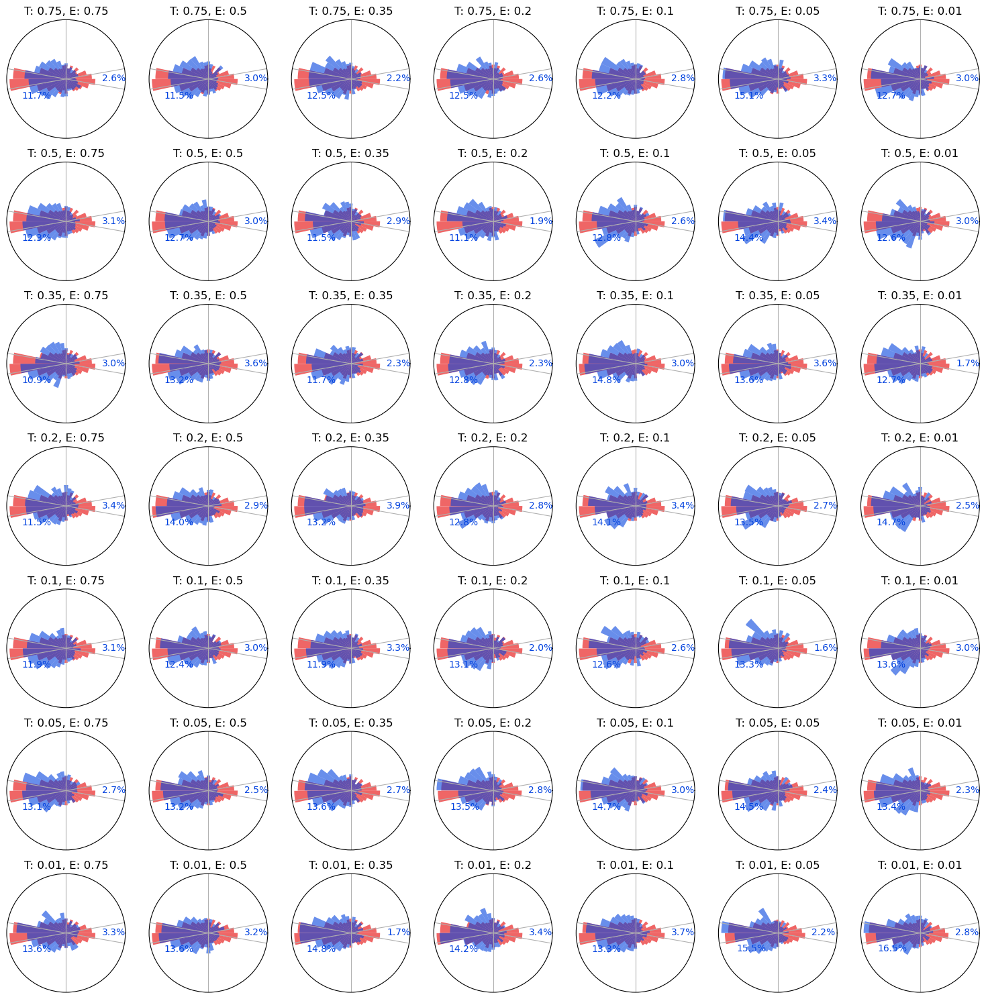

In [24]:
runs = check_grid_result_completeness("_nopresac_added_uncert_sal_5seeds_")

par1str = "task"
par2str = "entropy"
fig, axs = plt.subplots(7, 7, subplot_kw={'projection': 'polar'}, figsize=(15,15))
prev_ang_gt = df_gt["sac_ang_p"].dropna().values
ang_bins = 30
prev_ang_gt_fwd = np.sum(np.abs(prev_ang_gt)<10) / len(prev_ang_gt)
prev_ang_gt_bwd = np.sum(np.abs(prev_ang_gt)>170) / len(prev_ang_gt)
print(f"Ground truth saccades forward: {round(100* prev_ang_gt_fwd,1)}%, backwards: {round(100* prev_ang_gt_bwd,1)}%")
for i, ax in enumerate(axs.flat):
    run = runs[i]
    par1 = float(run.split("_")[-2][len(par1str):])
    par2 = float(run.split("_")[-1][len(par2str):])

    df_eval = pd.read_csv(f"{run}/df_res_fov.csv", index_col=0)
    prev_ang = df_eval["sac_ang_p"].dropna().values
    prev_ang_fwd = np.sum(np.abs(prev_ang)<10) / len(prev_ang)
    prev_ang_bwd = np.sum(np.abs(prev_ang)>170) / len(prev_ang)
    ax.hist(prev_ang_gt / 180 * np.pi, ang_bins, density=True, color="xkcd:red", alpha=0.6)
    ax.hist(prev_ang / 180 * np.pi, ang_bins, density=True, color="xkcd:blue", alpha=0.6)
    ax.set_title(f"T: {par1}, E: {par2}")
    ax.text(-0.05, 0.3, f"{np.round(100*prev_ang_fwd,1)}%", color="xkcd:blue")
    ax.text(np.pi+0.4, 0.4, f"{np.round(100*prev_ang_bwd,1)}%", color="xkcd:blue")
    ax.set_xticks([10/180*np.pi, np.pi/2, 170/180*np.pi, 190/180*np.pi, 3/2*np.pi, 350/180*np.pi])
    ax.set_xticklabels([])
    ax.set_yticks([])
plt.tight_layout()
plt.show()

slope: 0.416038586899129, intercept: 345.47482071676353, r_value: 0.572333029863933, p_value: 7.48793747320082e-05, std_err: 0.09424969002373323, r2 : 0.3275650970732296


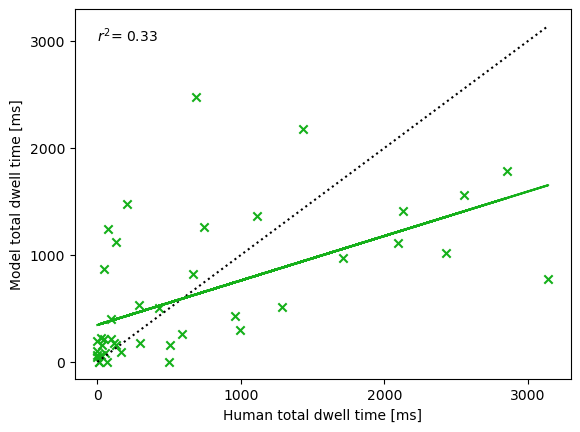

In [25]:
fig, ax = plt.subplots()
df_gt_obj = evaluate_all_obj(df_gt, prefix="gt_")
df_eval = pd.read_csv(f"{run}/df_res_fov.csv", index_col=0)
df_obj = evaluate_all_obj(df_eval, prefix="sim_")


merged_df = pd.merge(df_gt_obj, df_obj, how="outer", on=['video', 'gt_object'])
merged_df = merged_df[merged_df.gt_object != "nan"]
merged_df = merged_df.fillna(0)
ax.scatter(merged_df['gt_tot_t'], merged_df['sim_tot_t'], marker='x', c="xkcd:green")
ax.plot([0, merged_df['gt_tot_t'].max()], [0, merged_df['gt_tot_t'].max()], ls=":", color="k")
slope, intercept, r_value, p_value, std_err = stats.linregress(merged_df['gt_tot_t'], merged_df['sim_tot_t'])
print(f"slope: {slope}, intercept: {intercept}, r_value: {r_value}, p_value: {p_value}, std_err: {std_err}, r2 : {r_value ** 2}")
ax.text(0, 3000, r"$r^2$" + f"= {np.round(r_value ** 2, 2)}")#, transform=ax.transAxes, fontsize=10,verticalalignment='top')
ax.plot(merged_df['gt_tot_t'], intercept + slope * merged_df['gt_tot_t'], c="xkcd:green")


ax.set_ylabel("Model total dwell time [ms]")  # \n(mean for objects across runs)
ax.set_xlabel("Human total dwell time [ms]")  # (mean for each object across subjects)
ax.set_xticks([0, 1000, 2000, 3000])
ax.set_yticks([0, 1000, 2000, 3000])



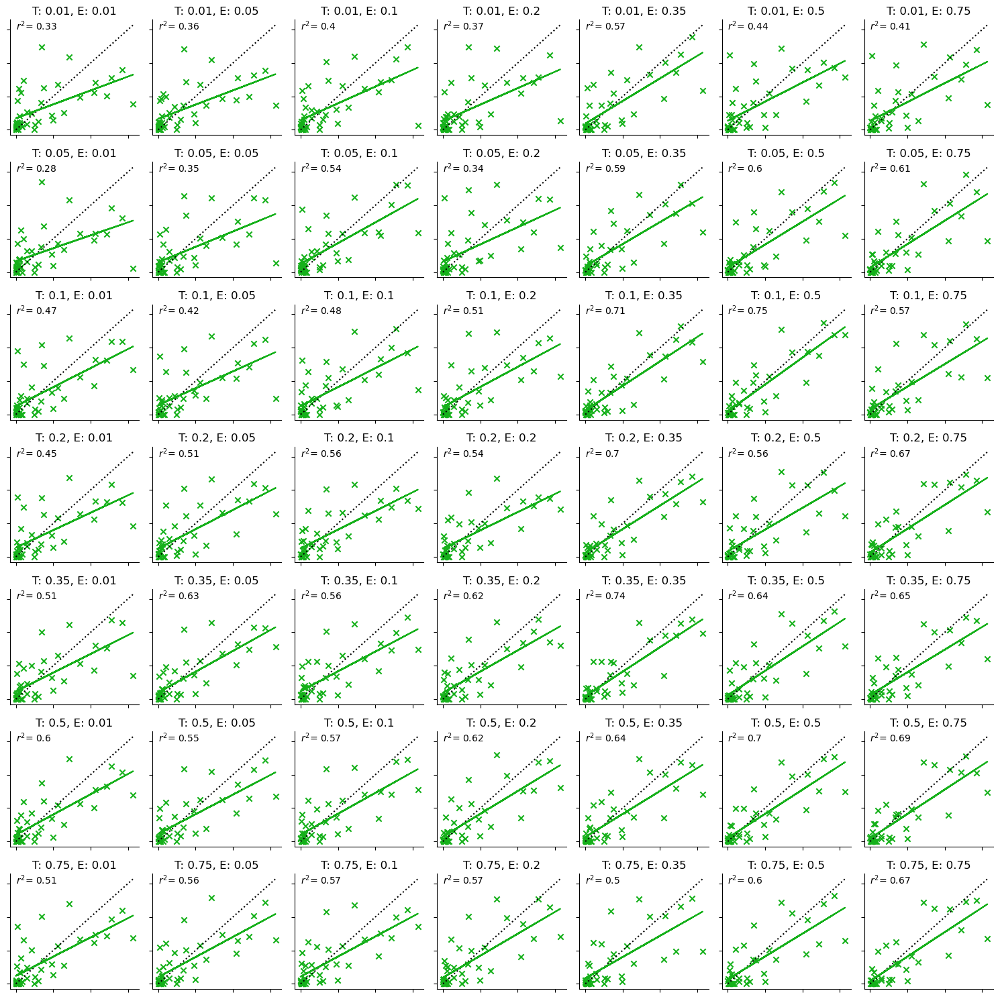

In [26]:
runs = sorted([dir for dir in os.listdir("/scratch/vito/scanpathes/results/") if "_nopresac_added_uncert_sal_5seeds_" in dir])

par1str = "task"
par2str = "entropy"
fig, axs = plt.subplots(7, 7, figsize=(15,15))
df_gt_obj = evaluate_all_obj(df_gt, prefix="gt_")
p1_values = []
p2_values = []
r2_values = []
for i, ax in enumerate(axs.flat):
    run = runs[i]
    par1 = float(run.split("_")[-2][len(par1str):]) # task
    par2 = float(run.split("_")[-1][len(par2str):]) # entropy
    p1_values.append(par1)
    p2_values.append(par2)

    df_eval = pd.read_csv(f"/scratch/vito/scanpathes/results/{run}/df_res_fov.csv", index_col=0)
    df_obj = evaluate_all_obj(df_eval, prefix="sim_")
    merged_df = pd.merge(df_gt_obj, df_obj, how="outer", on=['video', 'gt_object'])
    merged_df = merged_df[merged_df.gt_object != "nan"]
    merged_df = merged_df.fillna(0)
    ax.scatter(merged_df['gt_tot_t'], merged_df['sim_tot_t'], marker='x', c="xkcd:green")
    ax.plot([0, merged_df['gt_tot_t'].max()], [0, merged_df['gt_tot_t'].max()], ls=":", color="k")
    slope, intercept, r_value, p_value, std_err = stats.linregress(merged_df['gt_tot_t'], merged_df['sim_tot_t'])
    r2 = r_value ** 2
    r2_values.append(r2)
    ax.set_title(f"T: {par1}, E: {par2}")
    # print(f"{run}: slope: {slope}, intercept: {intercept}, r_value: {r_value}, p_value: {p_value}, std_err: {std_err}, r2 : {r_value ** 2}")
    ax.text(0, 3000, r"$r^2$" + f"= {np.round(r2, 2)}")#, transform=ax.transAxes, fontsize=10,verticalalignment='top')
    ax.set_xticklabels([])
    ax.set_yticklabels([])

    ax.plot(merged_df['gt_tot_t'], intercept + slope * merged_df['gt_tot_t'], c="xkcd:green")

fig.tight_layout()
sns.despine(fig)
fig.show()



Text(0.5, 1.0, 'Grid search: Saccade amplitude (- GT)')

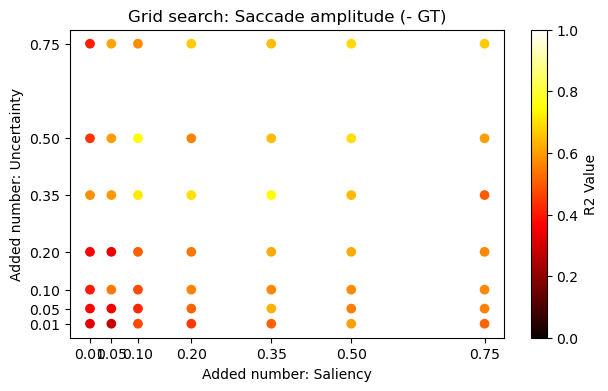

In [27]:
fig2, ax = plt.subplots(figsize=(7, 4))
r2_plot = ax.scatter(p1_values, p2_values, c=r2_values, cmap='hot', marker='o', vmin=0, vmax=1, alpha=1)
plt.colorbar(r2_plot, label='R2 Value')
ax.set_xlabel(label_dict[par1str])
ax.set_xticks(np.unique(p1_values))
ax.set_ylabel(label_dict[par2str])
ax.set_yticks(np.unique(p2_values))
ax.set_title('Grid search: Saccade amplitude (- GT)')


In [31]:
df_uncert_sal["(task, entropy)"].str[0].unique()

array([0.01, 0.05, 0.1 , 0.2 , 0.35, 0.5 , 0.75])

# Alternative Models (added components)

## Presaccadic attention
### Grid with 0.8 presac threshold and 0.8 sensitivity 

Number of runs: 49 
e.g.: 2024-02-02-10-45-35_cb_base_presac0.8_sens0.8_5seeds_dv3.6_sig0.4


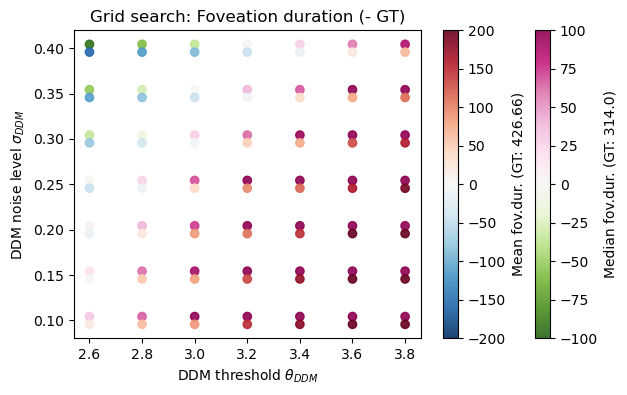

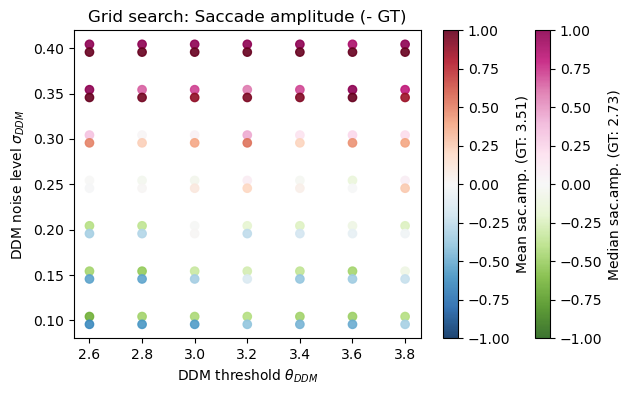

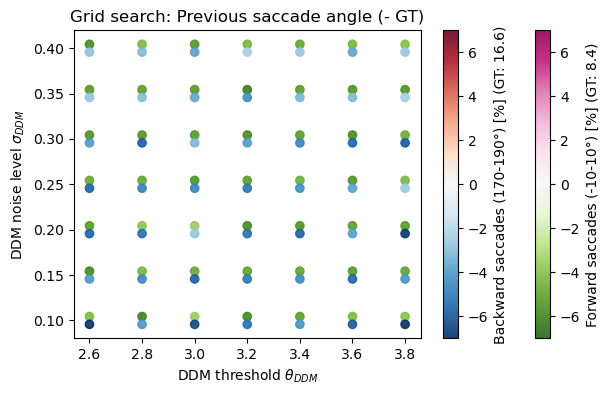

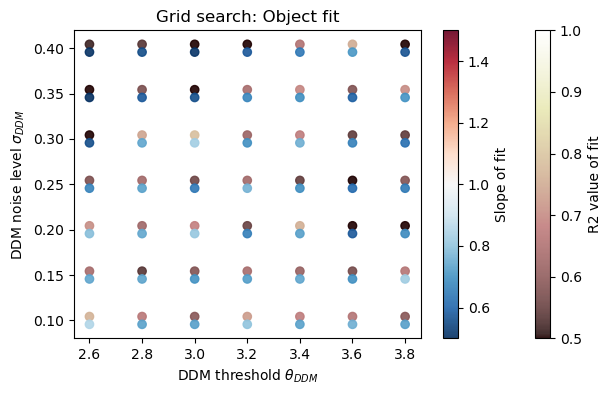

,"(dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,obj_slope,obj_r2
0,"(2.6, 0.1)",446.901332,345.147132,2.877598,2.073630,0.040404,0.095398,0.849101,0.762680
1,"(2.6, 0.15)",424.129302,333.776372,2.981242,2.267771,0.024468,0.125532,0.735258,0.631538
2,"(2.6, 0.2)",412.922473,320.487674,3.184054,2.327220,0.030052,0.108808,0.785452,0.704042
3,"(2.6, 0.25)",381.772302,310.120514,3.499913,2.726245,0.034516,0.109300,0.664591,0.573124
4,"(2.6, 0.3)",351.141194,279.583803,4.014333,3.062962,0.027434,0.126549,0.557239,0.491417


In [28]:
runs = [dir for dir in os.listdir("/scratch/vito/scanpathes/results/") if ("_presac0.8_sens0.8_5seeds_" in dir) and ("2024-02-02-" in dir)]
print("Number of runs:",len(runs), "\ne.g.:", runs[0])

df_presac08s08 = eval_runs_to_dataframe_grid_all(runs, df_gt, "dv", "sig")
plot_fov_dur_grid(df_presac08s08, df_gt)
plot_sac_amp_grid(df_presac08s08, df_gt)
plot_prev_ang_grid(df_presac08s08, df_gt)
plot_obj_fit_grid(df_presac08s08)

df_presac08s08.head()

### Grid with 0.8 presac threshold and full (1.0) sensitivity 

Number of runs: 49 
e.g.: 2024-02-02-10-48-51_cb_base_presac0.8_sens1.0_5seeds_dv2.6_sig0.2


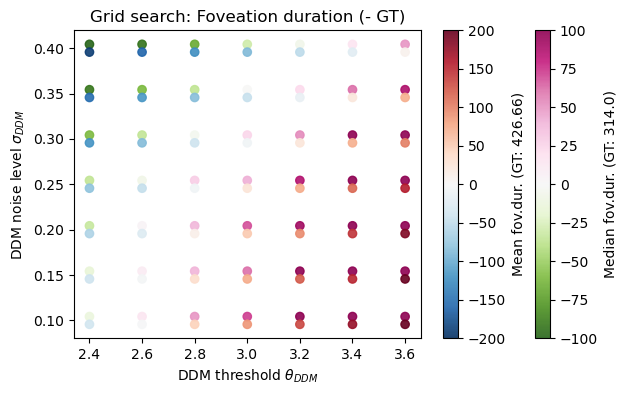

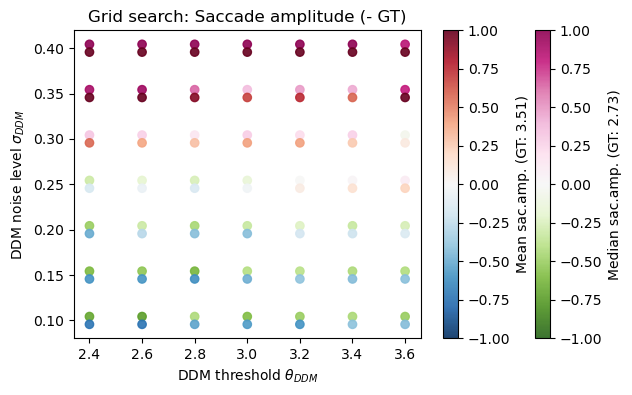

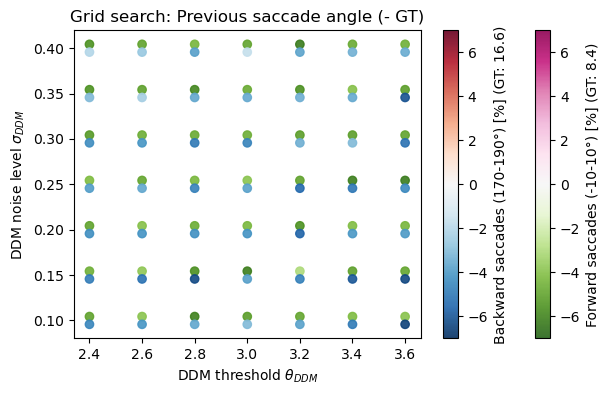

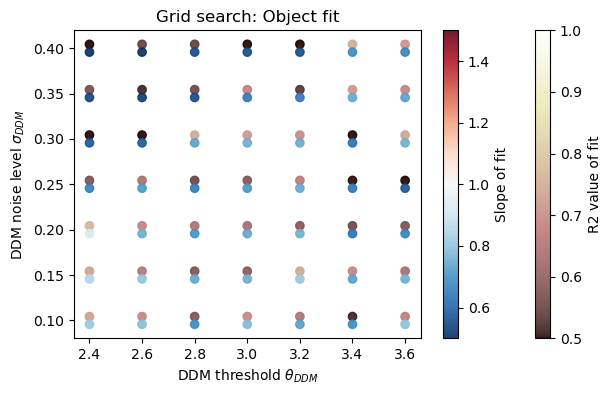

,"(dv, sig)",mean_fd,median_fd,mean_sa,median_sa,fwd_sac,bwd_sac,obj_slope,obj_r2
0,"(2.4, 0.1)",388.379739,301.183435,2.786086,2.031576,0.033010,0.120388,0.810497,0.725695
1,"(2.4, 0.15)",385.090408,298.095605,2.919543,2.121233,0.037572,0.117534,0.850839,0.729294
2,"(2.4, 0.2)",364.351928,281.030276,3.010454,2.224749,0.032817,0.123063,0.925537,0.764719
3,"(2.4, 0.25)",345.493141,278.552539,3.350847,2.425091,0.041594,0.127383,0.653924,0.569450
4,"(2.4, 0.3)",306.888074,253.512736,4.085082,3.049148,0.030256,0.122576,0.570261,0.466438


In [29]:
runs = [dir for dir in os.listdir("/scratch/vito/scanpathes/results/") if ("_presac0.8_sens1.0_5seeds_" in dir) and ("2024-02-02-" in dir)]
print("Number of runs:",len(runs), "\ne.g.:", runs[0])

df_presac08s1 = eval_runs_to_dataframe_grid_all(runs, df_gt, "dv", "sig")
plot_fov_dur_grid(df_presac08s1, df_gt)
plot_sac_amp_grid(df_presac08s1, df_gt)
plot_prev_ang_grid(df_presac08s1, df_gt)
plot_obj_fit_grid(df_presac08s1)
df_presac08s1.head()

In [19]:
sorted(os.listdir("/scratch/vito/scanpathes/results/"))

['2023-12-21-15-18-03_test',
 '2023-12-21-15-23-27_test',
 '2024-01-01-20-21-46_cb_base__nopresac_dv2.0_sig0.0',
 '2024-01-01-20-21-47_cb_base__nopresac_dv2.0_sig0.05',
 '2024-01-01-20-21-49_cb_base__nopresac_dv2.0_sig0.1',
 '2024-01-01-20-21-50_cb_base__nopresac_dv2.0_sig0.15',
 '2024-01-01-20-21-51_cb_base__nopresac_dv2.0_sig0.2',
 '2024-01-01-20-21-52_cb_base__nopresac_dv2.0_sig0.25',
 '2024-01-01-20-21-53_cb_base__nopresac_dv2.0_sig0.3',
 '2024-01-01-20-21-55_cb_base__nopresac_dv2.0_sig0.35',
 '2024-01-01-20-21-56_cb_base__nopresac_dv2.1_sig0.0',
 '2024-01-01-20-21-57_cb_base__nopresac_dv2.1_sig0.05',
 '2024-01-01-20-21-58_cb_base__nopresac_dv2.1_sig0.1',
 '2024-01-01-20-21-59_cb_base__nopresac_dv2.1_sig0.15',
 '2024-01-01-20-22-00_cb_base__nopresac_dv2.1_sig0.2',
 '2024-01-01-20-22-02_cb_base__nopresac_dv2.1_sig0.25',
 '2024-01-01-20-22-03_cb_base__nopresac_dv2.1_sig0.3',
 '2024-01-01-20-22-04_cb_base__nopresac_dv2.1_sig0.35',
 '2024-01-01-20-22-05_cb_base__nopresac_dv2.2_sig0.0',

## Grid with 0.8 presac (but only 1 seed :-/ )

44 2024-01-12-19-45-19_cb_base_presac0.8_sens0.8_dv2.4_sig0.23


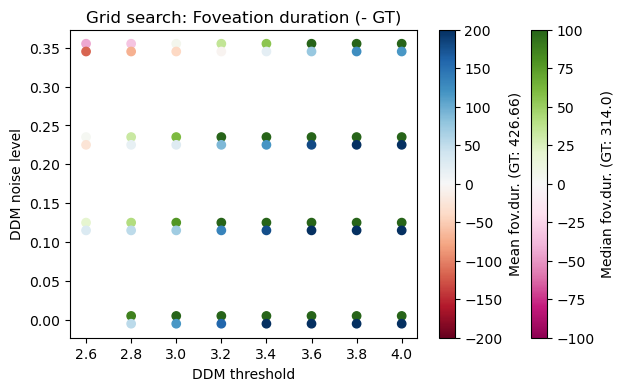

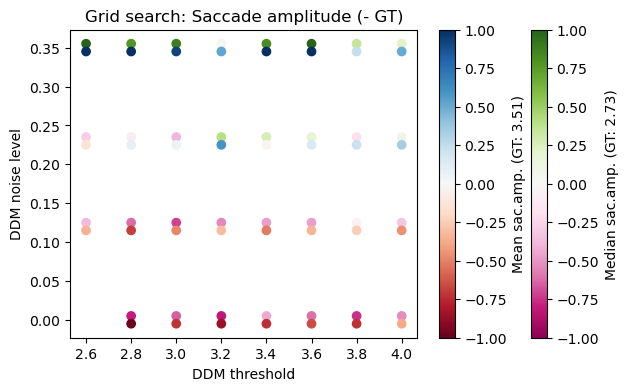

In [9]:
runs = [dir for dir in os.listdir("/scratch/vito/scanpathes/results/") if "2024-01-12-" in dir]
print(len(runs), runs[0])

df_presac1seed = eval_runs_to_dataframe_dv_sig(runs)
plot_fov_dur_dv_sig_grid(df_presac1seed, df_gt)
plot_sac_amp_dv_sig_grid(df_presac1seed, df_gt)

## Presac 08 with sens 08

In [ ]:
RES_DIRECTORIES = sorted(glob.iglob("/scratch/vito/scanpathes/results/*"))[::-1]
grid_dirs = sorted([x for x in RES_DIRECTORIES if "_5seeds_" in x])
ntrials = []
for RES_DIR in grid_dirs:
    res_files = []
    for path, subdirs, files in os.walk(RES_DIR):
        for name in files:
            if name == "raw_results.pickle4":
                res_files.append(os.path.join(path, name))
    ntrials.append(len(res_files))
    print(RES_DIR, len(res_files))
    


In [ ]:
plt.plot(ntrials)
print(max(ntrials), min(ntrials), np.mean(ntrials), np.std(ntrials))

In [ ]:
runs = [dir for dir in os.listdir("/scratch/vito/scanpathes/results/") if "presac0.8_sens0.8_5seeds" in dir]
print(len(runs), runs[0])

df_presac08 = eval_runs_to_dataframe_dv_sig(runs)
plot_fov_dur_dv_sig_grid(df_presac08, df_gt)
plot_sac_amp_dv_sig_grid(df_presac08, df_gt)

In [ ]:
runs = [dir for dir in os.listdir("/scratch/vito/scanpathes/results/") if "presac0.8_sens1_5seeds" in dir]
print(len(runs), runs[0])

df_presac1 = eval_runs_to_dataframe_dv_sig(runs)
plot_fov_dur_dv_sig_grid(df_presac1, df_gt)
plot_sac_amp_dv_sig_grid(df_presac1, df_gt)